In [1]:
import prior

dataset = prior.load_dataset("procthor-10k")
dataset

[AI2-THOR WARNING] There has been an update to ProcTHOR-10K that must be used with AI2-THOR version 5.0+. To use the new version of ProcTHOR-10K, please update AI2-THOR to version 5.0+ by running:
    pip install --upgrade ai2thor
Alternatively, to downgrade to the old version of ProcTHOR-10K, run:
   prior.load_dataset("procthor-10k", revision="ab3cacd0fc17754d4c080a3fd50b18395fae8647")


Loading test: 100%|██████████| 1000/1000 [00:00<00:00, 12165.16it/s]


DatasetDict(
    train=Dataset(
    dataset=procthor-dataset,
    size=10000,
    split=train
),
    val=Dataset(
    dataset=procthor-dataset,
    size=1000,
    split=val
),
    test=Dataset(
    dataset=procthor-dataset,
    size=1000,
    split=test
)
)

In [2]:
from ai2thor.controller import Controller


house = dataset["train"][3]
controller = Controller(scene=house, snapToGrid=False, rotateStepDegrees=30)
event = controller.step("Pass")
spawn = event.metadata["agent"]["position"]

/home/juyuanli/miniconda3/envs/nav_assistant/lib/python3.11/site-packages/ai2thor/platform.py:154: UserWarning: could not connect to X Display: 5, Can't connect to display ":5": b'Authorization required, but no authorization protocol specified\n'
  warnings.warn(


In [3]:
import numpy as np
def teleport(controller, target=None):
    event = controller.step("GetReachablePositions")
    reachable_positions = event.metadata["actionReturn"]
    # Pick a random target
    if target is None:
        target = np.random.choice(reachable_positions)

    event = controller.step(
        action="TeleportFull",
        x=target["x"],
        y=target["y"],
        z=target["z"],
        rotation={"x": 0, "y": 0, "z": 0},
        horizon=0,
        standing=True
    )

    return event


In [4]:
from rl import PPO, ActorCritic, Env, RolloutBuffer, ClipEnv, CLIPNovelty
from models import LSTMActor, LSTMCritic, CompleteFrozenResNetEncoder, SlidingWindowTransformerActor, SlidingWindowTransformerCritic, SmallCNNEncoder
from cons import MINIBATCHES, EPISODE_STEPS, FEAT_DIM, NUM_ACTIONS, DEVICE

In [5]:
import torch
import matplotlib.pyplot as plt
from rl import save_actor_critic

def train(controller, name: str, ppo: PPO, env: Env, actor_critic: ActorCritic, total_updates=10):
    event = controller.step("Pass")  # prime
    rewards = []
    episode_rewards = []
    for upd in range(total_updates):
        buf = RolloutBuffer()
        for mb in range(MINIBATCHES):
            # collect episodes
            episode_seq = []
            episode_reward = 0
            actions_seq = []
            for t in range(1, EPISODE_STEPS + 1):
                with torch.no_grad():
                    obs_t = ppo.obs_from_event(event)  # (C,H,W)
                    obs_encoded = actor_critic.actor_critic_encoder(obs_t.unsqueeze(0).unsqueeze(0)).squeeze(0).squeeze(0) # (D)
                    obs_seq = torch.stack(episode_seq + [obs_encoded], dim=0).to(device=DEVICE)

                if len(actions_seq) == 0:
                    actions_seq.append(torch.randint(0, NUM_ACTIONS, (1, 1)).item())
                
                actions_tensor = torch.tensor(actions_seq, dtype=torch.long, device=DEVICE)
                logits, value = ppo.act_and_value(obs_seq, actions_tensor, actor_critic)
                dist = torch.distributions.Categorical(logits=logits)
                action_idx = dist.sample()
                logp = dist.log_prob(action_idx)
                
                action_idx, logp = action_idx.item(), logp.item()
                event, reward = env.step_env(controller, action_idx)
                done = t == EPISODE_STEPS

                # store one step
                buf.add(obs_t, action_idx, logp, reward, value, done)
                episode_seq.append(obs_encoded)
                rewards.append(reward)
                actions_seq.append(action_idx)
                
                episode_reward += reward / EPISODE_STEPS

                # 50% chance of teleport
                if done:
                    env.reset()
                    if np.random.rand() > 0.5:
                        event = teleport(controller)
            episode_rewards.append(episode_reward)
                
        ppo.ppo_update(buf, actor_critic)
        if (upd + 1) % 10 == 0:
            save_actor_critic(actor_critic, f"chkpoint_{upd}.pt")
        save_actor_critic(actor_critic, name)
        
        print(f"Update {upd+1}/{total_updates} — steps: {len(buf)}")
        plt.plot(rewards)
        plt.show()
        plt.plot(episode_rewards)
        plt.show()
    return buf, rewards

In [6]:
ENTROPY_COEF = 0.05

ppo = PPO(ENTROPY_COEF)
encoder = CompleteFrozenResNetEncoder(FEAT_DIM)
actor = SlidingWindowTransformerActor(FEAT_DIM, NUM_ACTIONS)
critic = SlidingWindowTransformerCritic(FEAT_DIM)
clip_novelty = CLIPNovelty()
clip_env = ClipEnv(clip_novelty)
clip_actor_critic = ActorCritic(encoder, actor, critic)


[PPO] Epoch 0: Loss=47.6517, Policy=0.0077, Value=95.3885
[PPO] Epoch 10: Loss=39.9624, Policy=0.0226, Value=79.9871
[PPO] Epoch 20: Loss=32.6921, Policy=-0.0051, Value=65.5002
[PPO] Epoch 30: Loss=27.7637, Policy=-0.0089, Value=55.6472
Approx KL Learned: 0.0351826474070549
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 1/100 — steps: 2048


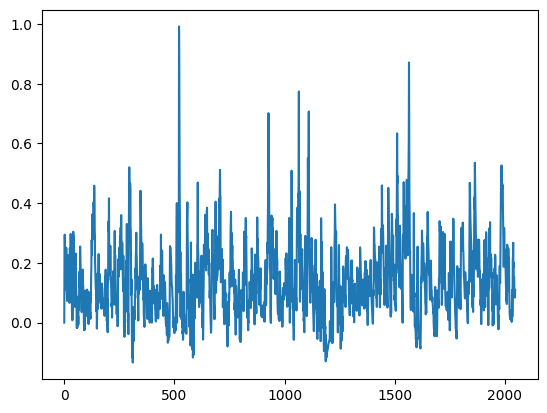

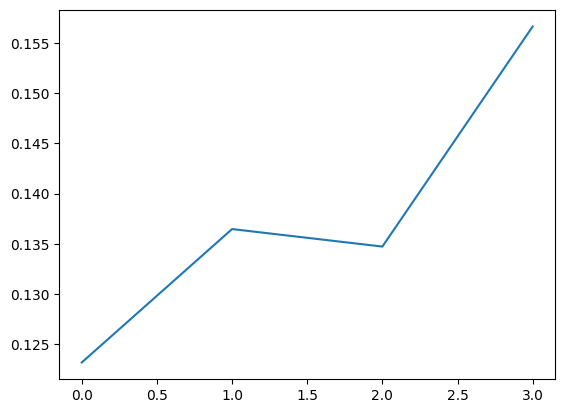

[PPO] Epoch 0: Loss=69.7386, Policy=0.0062, Value=139.5697
[PPO] Epoch 10: Loss=47.8558, Policy=0.0013, Value=95.8149
[PPO] Epoch 20: Loss=38.0193, Policy=-0.0048, Value=76.1545
[PPO] Epoch 30: Loss=31.5836, Policy=-0.0108, Value=63.2950
Approx KL Learned: 0.01807529479265213
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 2/100 — steps: 2048


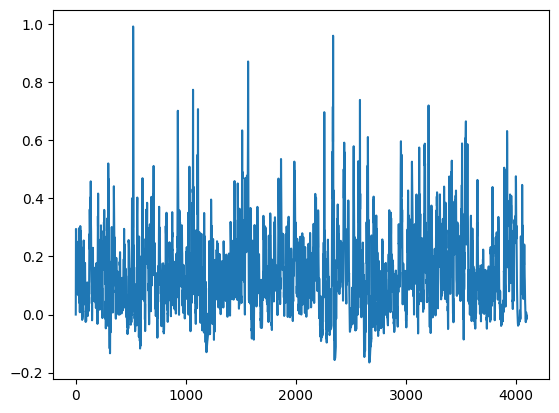

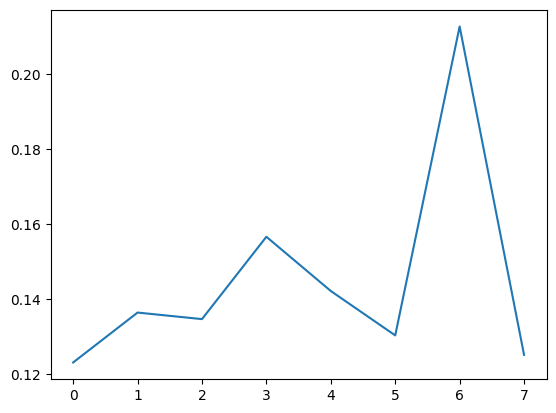

[PPO] Epoch 0: Loss=68.3915, Policy=0.0012, Value=136.8864
[PPO] Epoch 10: Loss=56.6737, Policy=-0.0007, Value=113.4528
[PPO] Epoch 20: Loss=48.9484, Policy=-0.0047, Value=98.0104
[PPO] Epoch 30: Loss=44.2263, Policy=-0.0151, Value=88.5868
Approx KL Learned: 0.0202094204723835
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 3/100 — steps: 2048


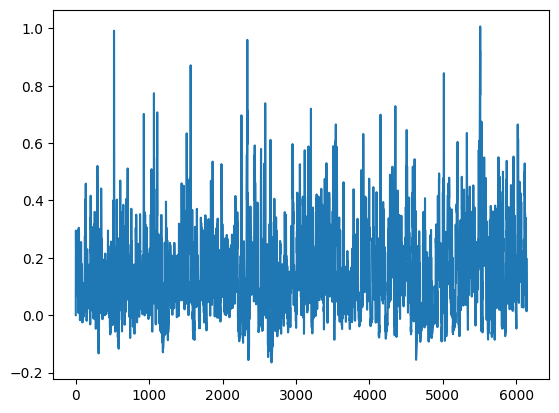

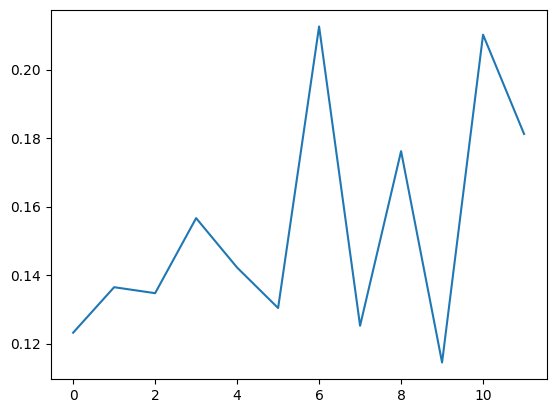

[PPO] Epoch 0: Loss=71.6752, Policy=-0.0011, Value=143.4531
[PPO] Epoch 10: Loss=53.7188, Policy=-0.0095, Value=107.5566
[PPO] Epoch 20: Loss=44.7666, Policy=-0.0137, Value=89.6611
[PPO] Epoch 30: Loss=36.0740, Policy=-0.0176, Value=72.2838
Approx KL Learned: 0.01843746192753315
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 4/100 — steps: 2048


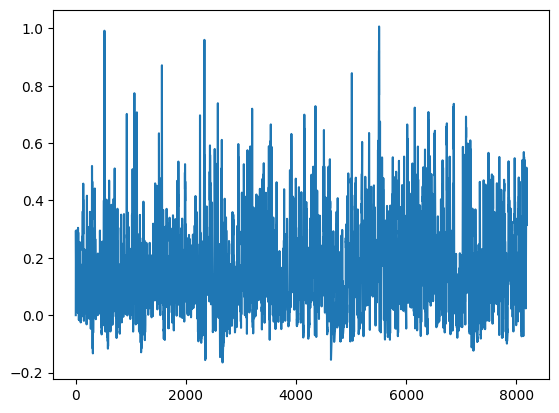

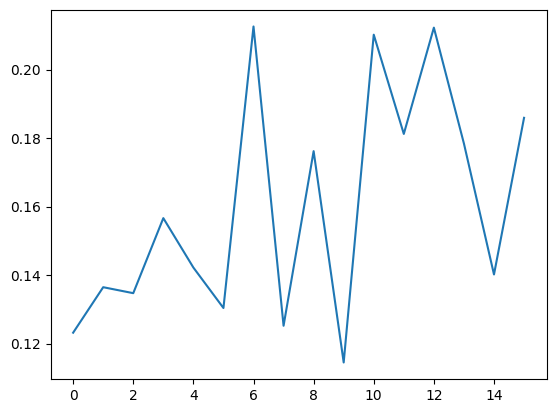

[PPO] Epoch 0: Loss=69.2052, Policy=-0.0001, Value=138.5128
[PPO] Epoch 10: Loss=49.3218, Policy=-0.0088, Value=98.7623
[PPO] Epoch 20: Loss=41.2724, Policy=-0.0030, Value=82.6536
[PPO] Epoch 30: Loss=36.1924, Policy=-0.0087, Value=72.5000
Approx KL Learned: 0.026717225089669228
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 5/100 — steps: 2048


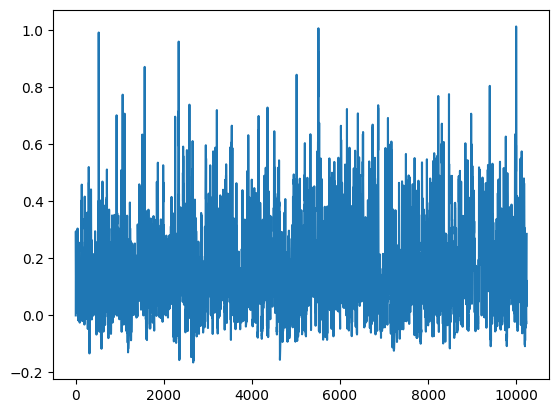

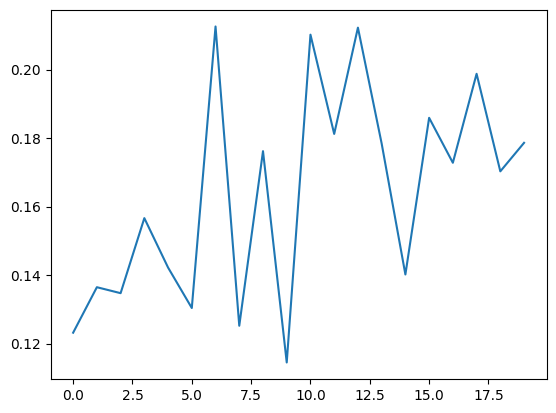

[PPO] Epoch 0: Loss=117.6823, Policy=0.0006, Value=235.4629
[PPO] Epoch 10: Loss=74.9700, Policy=0.0005, Value=150.0379
[PPO] Epoch 20: Loss=56.8949, Policy=-0.0056, Value=113.8997
[PPO] Epoch 30: Loss=49.3271, Policy=-0.0144, Value=98.7823
Approx KL Learned: 0.02183278650045395
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 6/100 — steps: 2048


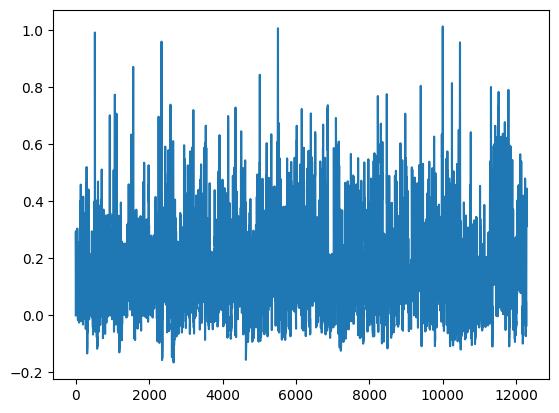

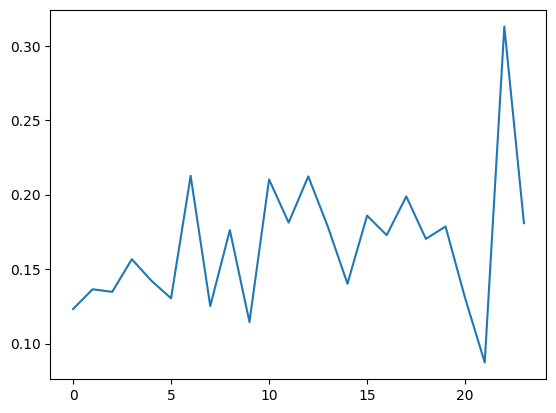

[PPO] Epoch 0: Loss=80.0951, Policy=0.0037, Value=160.2836
[PPO] Epoch 10: Loss=50.1341, Policy=-0.0061, Value=100.3796
[PPO] Epoch 20: Loss=41.9514, Policy=-0.0135, Value=84.0280
[PPO] Epoch 30: Loss=32.6002, Policy=-0.0206, Value=65.3383
Approx KL Learned: 0.023614488542079926
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 7/100 — steps: 2048


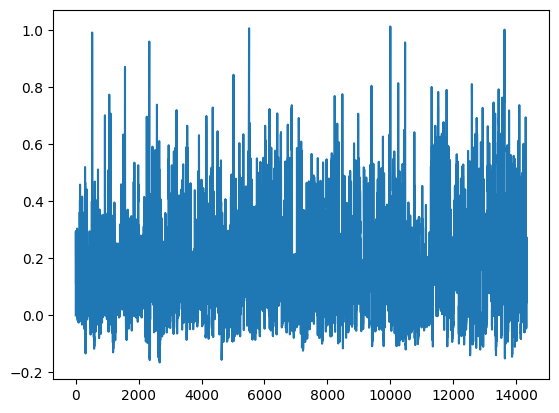

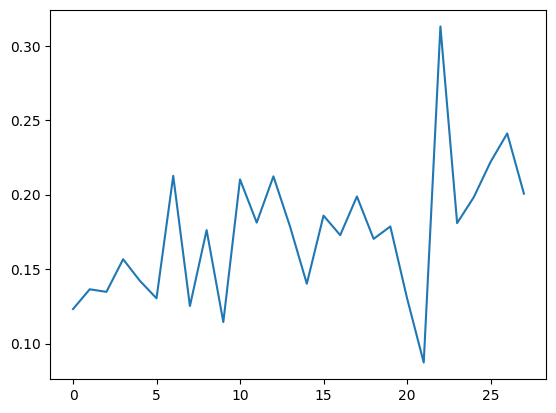

[PPO] Epoch 0: Loss=73.1519, Policy=0.0005, Value=146.3978
[PPO] Epoch 10: Loss=52.3292, Policy=-0.0054, Value=104.7651
[PPO] Epoch 20: Loss=38.7585, Policy=-0.0146, Value=77.6422
[PPO] Epoch 30: Loss=32.3243, Policy=-0.0128, Value=64.7733
Approx KL Learned: 0.03114234283566475
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 8/100 — steps: 2048


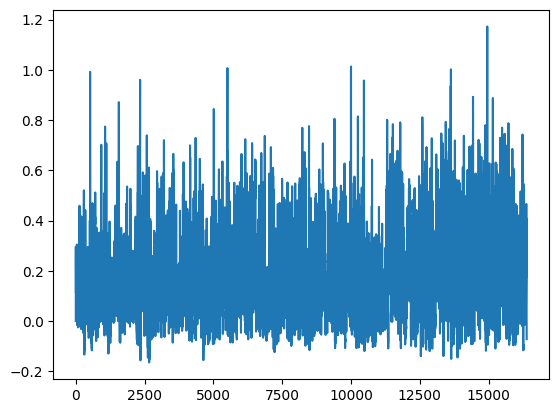

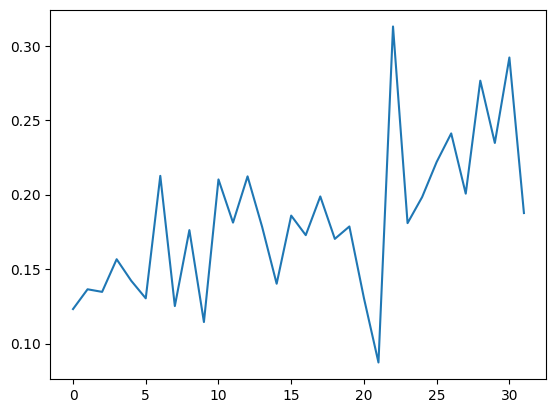

[PPO] Epoch 0: Loss=81.7799, Policy=0.0031, Value=163.6472
[PPO] Epoch 10: Loss=52.6358, Policy=0.0012, Value=105.3603
[PPO] Epoch 20: Loss=39.0374, Policy=-0.0127, Value=78.1878
[PPO] Epoch 30: Loss=32.2378, Policy=-0.0186, Value=64.6035
Approx KL Learned: 0.023945873603224754
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 9/100 — steps: 2048


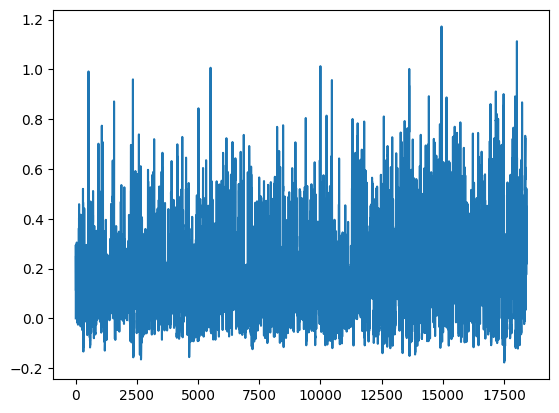

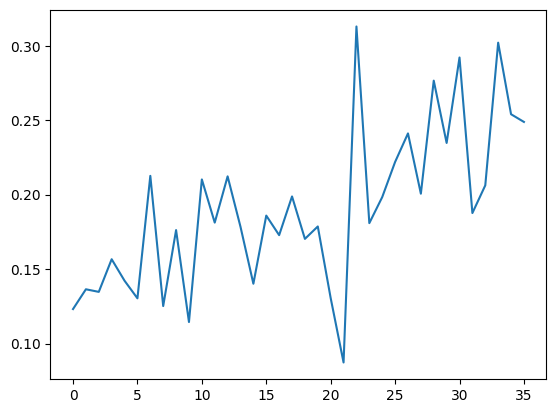

[PPO] Epoch 0: Loss=77.1593, Policy=0.0044, Value=154.4001
[PPO] Epoch 10: Loss=57.0163, Policy=0.0008, Value=114.1238
[PPO] Epoch 20: Loss=38.0604, Policy=-0.0105, Value=76.2343
[PPO] Epoch 30: Loss=24.3502, Policy=-0.0067, Value=48.8076
Approx KL Learned: 0.07400773465633392
[✅] Actor-Critic checkpoint saved to chkpoint_9.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 10/100 — steps: 2048


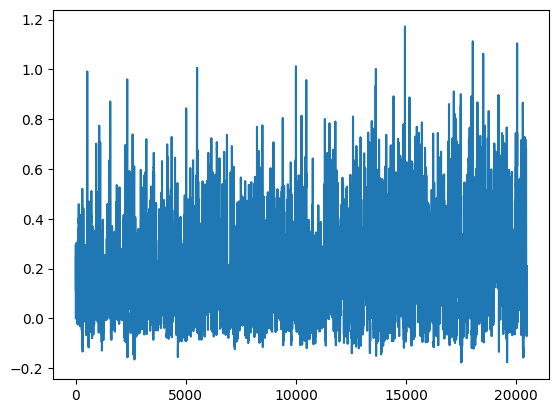

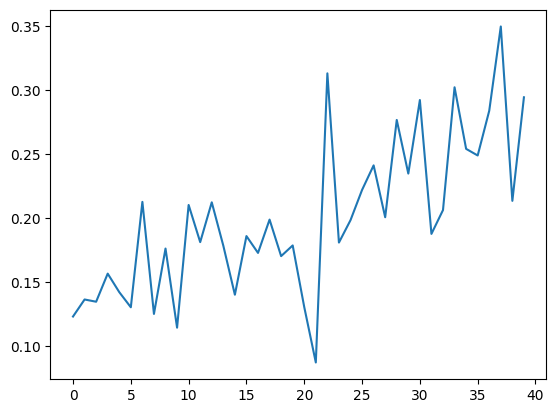

[PPO] Epoch 0: Loss=66.2344, Policy=-0.0006, Value=132.5562
[PPO] Epoch 10: Loss=49.8079, Policy=-0.0021, Value=99.7085
[PPO] Epoch 20: Loss=36.4629, Policy=-0.0073, Value=73.0285
[PPO] Epoch 30: Loss=29.4121, Policy=-0.0103, Value=58.9334
Approx KL Learned: 0.02388405241072178
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 11/100 — steps: 2048


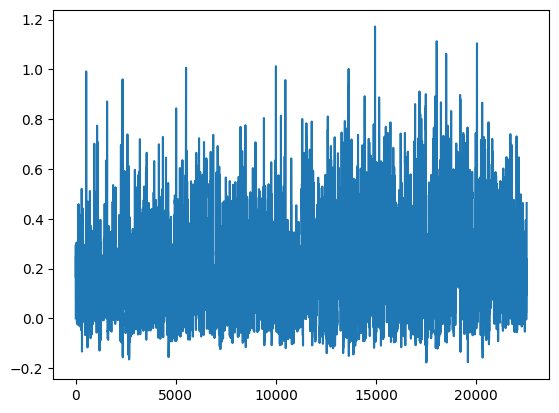

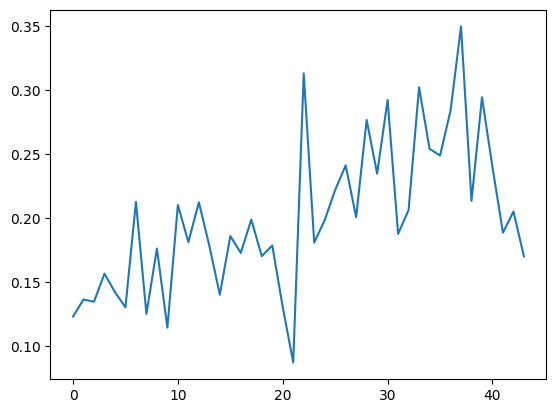

[PPO] Epoch 0: Loss=57.0763, Policy=0.0004, Value=114.2436
[PPO] Epoch 10: Loss=37.7839, Policy=-0.0090, Value=75.6778
[PPO] Epoch 20: Loss=27.4354, Policy=-0.0186, Value=54.9982
[PPO] Epoch 30: Loss=27.2506, Policy=-0.0203, Value=54.6328
Approx KL Learned: 0.021692197769880295
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 12/100 — steps: 2048


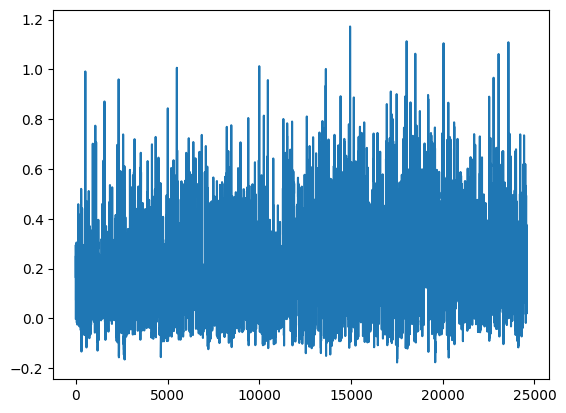

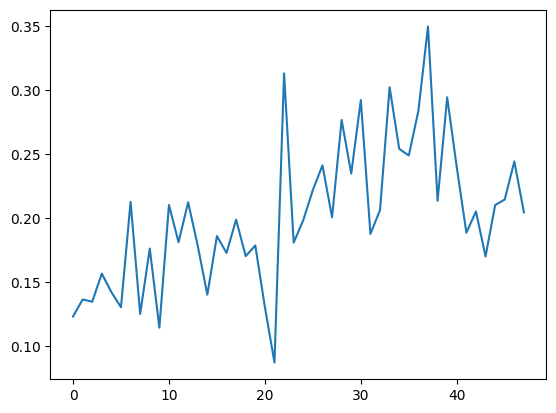

[PPO] Epoch 0: Loss=58.8781, Policy=-0.0009, Value=117.8437
[PPO] Epoch 10: Loss=38.5858, Policy=-0.0117, Value=77.2802
[PPO] Epoch 20: Loss=29.2712, Policy=0.0030, Value=58.6210
[PPO] Epoch 30: Loss=26.8052, Policy=-0.0127, Value=53.7187
Approx KL Learned: 0.07493442296981812
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 13/100 — steps: 2048


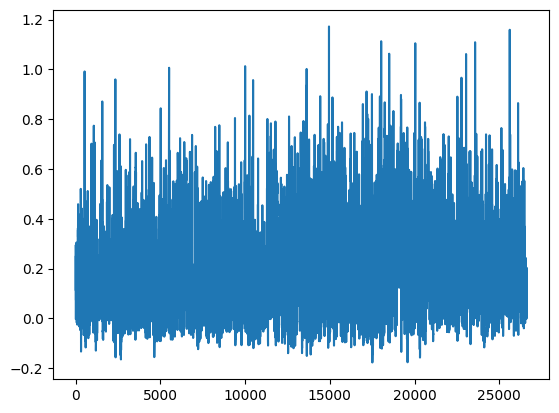

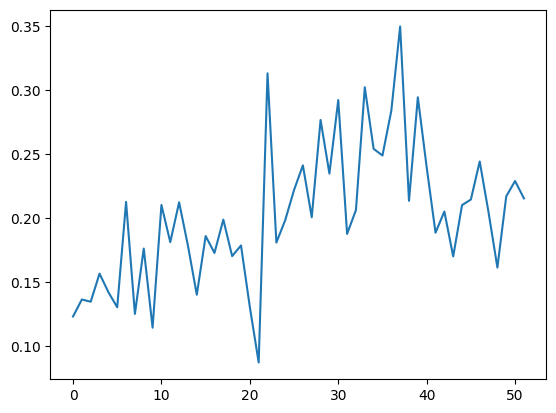

[PPO] Epoch 0: Loss=76.4303, Policy=-0.0018, Value=152.9570
[PPO] Epoch 10: Loss=64.5469, Policy=-0.0025, Value=129.1907
[PPO] Epoch 20: Loss=45.7957, Policy=-0.0065, Value=91.6956
[PPO] Epoch 30: Loss=42.7870, Policy=-0.0147, Value=85.6965
Approx KL Learned: 0.011501582339406013
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 14/100 — steps: 2048


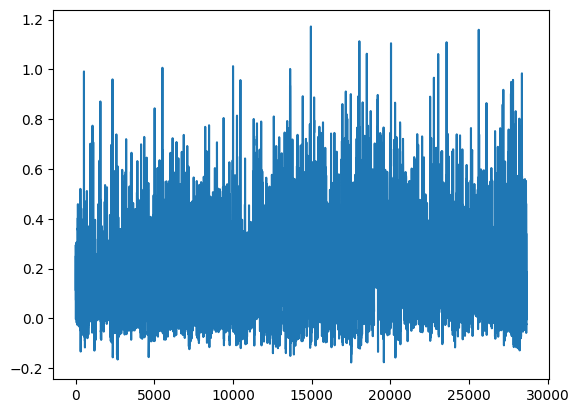

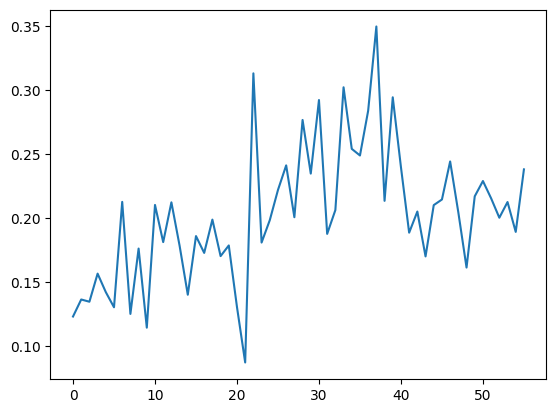

[PPO] Epoch 0: Loss=68.0385, Policy=0.0034, Value=136.1598
[PPO] Epoch 10: Loss=47.6505, Policy=-0.0002, Value=95.3901
[PPO] Epoch 20: Loss=32.2174, Policy=-0.0146, Value=64.5527
[PPO] Epoch 30: Loss=22.0855, Policy=-0.0142, Value=44.2880
Approx KL Learned: 0.015122964978218079
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 15/100 — steps: 2048


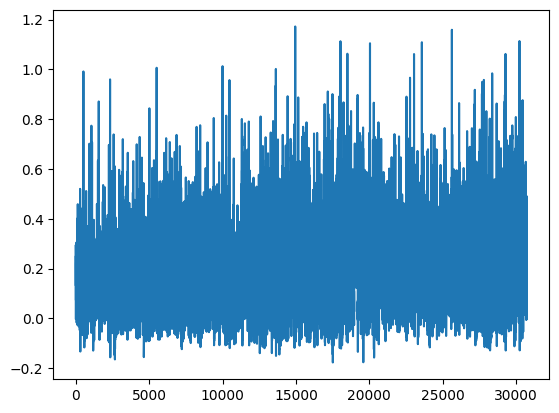

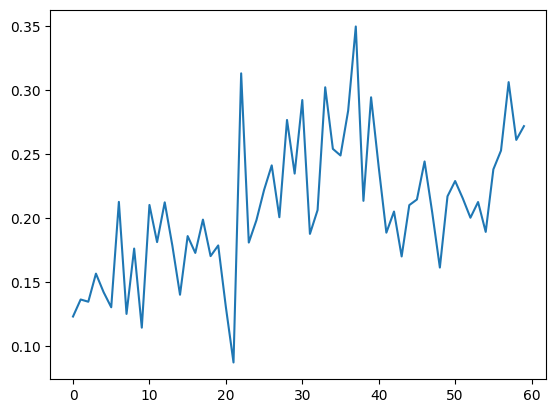

[PPO] Epoch 0: Loss=87.7589, Policy=-0.0003, Value=175.6065
[PPO] Epoch 10: Loss=43.5847, Policy=-0.0052, Value=87.2676
[PPO] Epoch 20: Loss=32.1965, Policy=-0.0195, Value=64.5188
[PPO] Epoch 30: Loss=28.6299, Policy=-0.0255, Value=57.3984
Approx KL Learned: 0.049175411462783813
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 16/100 — steps: 2048


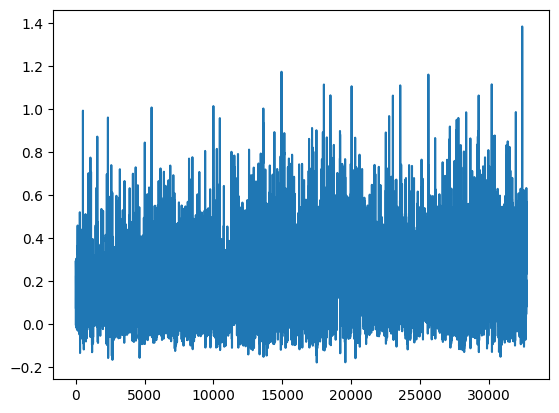

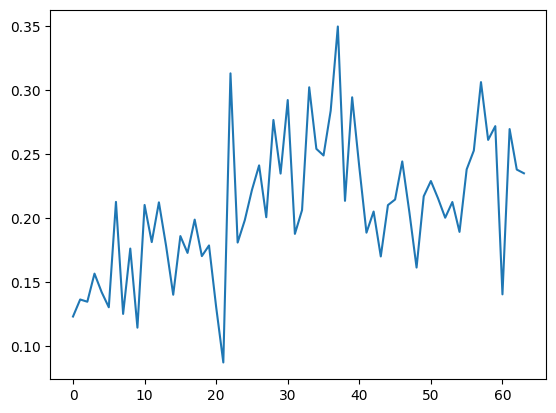

[PPO] Epoch 0: Loss=74.2810, Policy=-0.0003, Value=148.6508
[PPO] Epoch 10: Loss=52.2024, Policy=-0.0090, Value=104.5076
[PPO] Epoch 20: Loss=39.2868, Policy=-0.0235, Value=78.7069
[PPO] Epoch 30: Loss=31.8259, Policy=-0.0371, Value=63.8142
Approx KL Learned: 0.04484662413597107
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 17/100 — steps: 2048


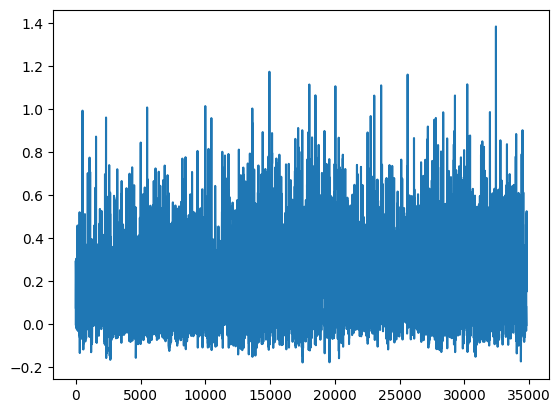

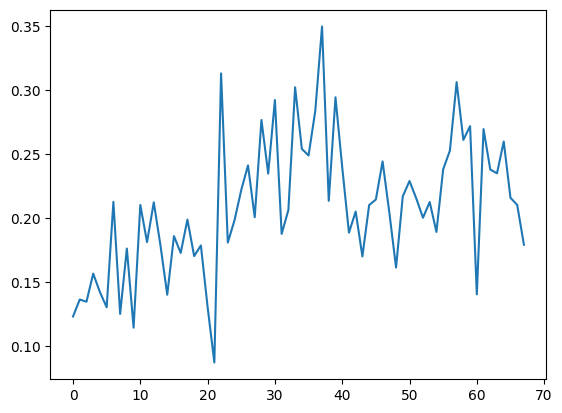

[PPO] Epoch 0: Loss=65.4850, Policy=0.0047, Value=131.0489
[PPO] Epoch 10: Loss=42.3956, Policy=-0.0039, Value=84.8847
[PPO] Epoch 20: Loss=32.0365, Policy=-0.0181, Value=64.1966
[PPO] Epoch 30: Loss=26.8339, Policy=-0.0249, Value=53.8039
Approx KL Learned: 0.018316125497221947
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 18/100 — steps: 2048


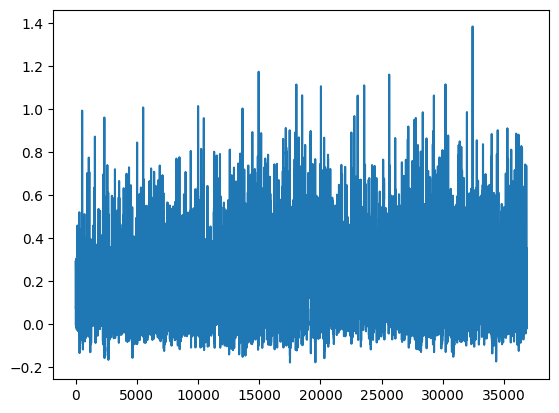

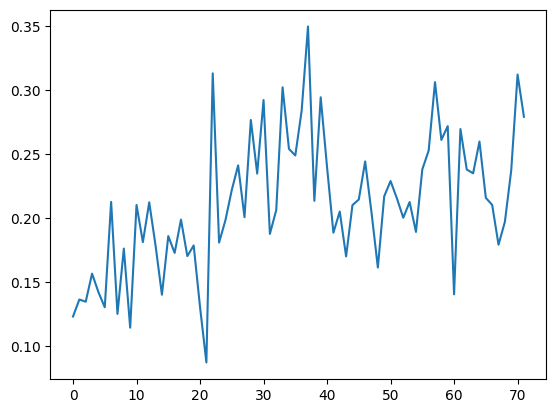

[PPO] Epoch 0: Loss=85.5104, Policy=0.0027, Value=171.1060
[PPO] Epoch 10: Loss=49.3490, Policy=-0.0061, Value=98.8010
[PPO] Epoch 20: Loss=34.2907, Policy=-0.0265, Value=68.7234
[PPO] Epoch 30: Loss=28.6289, Policy=-0.0242, Value=57.3919
Approx KL Learned: 0.03785349056124687
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 19/100 — steps: 2048


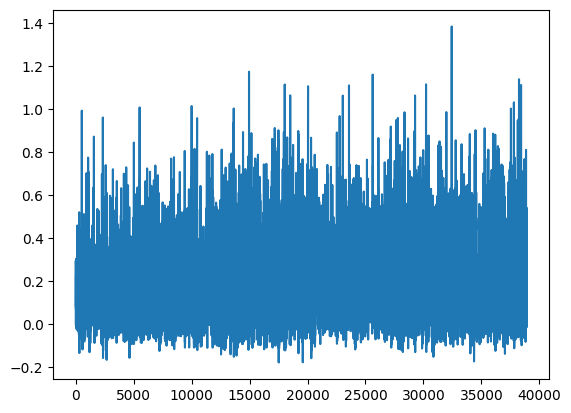

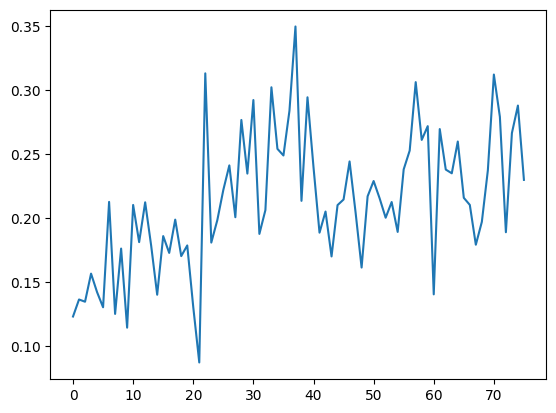

[PPO] Epoch 0: Loss=68.0859, Policy=0.0039, Value=136.2510
[PPO] Epoch 10: Loss=46.4394, Policy=-0.0017, Value=92.9675
[PPO] Epoch 20: Loss=35.4747, Policy=-0.0146, Value=71.0643
[PPO] Epoch 30: Loss=29.7157, Policy=0.0381, Value=59.4431
Approx KL Learned: 0.047876641154289246
[✅] Actor-Critic checkpoint saved to chkpoint_19.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 20/100 — steps: 2048


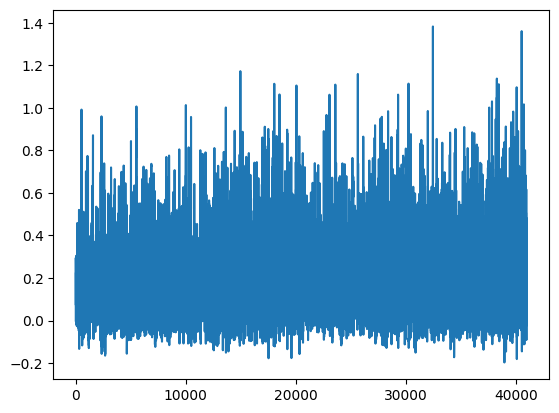

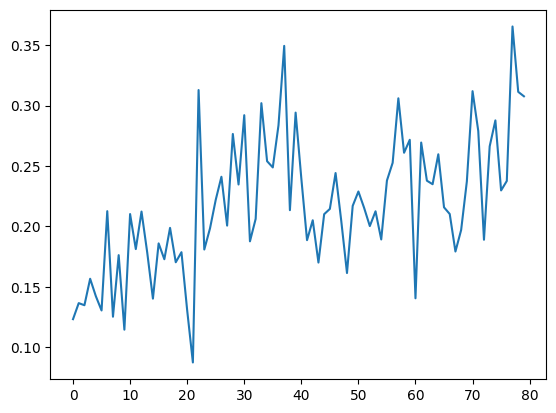

[PPO] Epoch 0: Loss=61.6437, Policy=0.0093, Value=123.3565
[PPO] Epoch 10: Loss=37.1221, Policy=-0.0186, Value=74.3665
[PPO] Epoch 20: Loss=21.3395, Policy=-0.0308, Value=42.8266
[PPO] Epoch 30: Loss=15.2740, Policy=-0.0436, Value=30.7198
Approx KL Learned: 0.0444483757019043
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 21/100 — steps: 2048


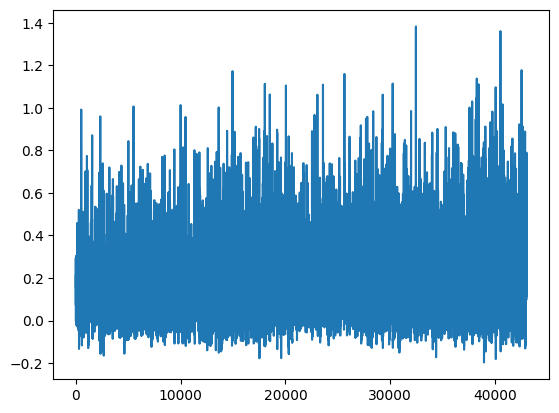

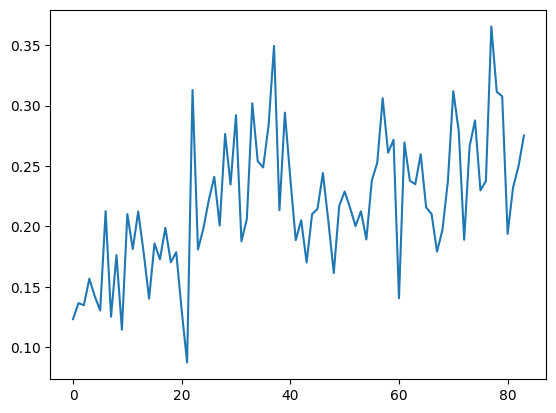

[PPO] Epoch 0: Loss=94.9233, Policy=0.0071, Value=189.9224
[PPO] Epoch 10: Loss=55.5882, Policy=-0.0049, Value=111.2768
[PPO] Epoch 20: Loss=38.2223, Policy=-0.0184, Value=76.5713
[PPO] Epoch 30: Loss=31.8030, Policy=-0.0294, Value=63.7548
Approx KL Learned: 0.0677497386932373
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 22/100 — steps: 2048


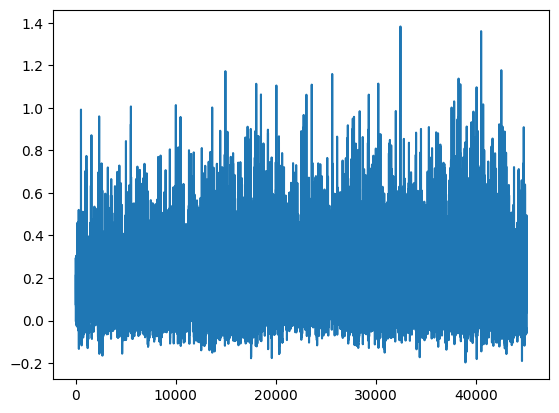

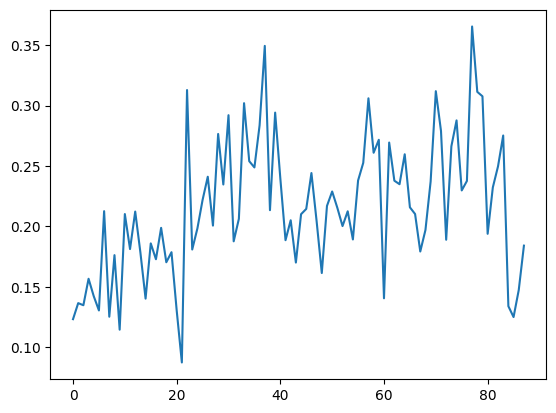

[PPO] Epoch 0: Loss=85.8614, Policy=0.0083, Value=171.7933
[PPO] Epoch 10: Loss=61.4064, Policy=-0.0060, Value=122.9104
[PPO] Epoch 20: Loss=45.3932, Policy=-0.0244, Value=90.9237
[PPO] Epoch 30: Loss=37.4782, Policy=-0.0400, Value=75.1234
Approx KL Learned: 0.03524232283234596
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 23/100 — steps: 2048


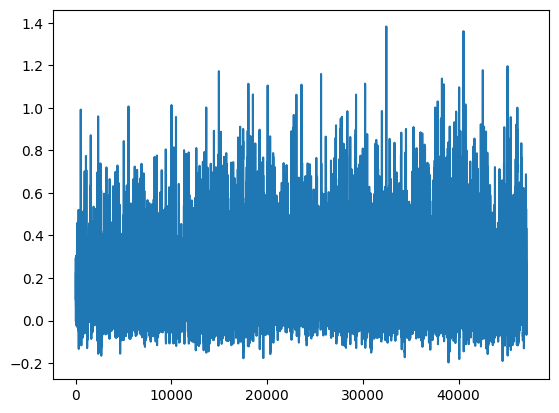

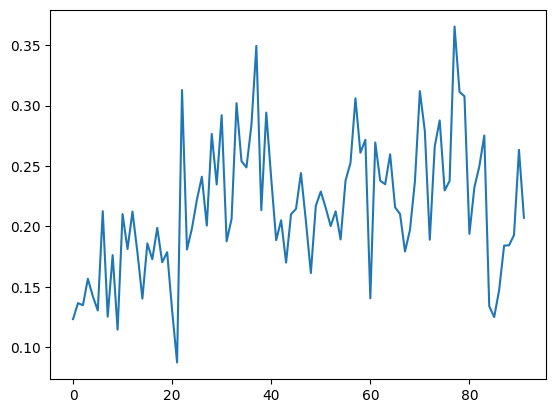

[PPO] Epoch 0: Loss=94.6028, Policy=0.0140, Value=189.2685
[PPO] Epoch 10: Loss=45.5859, Policy=-0.0059, Value=91.2748
[PPO] Epoch 20: Loss=29.7452, Policy=-0.0232, Value=59.6274
[PPO] Epoch 30: Loss=22.9727, Policy=-0.0330, Value=46.1024
Approx KL Learned: 0.16684460639953613
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 24/100 — steps: 2048


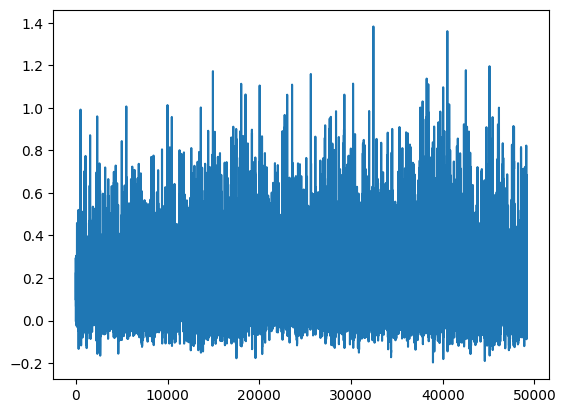

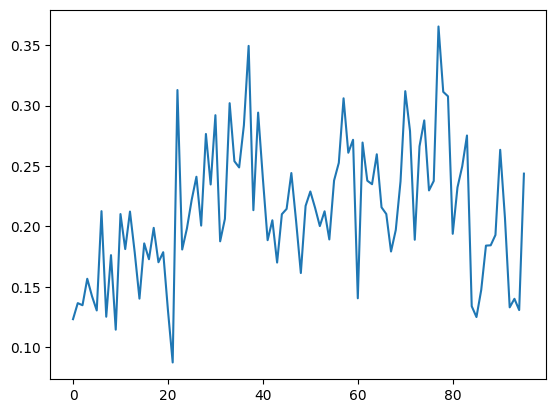

[PPO] Epoch 0: Loss=90.9593, Policy=0.0030, Value=182.0002
[PPO] Epoch 10: Loss=69.4805, Policy=-0.0034, Value=139.0569
[PPO] Epoch 20: Loss=53.0809, Policy=-0.0096, Value=106.2701
[PPO] Epoch 30: Loss=41.0831, Policy=-0.0230, Value=82.3030
Approx KL Learned: 0.05679996684193611
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 25/100 — steps: 2048


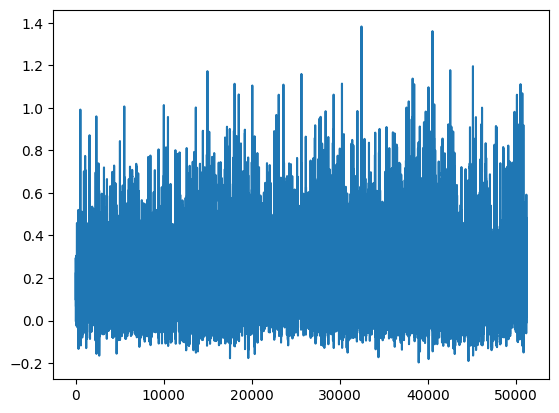

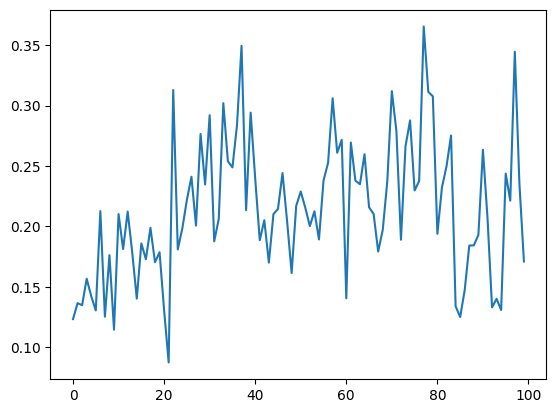

[PPO] Epoch 0: Loss=52.0862, Policy=0.0051, Value=104.2556
[PPO] Epoch 10: Loss=33.8540, Policy=-0.0177, Value=67.8365
[PPO] Epoch 20: Loss=21.8167, Policy=-0.0287, Value=43.7853
[PPO] Epoch 30: Loss=14.7172, Policy=-0.0354, Value=29.5991
Approx KL Learned: 0.03335149586200714
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 26/100 — steps: 2048


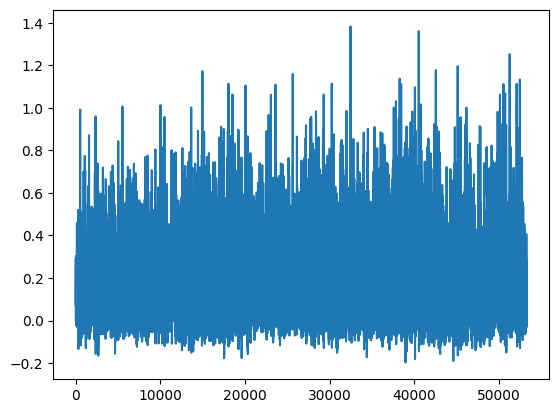

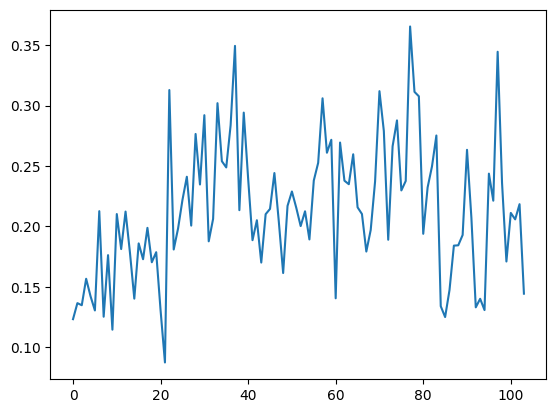

[PPO] Epoch 0: Loss=86.9061, Policy=0.0086, Value=173.8821
[PPO] Epoch 10: Loss=48.3650, Policy=-0.0000, Value=96.8158
[PPO] Epoch 20: Loss=33.1007, Policy=-0.0126, Value=66.3137
[PPO] Epoch 30: Loss=26.0056, Policy=-0.0220, Value=52.1422
Approx KL Learned: 0.025974776595830917
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 27/100 — steps: 2048


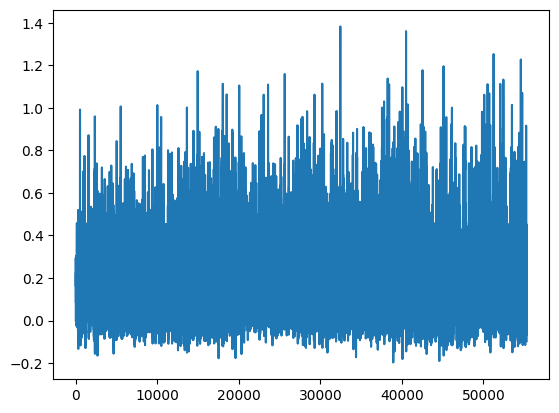

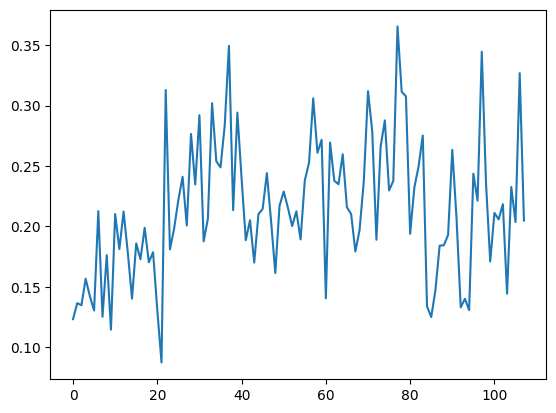

[PPO] Epoch 0: Loss=101.1306, Policy=0.0069, Value=202.3373
[PPO] Epoch 10: Loss=49.2776, Policy=-0.0084, Value=98.6626
[PPO] Epoch 20: Loss=37.2655, Policy=-0.0267, Value=74.6772
[PPO] Epoch 30: Loss=31.2914, Policy=-0.0426, Value=62.7593
Approx KL Learned: 0.04542471095919609
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 28/100 — steps: 2048


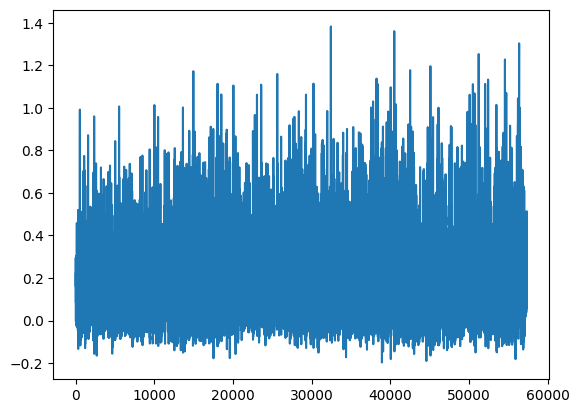

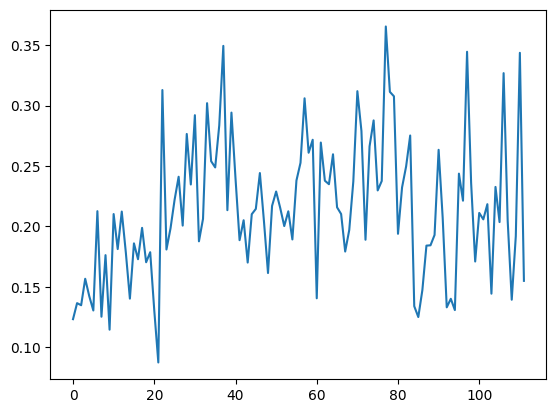

[PPO] Epoch 0: Loss=76.6355, Policy=0.0049, Value=153.3496
[PPO] Epoch 10: Loss=49.2961, Policy=0.0023, Value=98.6756
[PPO] Epoch 20: Loss=37.0435, Policy=-0.0197, Value=74.2149
[PPO] Epoch 30: Loss=30.4736, Policy=-0.0184, Value=61.0759
Approx KL Learned: 0.05005686730146408
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 29/100 — steps: 2048


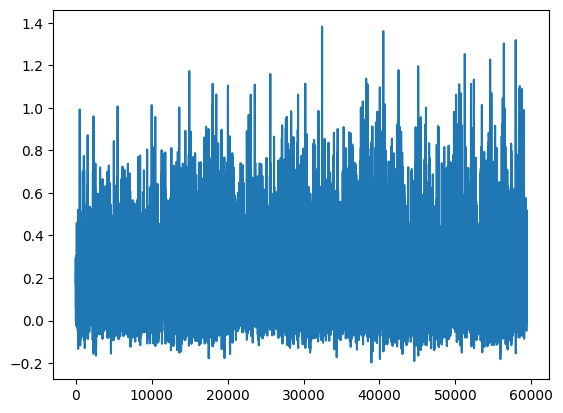

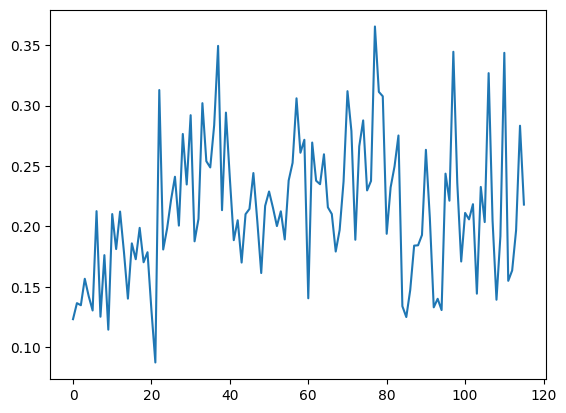

[PPO] Epoch 0: Loss=67.7195, Policy=0.0053, Value=135.5191
[PPO] Epoch 10: Loss=39.4844, Policy=-0.0126, Value=79.0824
[PPO] Epoch 20: Loss=31.2204, Policy=-0.0336, Value=62.5965
[PPO] Epoch 30: Loss=27.6595, Policy=-0.0071, Value=55.4140
Approx KL Learned: 0.11593875288963318
[✅] Actor-Critic checkpoint saved to chkpoint_29.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 30/100 — steps: 2048


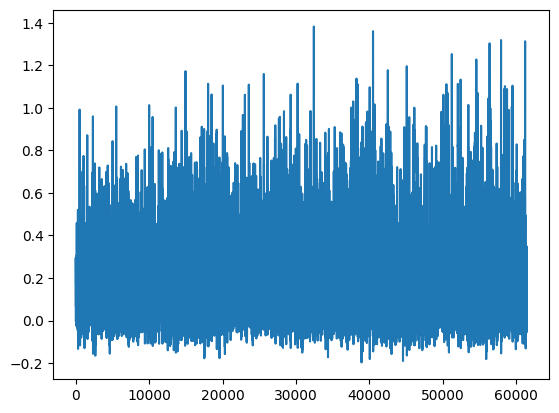

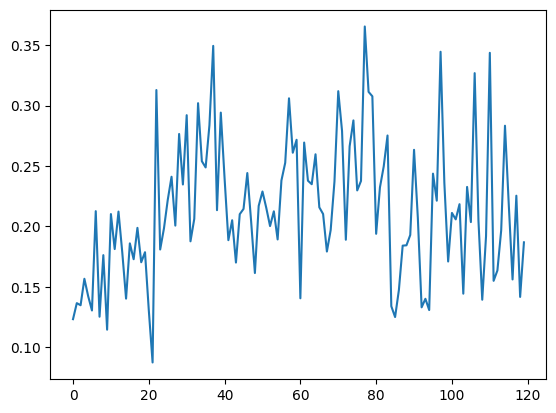

[PPO] Epoch 0: Loss=97.2622, Policy=0.0089, Value=194.5882
[PPO] Epoch 10: Loss=58.1966, Policy=-0.0054, Value=116.4877
[PPO] Epoch 20: Loss=34.9493, Policy=-0.0277, Value=70.0394
[PPO] Epoch 30: Loss=19.5915, Policy=-0.0391, Value=39.3473
Approx KL Learned: 0.04105018824338913
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 31/100 — steps: 2048


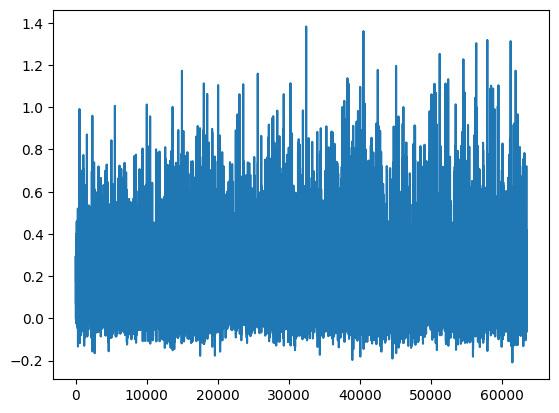

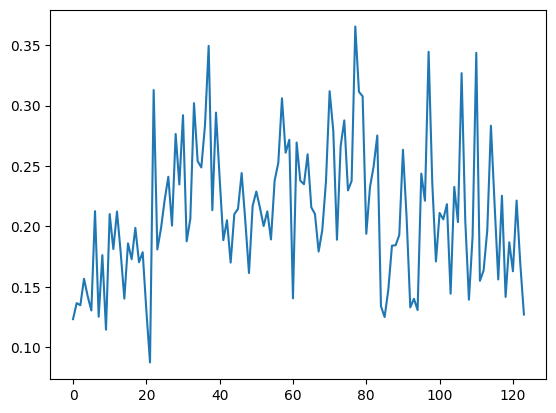

[PPO] Epoch 0: Loss=112.4112, Policy=0.0071, Value=224.9023
[PPO] Epoch 10: Loss=68.3676, Policy=-0.0042, Value=136.8378
[PPO] Epoch 20: Loss=41.6713, Policy=-0.0156, Value=83.4682
[PPO] Epoch 30: Loss=29.6050, Policy=-0.0270, Value=59.3574
Approx KL Learned: 0.029104061424732208
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 32/100 — steps: 2048


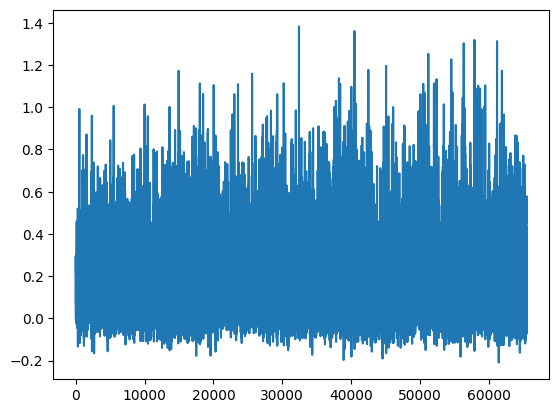

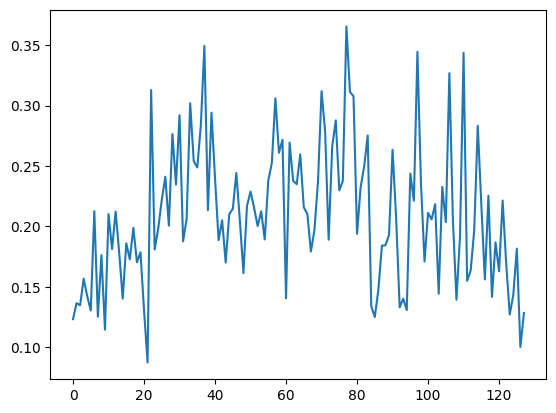

[PPO] Epoch 0: Loss=81.3423, Policy=0.0080, Value=162.7551
[PPO] Epoch 10: Loss=40.1380, Policy=-0.0031, Value=80.3716
[PPO] Epoch 20: Loss=23.3293, Policy=-0.0203, Value=46.7870
[PPO] Epoch 30: Loss=15.3651, Policy=-0.0315, Value=30.8788
Approx KL Learned: 0.035412829369306564
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 33/100 — steps: 2048


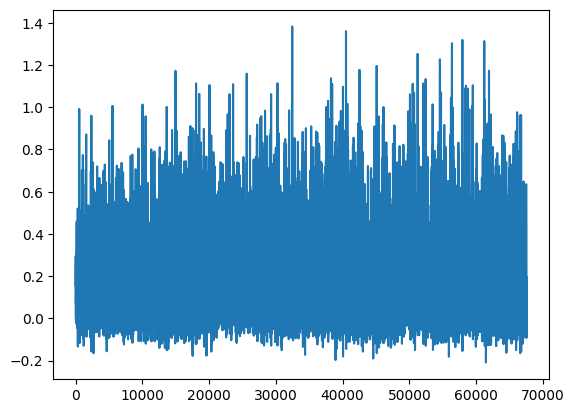

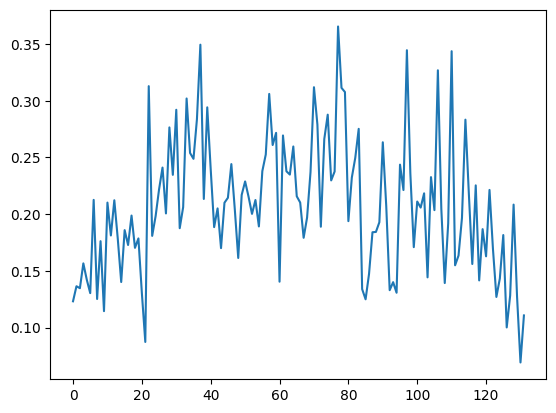

[PPO] Epoch 0: Loss=83.1113, Policy=0.0063, Value=166.2856
[PPO] Epoch 10: Loss=50.2733, Policy=-0.0032, Value=100.6290
[PPO] Epoch 20: Loss=34.8232, Policy=-0.0162, Value=69.7566
[PPO] Epoch 30: Loss=24.5292, Policy=-0.0259, Value=49.1894
Approx KL Learned: 0.033596254885196686
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 34/100 — steps: 2048


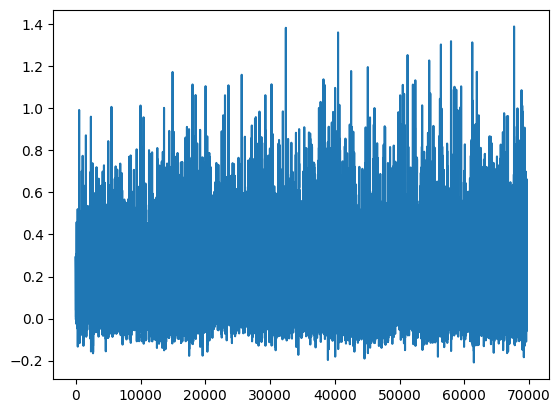

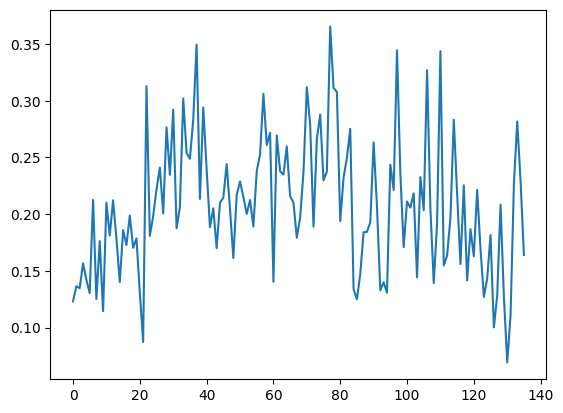

[PPO] Epoch 0: Loss=95.4396, Policy=0.0011, Value=190.9593
[PPO] Epoch 10: Loss=48.6216, Policy=-0.0115, Value=97.3526
[PPO] Epoch 20: Loss=25.4321, Policy=-0.0332, Value=51.0145
[PPO] Epoch 30: Loss=15.7421, Policy=-0.0474, Value=31.6633
Approx KL Learned: 0.04280916601419449
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 35/100 — steps: 2048


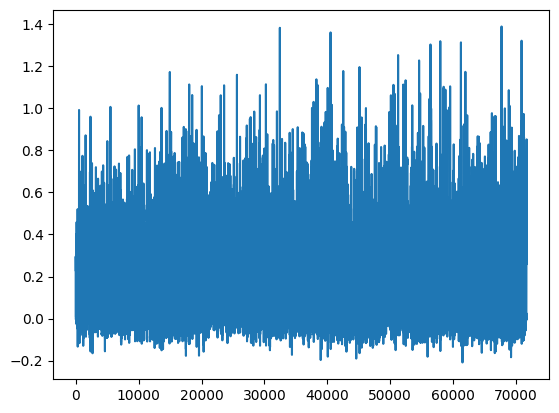

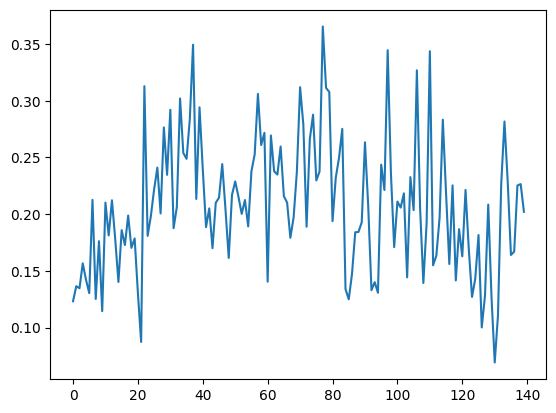

[PPO] Epoch 0: Loss=72.5212, Policy=0.0109, Value=145.1109
[PPO] Epoch 10: Loss=44.1857, Policy=-0.0088, Value=88.4798
[PPO] Epoch 20: Loss=28.1898, Policy=-0.0262, Value=56.5220
[PPO] Epoch 30: Loss=19.6380, Policy=-0.0389, Value=39.4432
Approx KL Learned: 0.03776705637574196
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 36/100 — steps: 2048


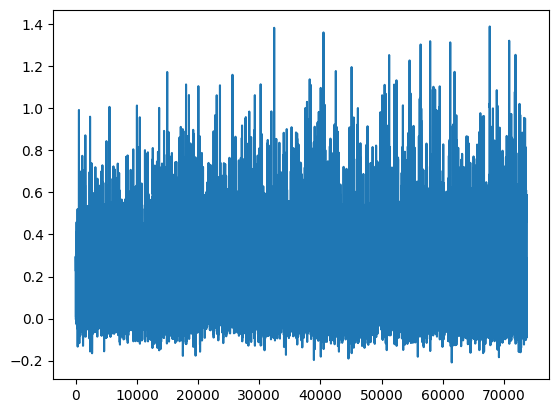

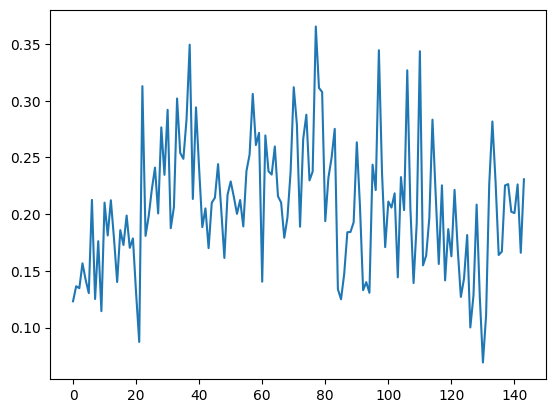

[PPO] Epoch 0: Loss=77.2755, Policy=0.0137, Value=154.6094
[PPO] Epoch 10: Loss=44.4010, Policy=-0.0065, Value=88.9003
[PPO] Epoch 20: Loss=26.2015, Policy=-0.0169, Value=52.5221
[PPO] Epoch 30: Loss=16.6455, Policy=-0.0289, Value=33.4358
Approx KL Learned: 0.03865555301308632
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 37/100 — steps: 2048


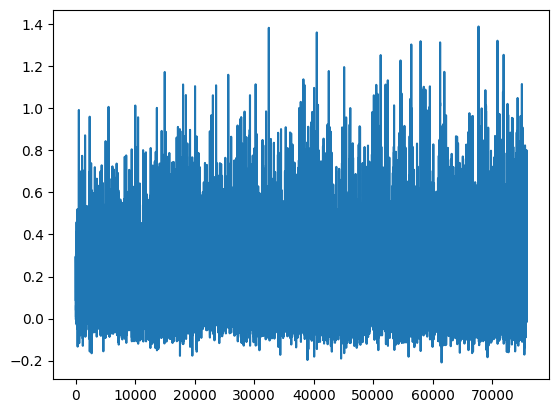

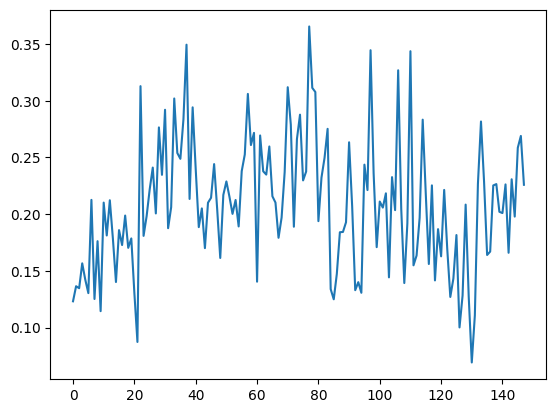

[PPO] Epoch 0: Loss=85.9455, Policy=0.0095, Value=171.9642
[PPO] Epoch 10: Loss=49.0707, Policy=-0.0092, Value=98.2505
[PPO] Epoch 20: Loss=32.3780, Policy=-0.0255, Value=64.8977
[PPO] Epoch 30: Loss=24.6848, Policy=-0.0294, Value=49.5158
Approx KL Learned: 0.04924055188894272
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 38/100 — steps: 2048


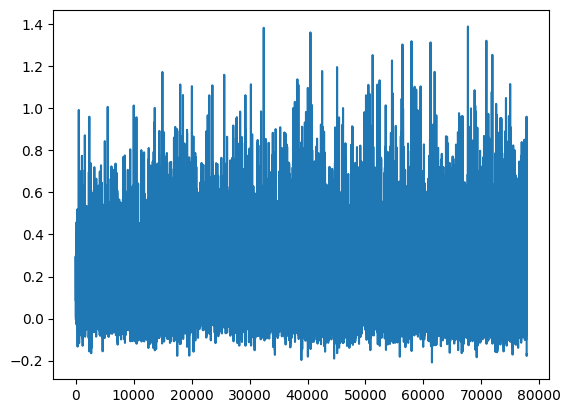

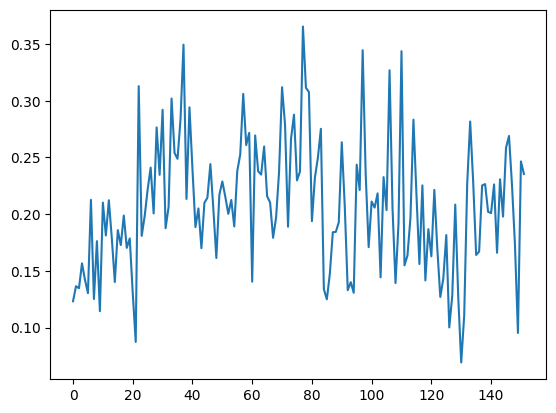

[PPO] Epoch 0: Loss=85.7500, Policy=0.0049, Value=171.5745
[PPO] Epoch 10: Loss=46.6061, Policy=-0.0037, Value=93.3044
[PPO] Epoch 20: Loss=27.2422, Policy=-0.0227, Value=54.6158
[PPO] Epoch 30: Loss=19.3920, Policy=-0.0312, Value=38.9269
Approx KL Learned: 0.11320602893829346
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 39/100 — steps: 2048


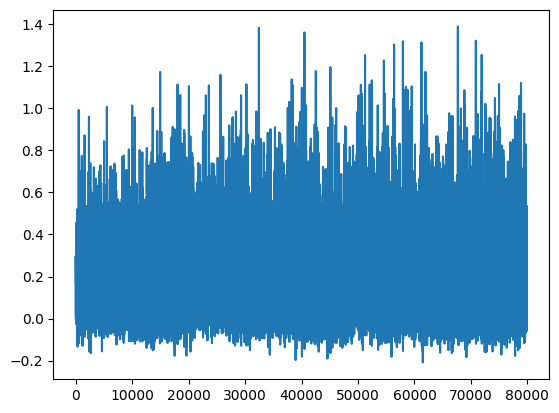

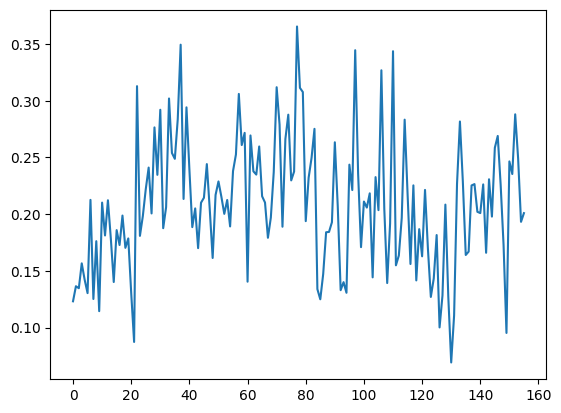

[PPO] Epoch 0: Loss=76.0849, Policy=0.0062, Value=152.2505
[PPO] Epoch 10: Loss=45.2025, Policy=0.0047, Value=90.4911
[PPO] Epoch 20: Loss=29.3027, Policy=-0.0259, Value=58.7496
[PPO] Epoch 30: Loss=20.7951, Policy=-0.0461, Value=41.7730
Approx KL Learned: 0.03812854737043381
[✅] Actor-Critic checkpoint saved to chkpoint_39.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 40/100 — steps: 2048


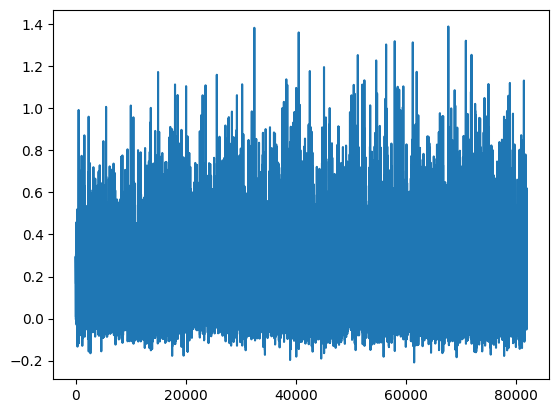

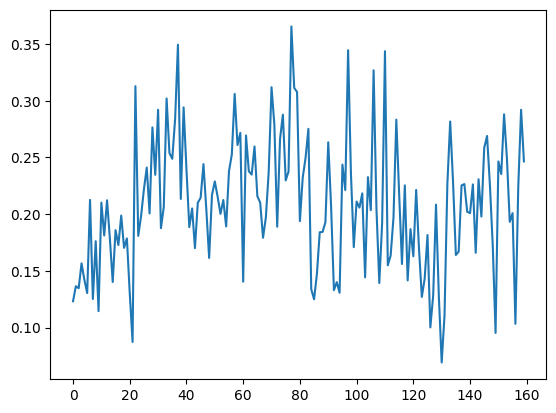

[PPO] Epoch 0: Loss=97.2888, Policy=0.0099, Value=194.6482
[PPO] Epoch 10: Loss=60.8860, Policy=-0.0057, Value=121.8740
[PPO] Epoch 20: Loss=34.5091, Policy=-0.0212, Value=69.1516
[PPO] Epoch 30: Loss=25.6023, Policy=-0.0344, Value=51.3641
Approx KL Learned: 0.04179736226797104
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 41/100 — steps: 2048


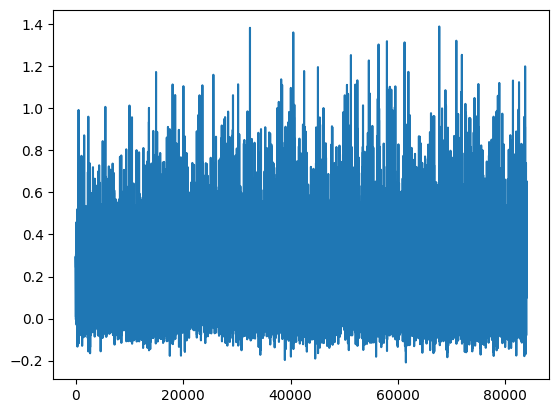

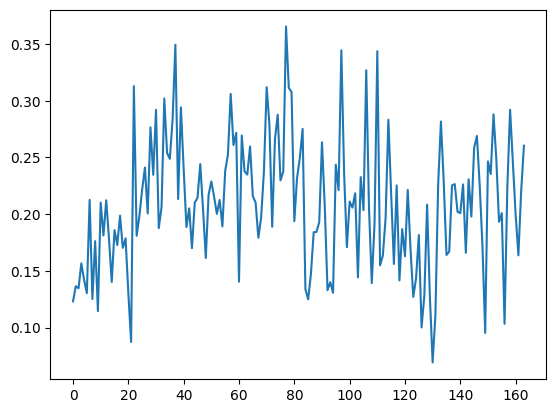

[PPO] Epoch 0: Loss=96.3267, Policy=0.0091, Value=192.7299
[PPO] Epoch 10: Loss=58.4022, Policy=-0.0001, Value=116.8997
[PPO] Epoch 20: Loss=38.9493, Policy=-0.0279, Value=78.0499
[PPO] Epoch 30: Loss=28.9384, Policy=-0.0452, Value=58.0621
Approx KL Learned: 0.09788857400417328
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 42/100 — steps: 2048


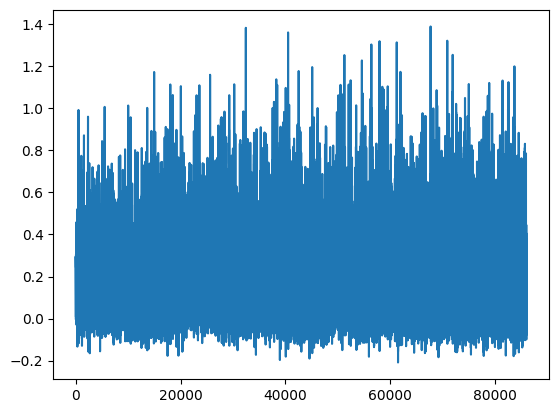

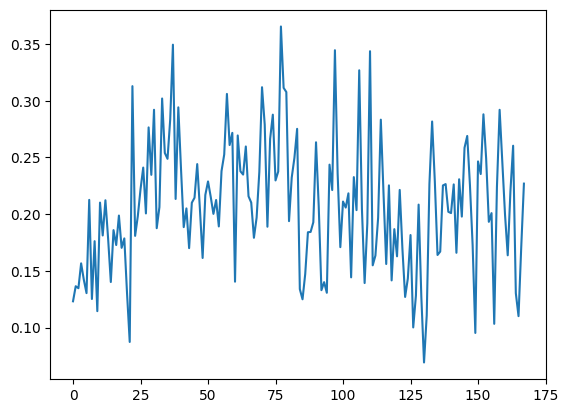

[PPO] Epoch 0: Loss=86.2810, Policy=0.0064, Value=172.6320
[PPO] Epoch 10: Loss=40.7851, Policy=0.0060, Value=81.6432
[PPO] Epoch 20: Loss=21.8389, Policy=-0.0188, Value=43.7997
[PPO] Epoch 30: Loss=12.4357, Policy=-0.0444, Value=25.0441
Approx KL Learned: 0.05218095704913139
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 43/100 — steps: 2048


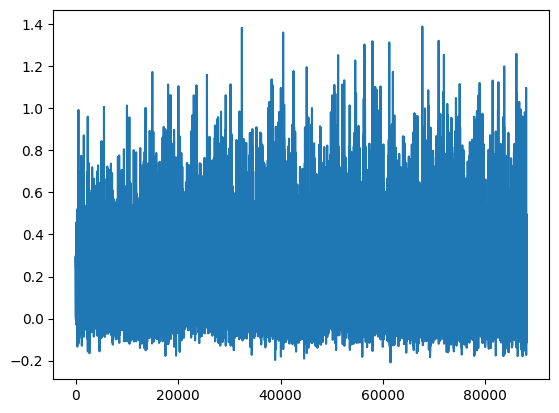

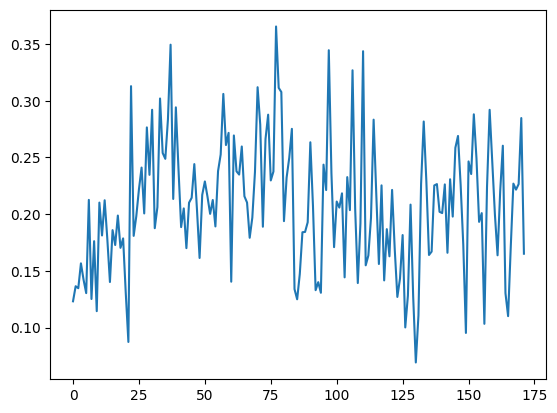

[PPO] Epoch 0: Loss=100.1461, Policy=0.0069, Value=200.3628
[PPO] Epoch 10: Loss=56.6544, Policy=-0.0041, Value=113.4030
[PPO] Epoch 20: Loss=31.2303, Policy=-0.0155, Value=62.5766
[PPO] Epoch 30: Loss=20.4357, Policy=-0.0313, Value=41.0209
Approx KL Learned: 0.051357802003622055
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 44/100 — steps: 2048


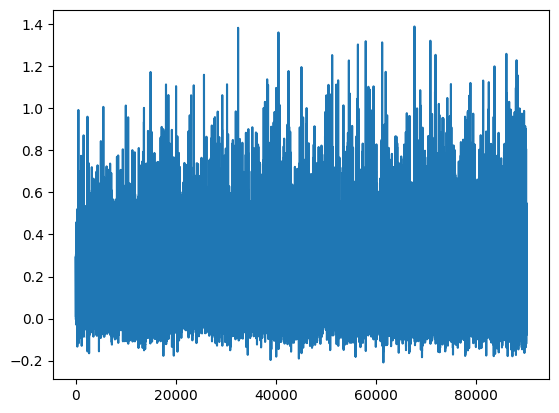

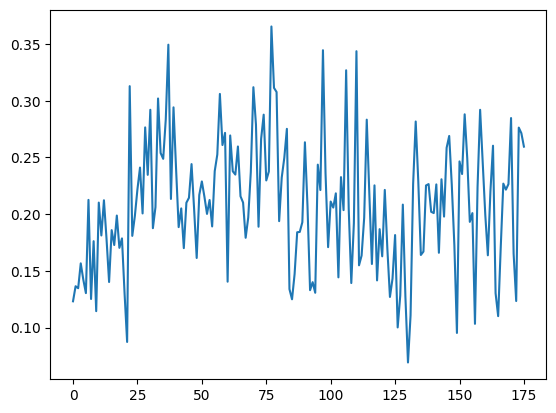

[PPO] Epoch 0: Loss=87.4111, Policy=0.0094, Value=174.8895
[PPO] Epoch 10: Loss=59.2743, Policy=-0.0044, Value=118.6444
[PPO] Epoch 20: Loss=30.2650, Policy=-0.0250, Value=60.6677
[PPO] Epoch 30: Loss=16.7024, Policy=-0.0408, Value=33.5750
Approx KL Learned: 0.05704125389456749
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 45/100 — steps: 2048


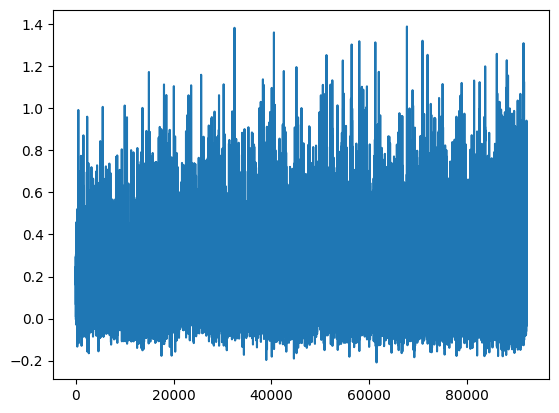

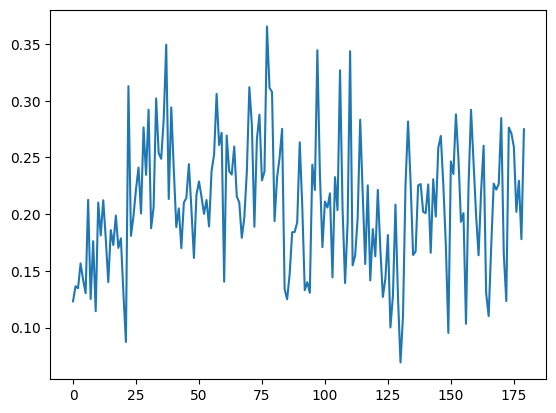

[PPO] Epoch 0: Loss=80.3905, Policy=0.0088, Value=160.8572
[PPO] Epoch 10: Loss=39.4435, Policy=-0.0058, Value=78.9899
[PPO] Epoch 20: Loss=22.5535, Policy=-0.0234, Value=45.2446
[PPO] Epoch 30: Loss=17.3397, Policy=-0.0374, Value=34.8470
Approx KL Learned: 0.03592909872531891
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 46/100 — steps: 2048


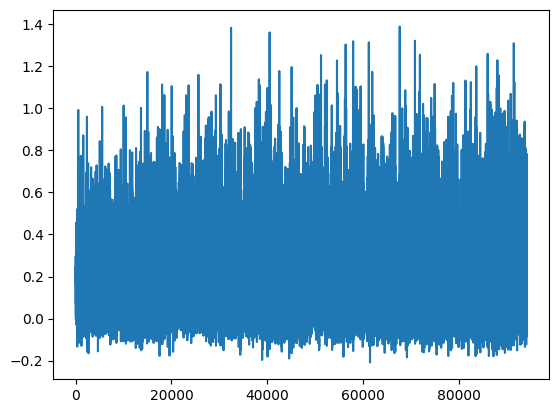

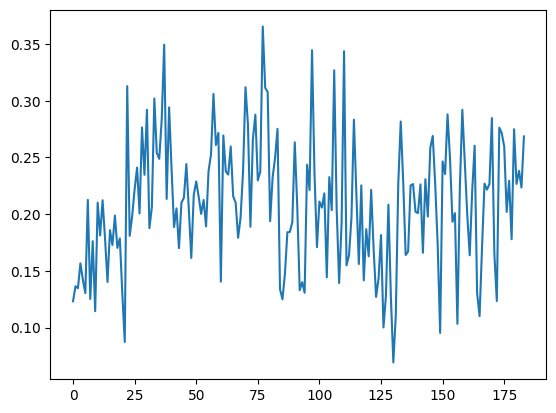

[PPO] Epoch 0: Loss=77.5752, Policy=0.0084, Value=155.2352
[PPO] Epoch 10: Loss=39.7067, Policy=-0.0032, Value=79.5211
[PPO] Epoch 20: Loss=24.5888, Policy=-0.0238, Value=49.3260
[PPO] Epoch 30: Loss=11.9499, Policy=-0.0466, Value=24.0930
Approx KL Learned: 0.13653859496116638
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 47/100 — steps: 2048


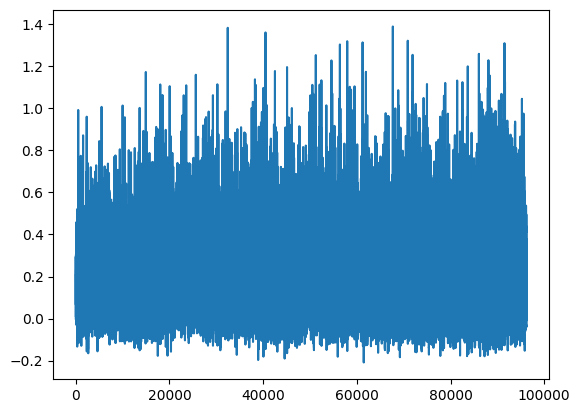

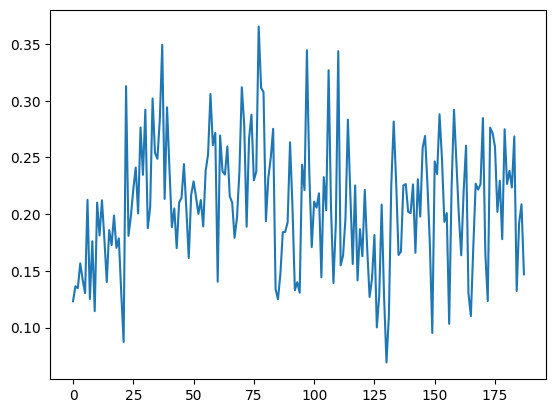

[PPO] Epoch 0: Loss=102.7402, Policy=0.0155, Value=205.5452
[PPO] Epoch 10: Loss=51.1790, Policy=0.0139, Value=102.4271
[PPO] Epoch 20: Loss=30.5396, Policy=-0.0122, Value=61.1991
[PPO] Epoch 30: Loss=20.2899, Policy=-0.0285, Value=40.7315
Approx KL Learned: 0.03433575481176376
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 48/100 — steps: 2048


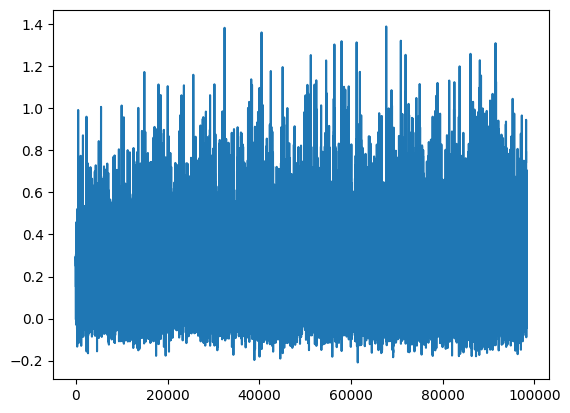

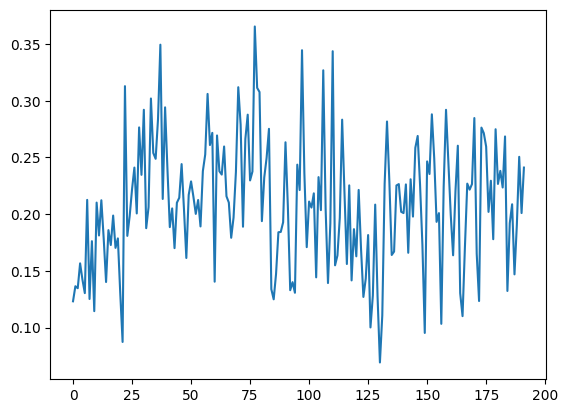

[PPO] Epoch 0: Loss=90.5603, Policy=0.0066, Value=181.2071
[PPO] Epoch 10: Loss=44.4833, Policy=-0.0015, Value=89.0681
[PPO] Epoch 20: Loss=28.8711, Policy=-0.0316, Value=57.9043
[PPO] Epoch 30: Loss=19.3053, Policy=-0.0472, Value=38.8036
Approx KL Learned: 0.052501045167446136
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 49/100 — steps: 2048


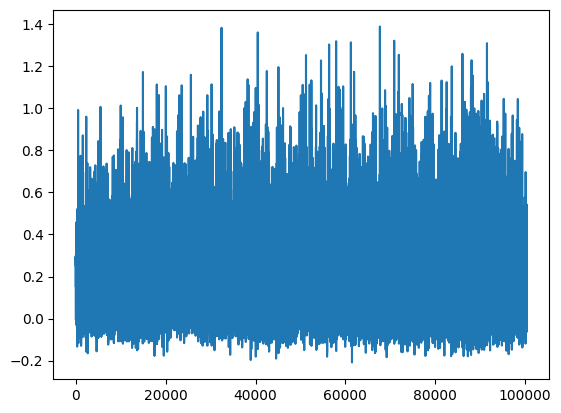

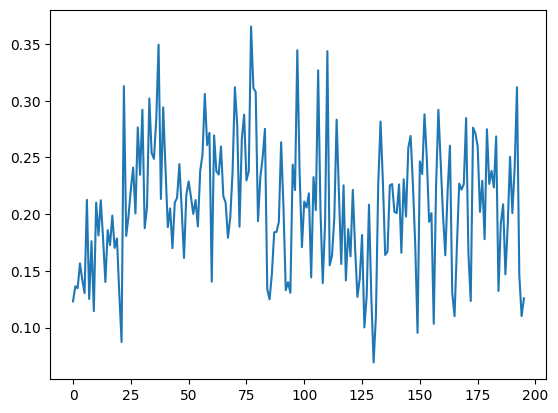

[PPO] Epoch 0: Loss=94.6477, Policy=0.0120, Value=189.3641
[PPO] Epoch 10: Loss=58.3905, Policy=0.0118, Value=116.8507
[PPO] Epoch 20: Loss=35.7294, Policy=-0.0105, Value=71.5717
[PPO] Epoch 30: Loss=24.4253, Policy=-0.0317, Value=49.0056
Approx KL Learned: 0.022272169589996338
[✅] Actor-Critic checkpoint saved to chkpoint_49.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 50/100 — steps: 2048


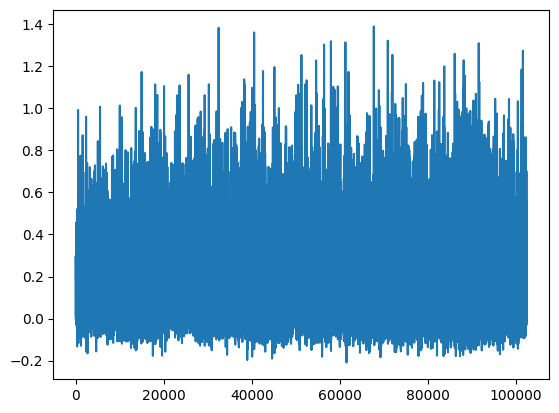

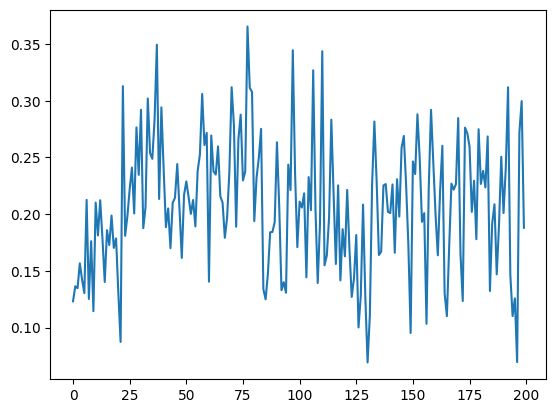

[PPO] Epoch 0: Loss=92.2037, Policy=0.0115, Value=184.4692
[PPO] Epoch 10: Loss=58.0941, Policy=-0.0004, Value=116.2712
[PPO] Epoch 20: Loss=33.2815, Policy=-0.0232, Value=66.6931
[PPO] Epoch 30: Loss=19.4228, Policy=-0.0454, Value=39.0206
Approx KL Learned: 0.14687855541706085
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 51/100 — steps: 2048


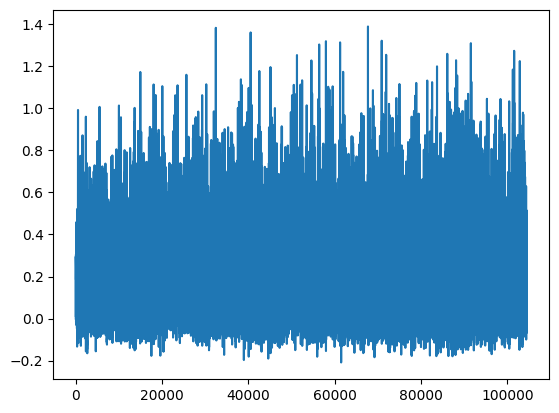

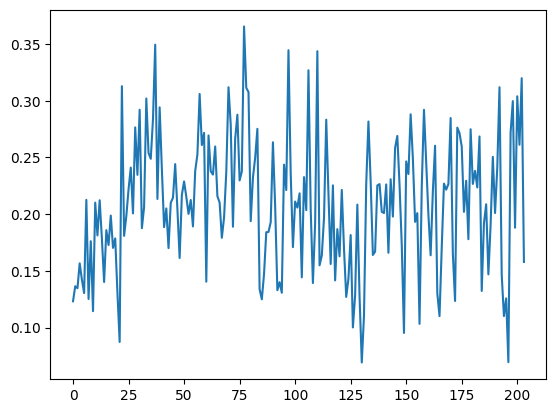

[PPO] Epoch 0: Loss=77.6365, Policy=0.0089, Value=155.3425
[PPO] Epoch 10: Loss=30.6341, Policy=-0.0103, Value=61.3782
[PPO] Epoch 20: Loss=18.4610, Policy=-0.0305, Value=37.0706
[PPO] Epoch 30: Loss=13.8352, Policy=-0.0428, Value=27.8434
Approx KL Learned: 0.04114969074726105
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 52/100 — steps: 2048


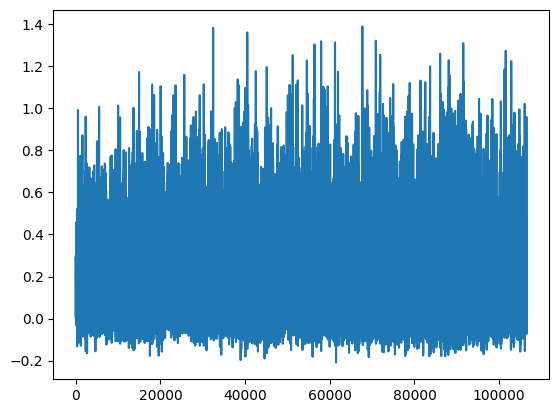

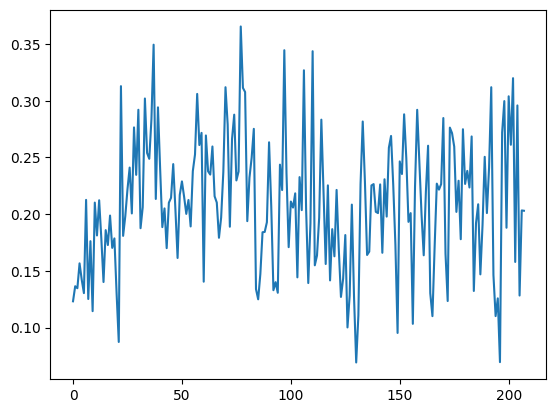

[PPO] Epoch 0: Loss=90.2194, Policy=0.0044, Value=180.5201
[PPO] Epoch 10: Loss=41.6584, Policy=-0.0107, Value=83.4293
[PPO] Epoch 20: Loss=22.7180, Policy=-0.0341, Value=45.5952
[PPO] Epoch 30: Loss=14.3998, Policy=-0.0449, Value=28.9800
Approx KL Learned: 0.04365590214729309
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 53/100 — steps: 2048


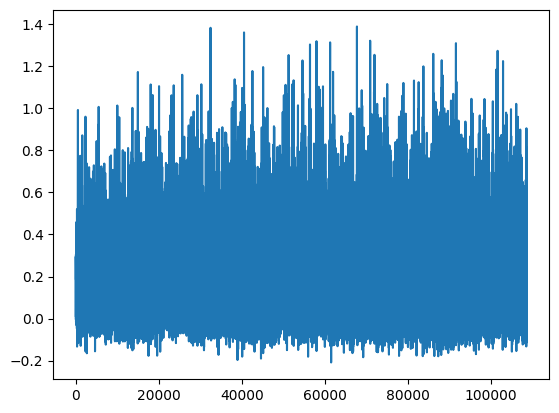

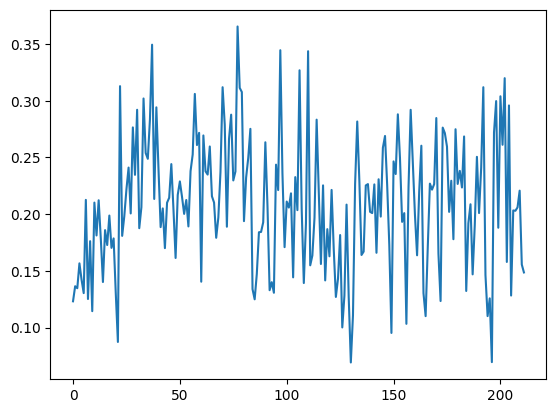

[PPO] Epoch 0: Loss=88.1848, Policy=0.0070, Value=176.4403
[PPO] Epoch 10: Loss=58.3990, Policy=-0.0059, Value=116.8947
[PPO] Epoch 20: Loss=33.1430, Policy=-0.0083, Value=66.3879
[PPO] Epoch 30: Loss=22.3193, Policy=-0.0174, Value=44.7575
Approx KL Learned: 0.06431570649147034
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 54/100 — steps: 2048


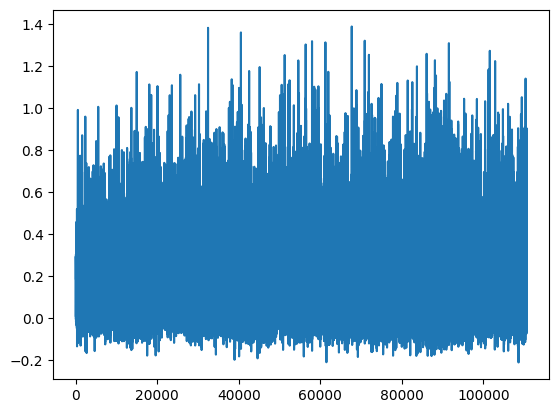

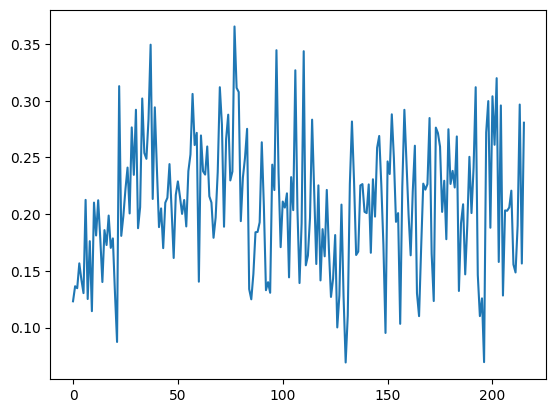

[PPO] Epoch 0: Loss=108.2396, Policy=0.0087, Value=216.5433
[PPO] Epoch 10: Loss=65.3216, Policy=0.1078, Value=130.4981
[PPO] Epoch 20: Loss=35.6628, Policy=0.0517, Value=71.3156
[PPO] Epoch 30: Loss=19.5264, Policy=0.0111, Value=39.1212
Approx KL Learned: 0.05084599554538727
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 55/100 — steps: 2048


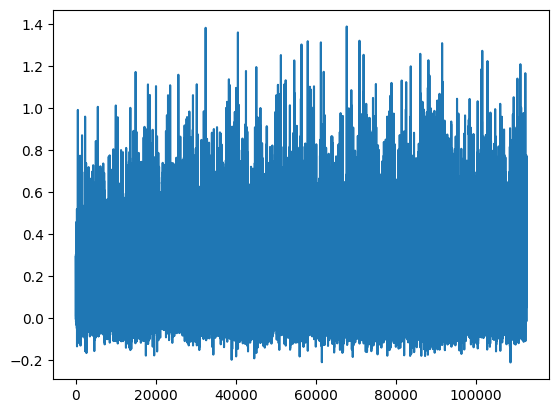

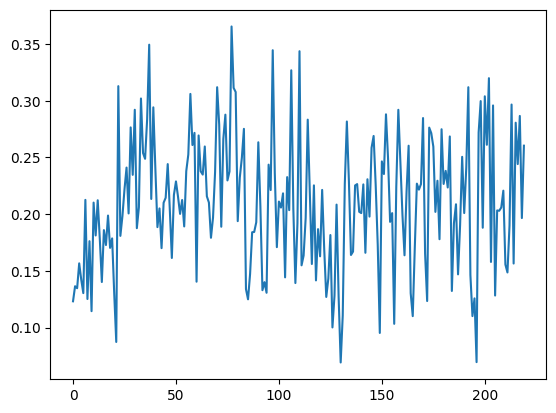

[PPO] Epoch 0: Loss=127.1214, Policy=0.0070, Value=254.3107
[PPO] Epoch 10: Loss=67.3990, Policy=-0.0009, Value=134.8805
[PPO] Epoch 20: Loss=32.6349, Policy=-0.0195, Value=65.3927
[PPO] Epoch 30: Loss=19.5952, Policy=-0.0424, Value=39.3566
Approx KL Learned: 0.039727527648210526
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 56/100 — steps: 2048


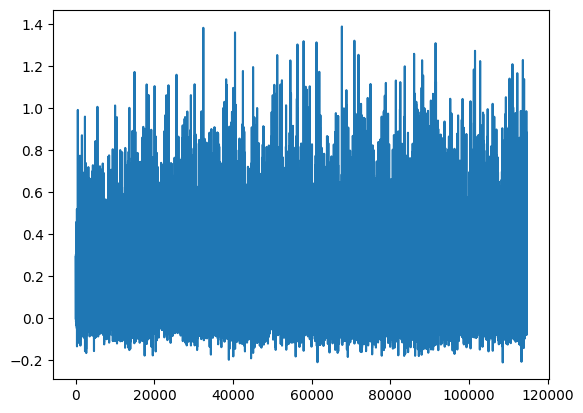

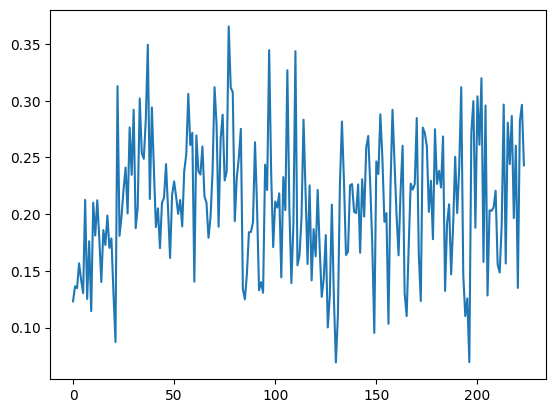

[PPO] Epoch 0: Loss=73.4233, Policy=0.0051, Value=146.9274
[PPO] Epoch 10: Loss=33.5773, Policy=-0.0203, Value=67.2857
[PPO] Epoch 20: Loss=14.0637, Policy=-0.0411, Value=28.2988
[PPO] Epoch 30: Loss=9.0237, Policy=-0.0607, Value=18.2576
Approx KL Learned: 0.05253639072179794
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 57/100 — steps: 2048


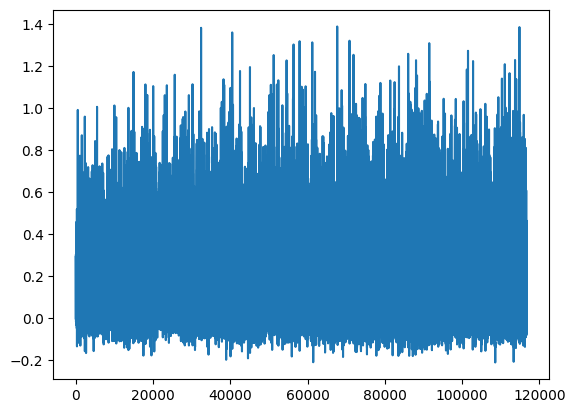

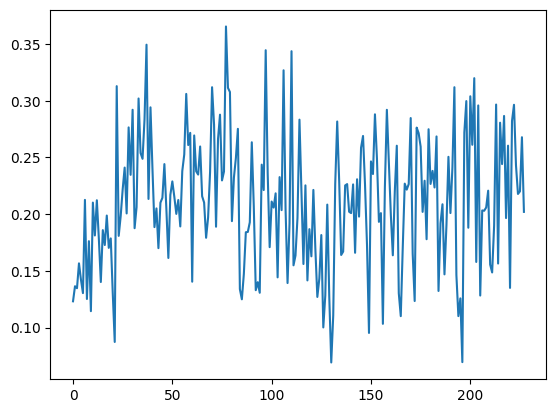

[PPO] Epoch 0: Loss=67.6576, Policy=0.0028, Value=135.3970
[PPO] Epoch 10: Loss=33.5585, Policy=-0.0185, Value=67.2414
[PPO] Epoch 20: Loss=15.9656, Policy=-0.0441, Value=32.1062
[PPO] Epoch 30: Loss=9.6955, Policy=-0.0623, Value=19.6016
Approx KL Learned: 0.0426727719604969
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 58/100 — steps: 2048


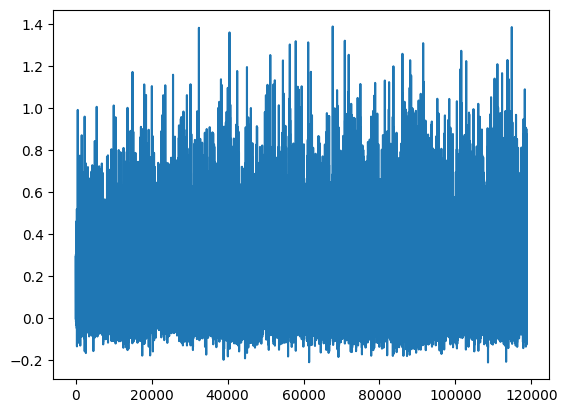

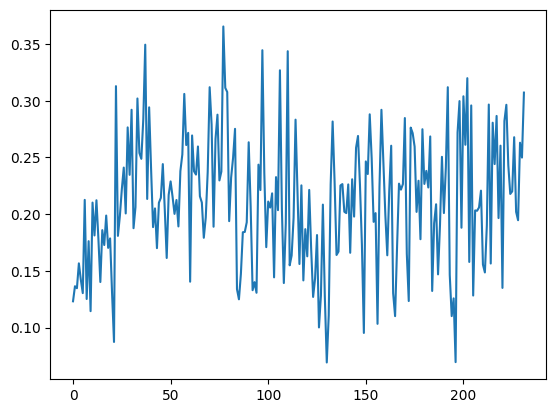

[PPO] Epoch 0: Loss=96.4114, Policy=0.0103, Value=192.8859
[PPO] Epoch 10: Loss=45.5222, Policy=-0.0040, Value=91.1354
[PPO] Epoch 20: Loss=22.7555, Policy=-0.0289, Value=45.6520
[PPO] Epoch 30: Loss=12.8575, Policy=-0.0486, Value=25.8957
Approx KL Learned: 0.073948435485363
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 59/100 — steps: 2048


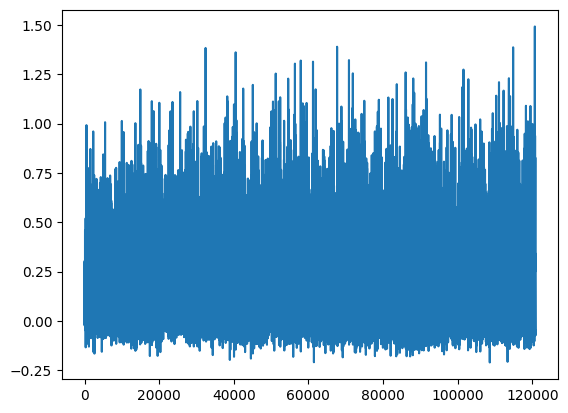

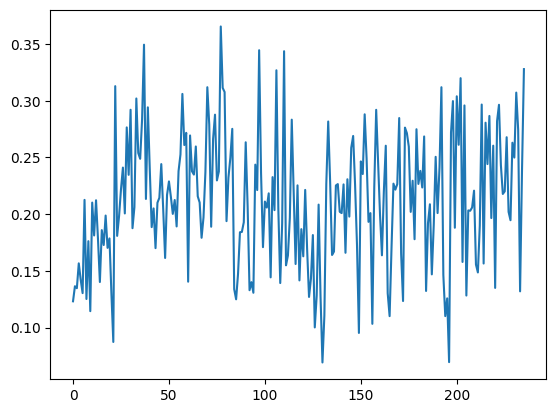

[PPO] Epoch 0: Loss=102.6502, Policy=0.0156, Value=205.3423
[PPO] Epoch 10: Loss=69.8958, Policy=0.0070, Value=139.8515
[PPO] Epoch 20: Loss=35.6721, Policy=-0.0234, Value=71.4637
[PPO] Epoch 30: Loss=21.4132, Policy=-0.0343, Value=42.9713
Approx KL Learned: 0.05125381052494049
[✅] Actor-Critic checkpoint saved to chkpoint_59.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 60/100 — steps: 2048


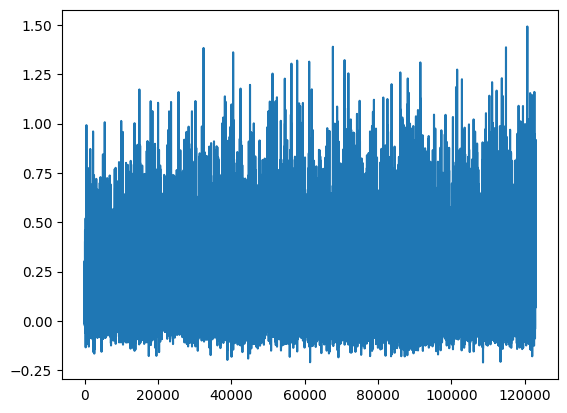

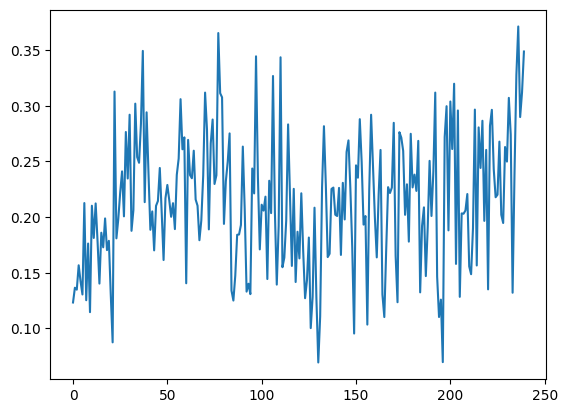

[PPO] Epoch 0: Loss=105.8120, Policy=0.0063, Value=211.6904
[PPO] Epoch 10: Loss=60.2702, Policy=-0.0087, Value=120.6397
[PPO] Epoch 20: Loss=31.1216, Policy=-0.0377, Value=62.3979
[PPO] Epoch 30: Loss=16.7907, Policy=-0.0574, Value=33.7767
Approx KL Learned: 0.054445698857307434
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 61/100 — steps: 2048


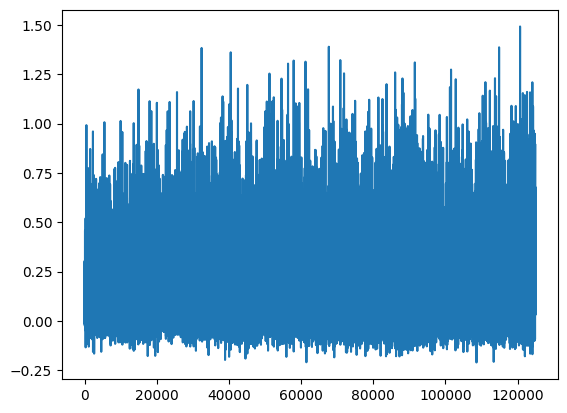

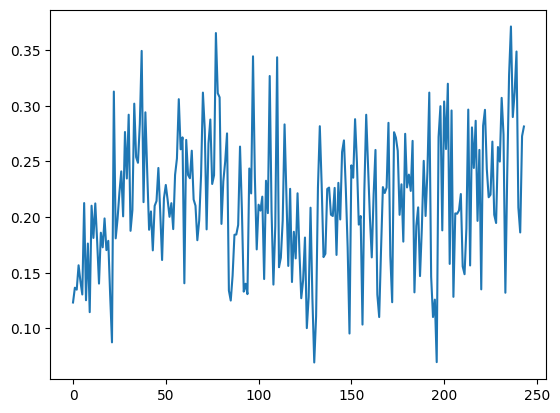

[PPO] Epoch 0: Loss=112.0731, Policy=0.0148, Value=224.1868
[PPO] Epoch 10: Loss=65.5872, Policy=-0.0057, Value=131.2582
[PPO] Epoch 20: Loss=35.2210, Policy=-0.0143, Value=70.5508
[PPO] Epoch 30: Loss=18.4937, Policy=-0.0355, Value=37.1332
Approx KL Learned: 0.06330171227455139
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 62/100 — steps: 2048


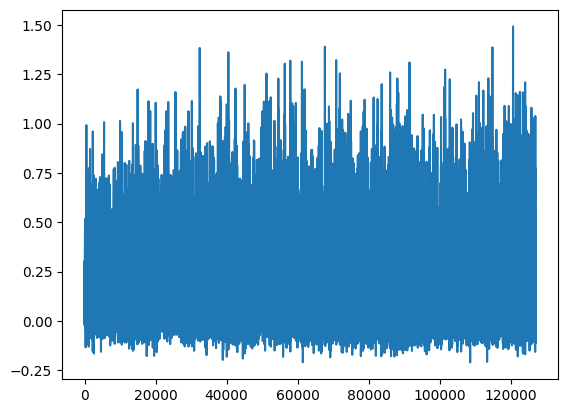

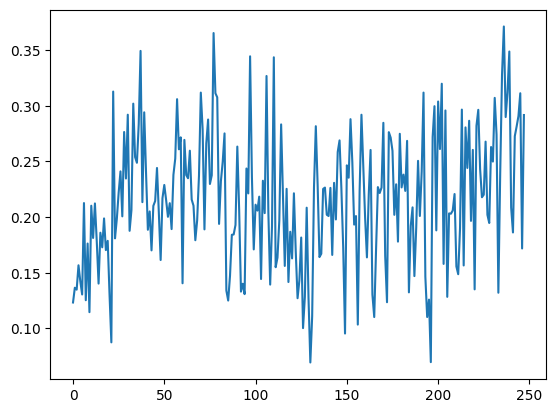

[PPO] Epoch 0: Loss=85.6396, Policy=0.0131, Value=171.3290
[PPO] Epoch 10: Loss=38.4193, Policy=-0.0129, Value=76.9418
[PPO] Epoch 20: Loss=18.9925, Policy=-0.0314, Value=38.1258
[PPO] Epoch 30: Loss=10.4376, Policy=-0.0469, Value=21.0414
Approx KL Learned: 0.0653953105211258
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 63/100 — steps: 2048


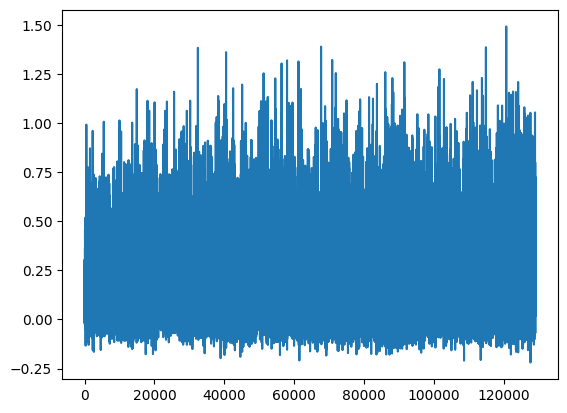

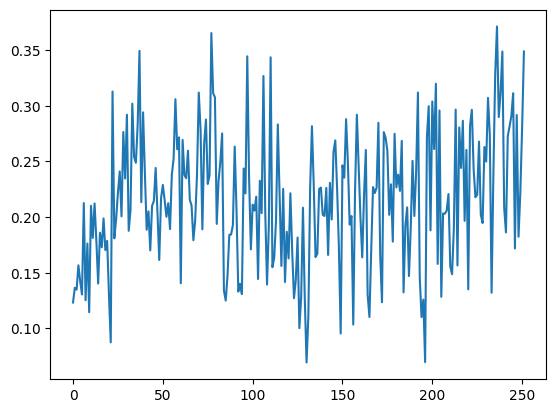

[PPO] Epoch 0: Loss=187.2753, Policy=0.0143, Value=374.5884
[PPO] Epoch 10: Loss=67.4530, Policy=0.0020, Value=134.9793
[PPO] Epoch 20: Loss=32.3749, Policy=-0.0377, Value=64.9011
[PPO] Epoch 30: Loss=18.7757, Policy=-0.0547, Value=37.7354
Approx KL Learned: 0.10578536987304688
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 64/100 — steps: 2048


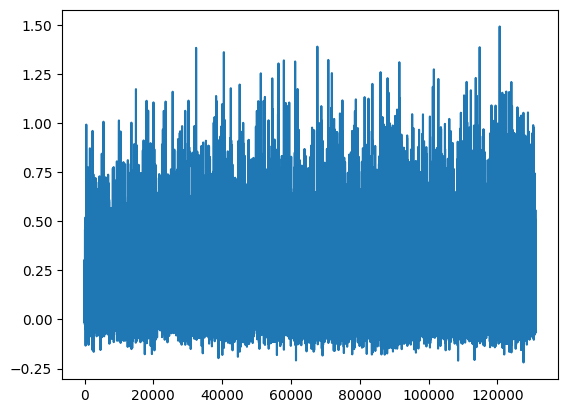

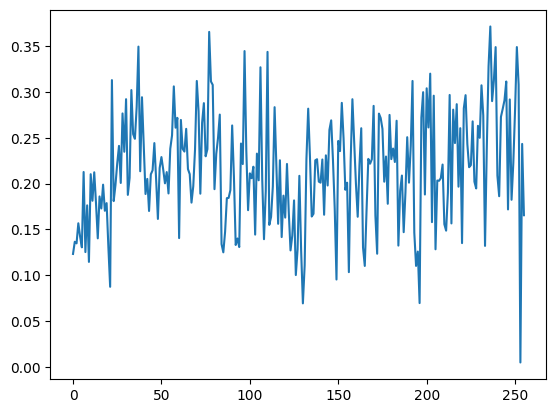

[PPO] Epoch 0: Loss=137.4933, Policy=0.0205, Value=275.0091
[PPO] Epoch 10: Loss=93.7043, Policy=0.0196, Value=187.4371
[PPO] Epoch 20: Loss=54.4528, Policy=-0.0083, Value=108.9905
[PPO] Epoch 30: Loss=32.8460, Policy=-0.0201, Value=65.8021
Approx KL Learned: 0.05532887578010559
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 65/100 — steps: 2048


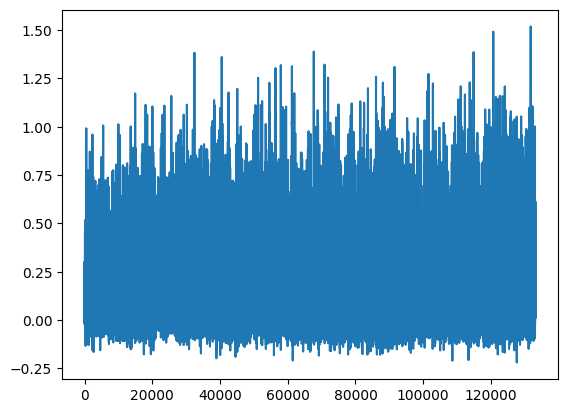

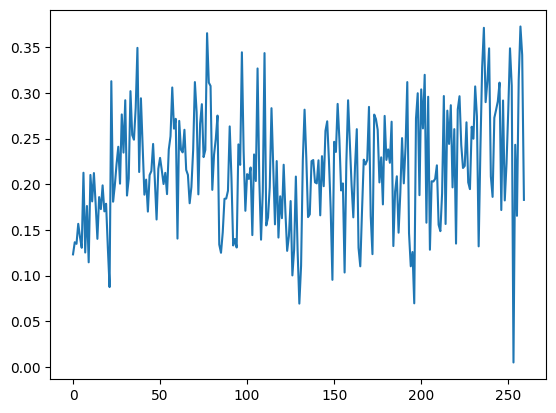

[PPO] Epoch 0: Loss=91.8924, Policy=0.0084, Value=183.8454
[PPO] Epoch 10: Loss=43.1561, Policy=-0.0144, Value=86.4199
[PPO] Epoch 20: Loss=28.5616, Policy=-0.0403, Value=57.2826
[PPO] Epoch 30: Loss=20.8656, Policy=-0.0579, Value=41.9256
Approx KL Learned: 0.08447186648845673
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 66/100 — steps: 2048


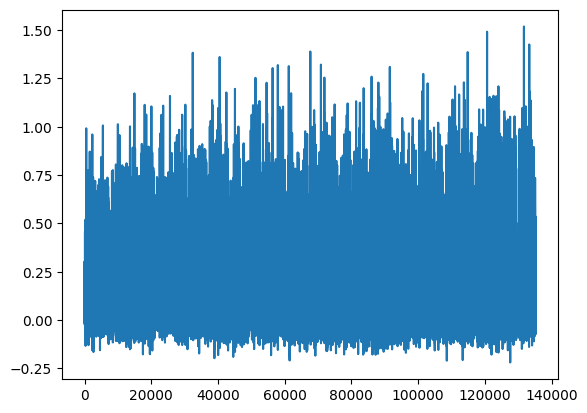

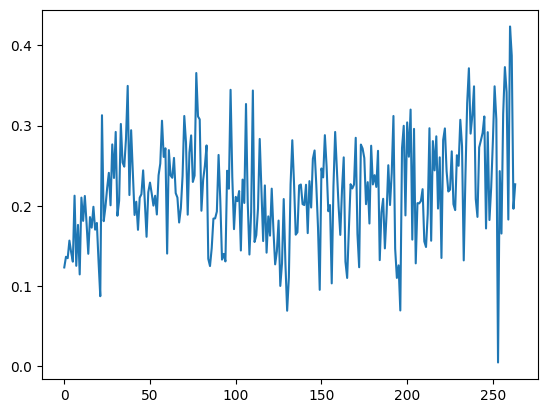

[PPO] Epoch 0: Loss=75.5927, Policy=0.0155, Value=151.2359
[PPO] Epoch 10: Loss=43.4859, Policy=-0.0151, Value=87.0836
[PPO] Epoch 20: Loss=21.4196, Policy=-0.0370, Value=42.9961
[PPO] Epoch 30: Loss=12.9290, Policy=-0.0299, Value=26.0047
Approx KL Learned: 0.27745312452316284
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 67/100 — steps: 2048


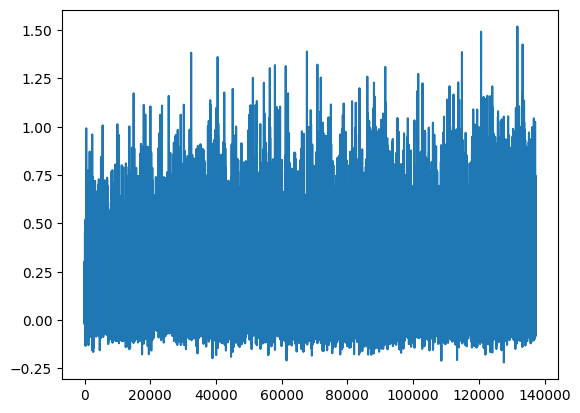

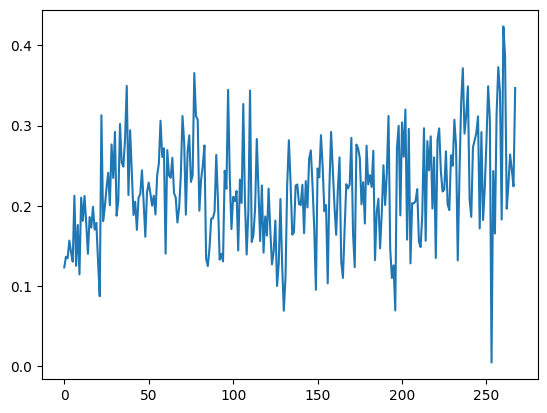

[PPO] Epoch 0: Loss=88.4335, Policy=0.0113, Value=176.8981
[PPO] Epoch 10: Loss=57.3791, Policy=0.0180, Value=114.7742
[PPO] Epoch 20: Loss=31.8434, Policy=-0.0052, Value=63.7524
[PPO] Epoch 30: Loss=17.5019, Policy=-0.0290, Value=35.1187
Approx KL Learned: 0.06456580758094788
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 68/100 — steps: 2048


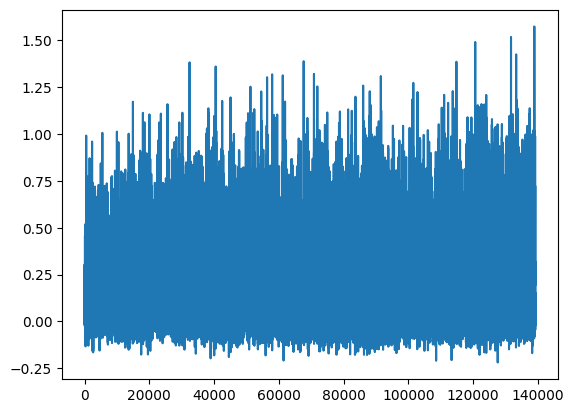

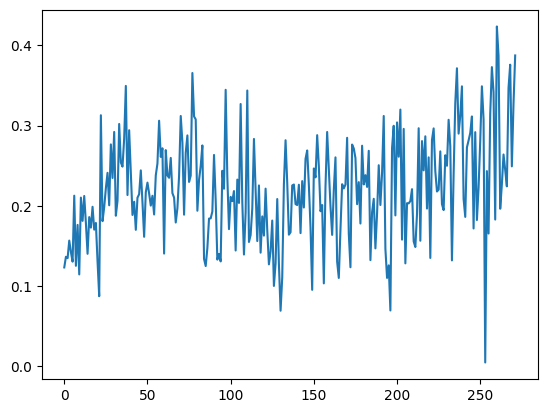

[PPO] Epoch 0: Loss=92.6296, Policy=0.0114, Value=185.2890
[PPO] Epoch 10: Loss=50.5598, Policy=0.0017, Value=101.1691
[PPO] Epoch 20: Loss=22.5621, Policy=-0.0211, Value=45.2210
[PPO] Epoch 30: Loss=13.2615, Policy=-0.0328, Value=26.6449
Approx KL Learned: 0.07942797988653183
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 69/100 — steps: 2048


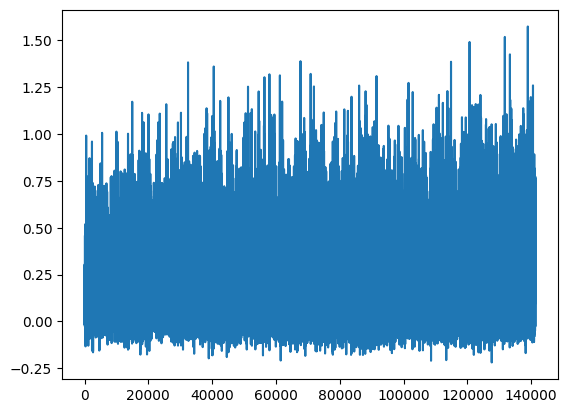

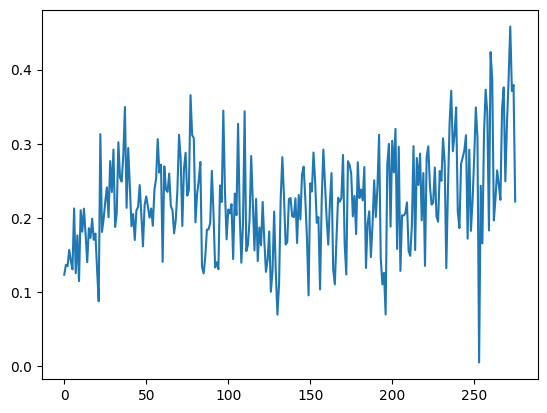

[PPO] Epoch 0: Loss=81.5336, Policy=0.0130, Value=163.0948
[PPO] Epoch 10: Loss=49.4307, Policy=0.0016, Value=98.9152
[PPO] Epoch 20: Loss=30.8560, Policy=-0.0061, Value=61.7868
[PPO] Epoch 30: Loss=16.4995, Policy=-0.0141, Value=33.0798
Approx KL Learned: 0.16563206911087036
[✅] Actor-Critic checkpoint saved to chkpoint_69.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 70/100 — steps: 2048


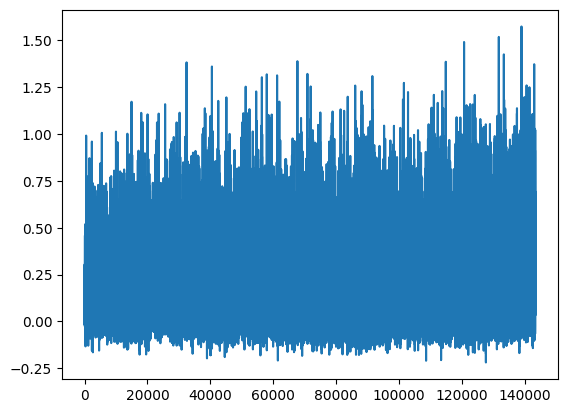

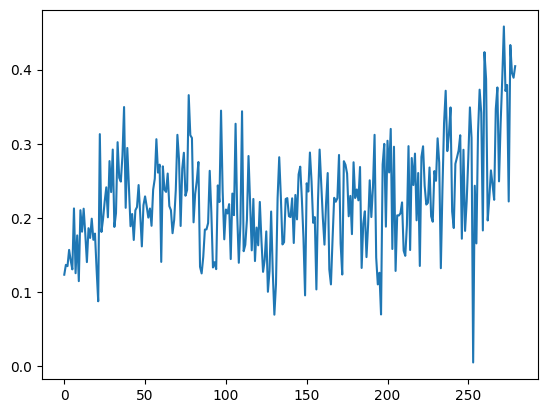

[PPO] Epoch 0: Loss=80.2297, Policy=0.0046, Value=160.5305
[PPO] Epoch 10: Loss=40.7450, Policy=-0.0068, Value=81.5864
[PPO] Epoch 20: Loss=23.9885, Policy=-0.0178, Value=48.0925
[PPO] Epoch 30: Loss=16.4408, Policy=-0.0278, Value=33.0171
Approx KL Learned: 0.029785558581352234
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 71/100 — steps: 2048


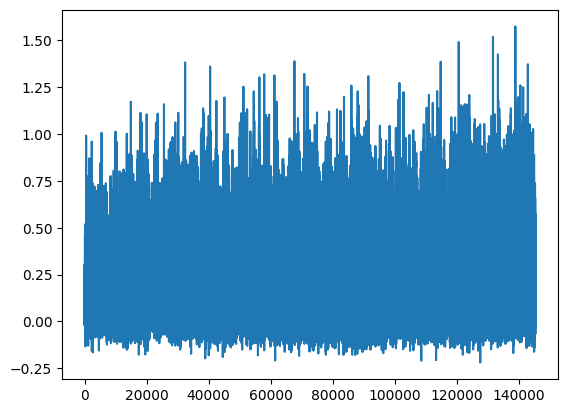

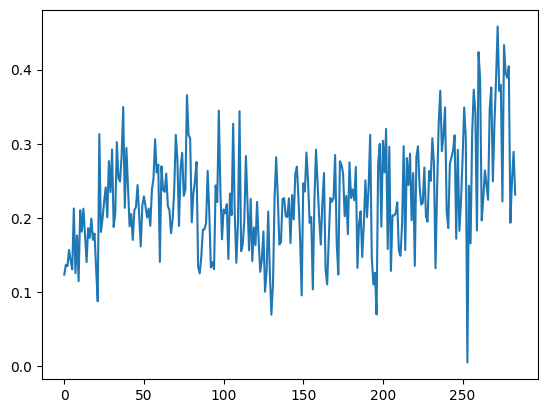

[PPO] Epoch 0: Loss=91.3241, Policy=0.0036, Value=182.7161
[PPO] Epoch 10: Loss=48.0152, Policy=-0.0055, Value=96.1150
[PPO] Epoch 20: Loss=30.0543, Policy=-0.0178, Value=60.2181
[PPO] Epoch 30: Loss=19.2656, Policy=-0.0335, Value=38.6717
Approx KL Learned: 0.03939181566238403
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 72/100 — steps: 2048


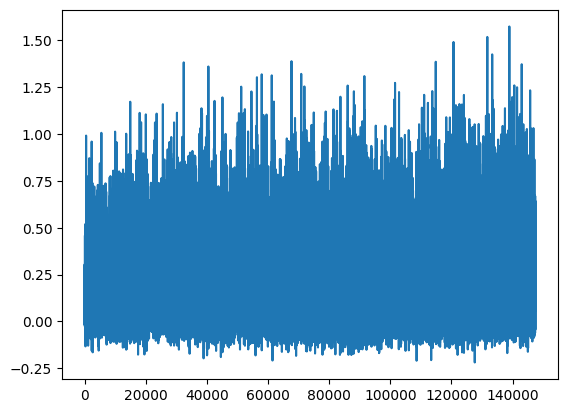

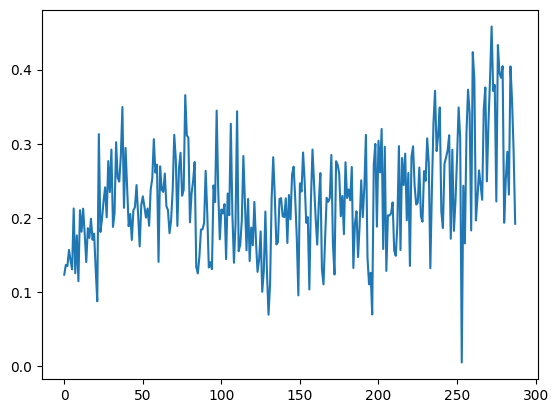

[PPO] Epoch 0: Loss=70.9632, Policy=0.0035, Value=141.9934
[PPO] Epoch 10: Loss=42.9645, Policy=-0.0110, Value=86.0269
[PPO] Epoch 20: Loss=23.6005, Policy=-0.0245, Value=47.3251
[PPO] Epoch 30: Loss=17.1233, Policy=-0.0367, Value=34.3961
Approx KL Learned: 0.03712151572108269
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 73/100 — steps: 2048


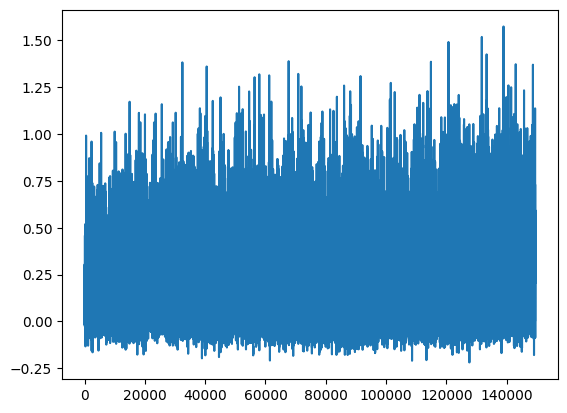

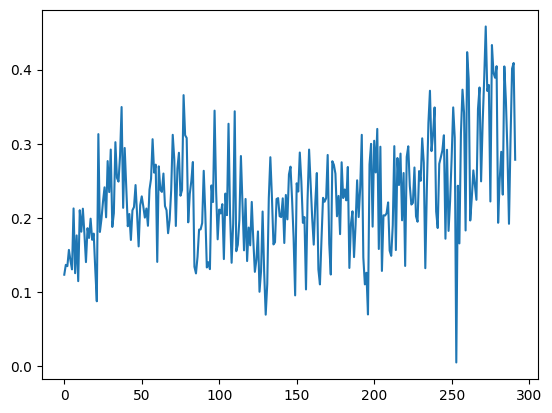

[PPO] Epoch 0: Loss=92.8897, Policy=0.0123, Value=185.8384
[PPO] Epoch 10: Loss=38.9194, Policy=-0.0055, Value=77.9323
[PPO] Epoch 20: Loss=15.3465, Policy=-0.0294, Value=30.8355
[PPO] Epoch 30: Loss=8.3171, Policy=-0.0328, Value=16.7788
Approx KL Learned: 0.03936263546347618
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 74/100 — steps: 2048


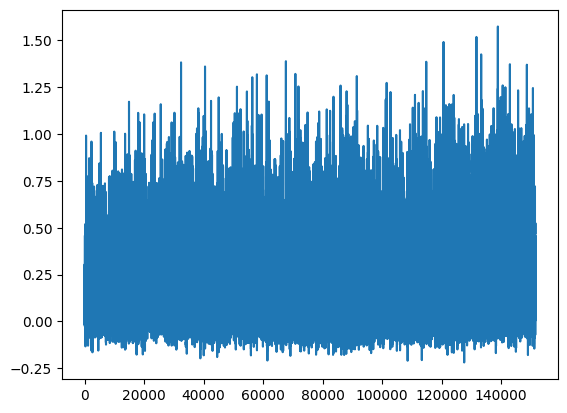

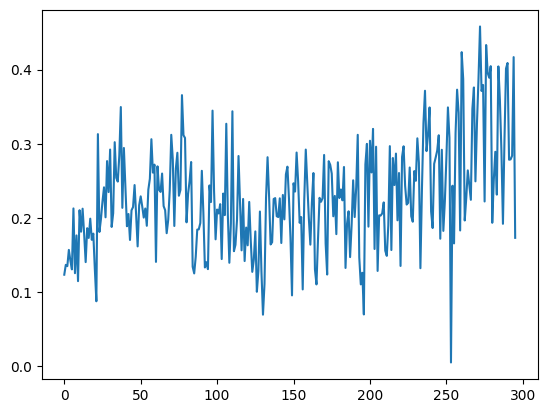

[PPO] Epoch 0: Loss=93.3810, Policy=0.0092, Value=186.8199
[PPO] Epoch 10: Loss=57.3862, Policy=-0.0067, Value=114.8588
[PPO] Epoch 20: Loss=29.5439, Policy=-0.0261, Value=59.2138
[PPO] Epoch 30: Loss=17.4174, Policy=-0.0467, Value=35.0034
Approx KL Learned: 0.07251183688640594
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 75/100 — steps: 2048


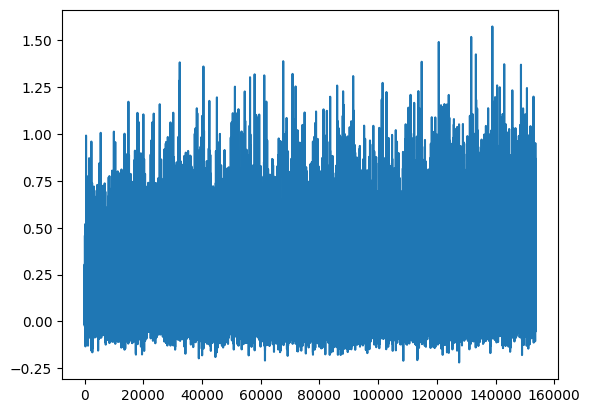

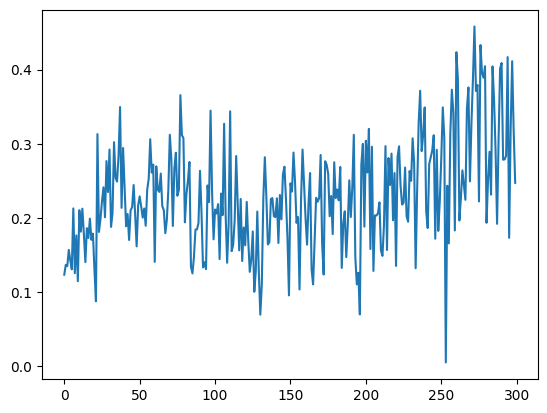

[PPO] Epoch 0: Loss=61.2855, Policy=0.0082, Value=122.6226
[PPO] Epoch 10: Loss=35.2556, Policy=-0.0034, Value=70.5842
[PPO] Epoch 20: Loss=24.3040, Policy=-0.0237, Value=48.7246
[PPO] Epoch 30: Loss=15.3749, Policy=-0.0369, Value=30.8931
Approx KL Learned: 0.06554193794727325
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 76/100 — steps: 2048


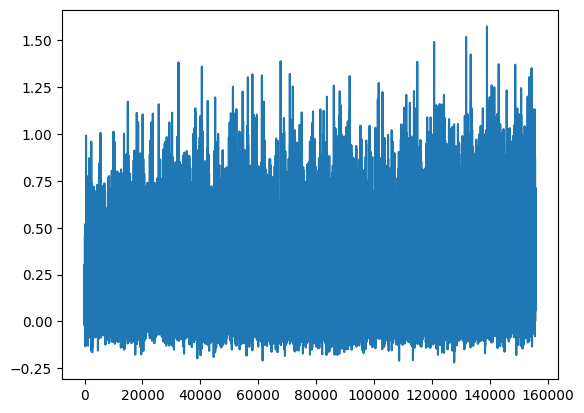

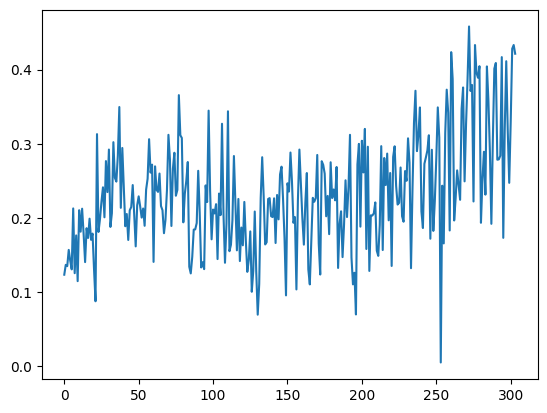

[PPO] Epoch 0: Loss=80.1952, Policy=0.0084, Value=160.4486
[PPO] Epoch 10: Loss=39.3801, Policy=-0.0023, Value=78.8391
[PPO] Epoch 20: Loss=19.3757, Policy=-0.0199, Value=38.8654
[PPO] Epoch 30: Loss=11.4974, Policy=-0.0359, Value=23.1411
Approx KL Learned: 0.0557699054479599
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 77/100 — steps: 2048


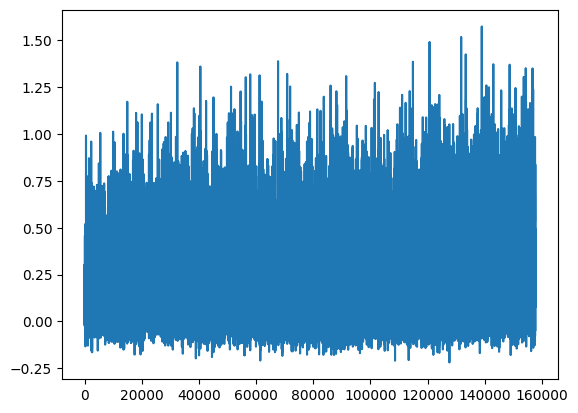

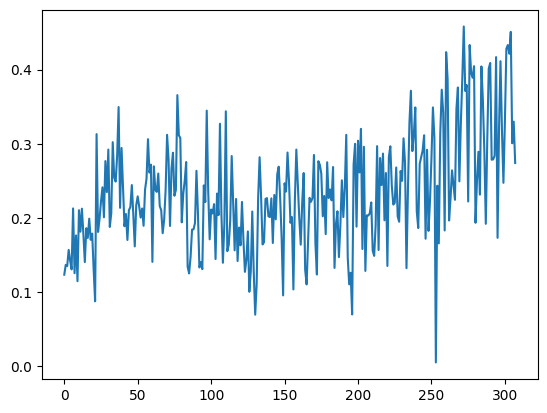

[PPO] Epoch 0: Loss=93.2557, Policy=0.0096, Value=186.5549
[PPO] Epoch 10: Loss=57.4958, Policy=-0.0036, Value=115.0638
[PPO] Epoch 20: Loss=38.6815, Policy=-0.0191, Value=77.4662
[PPO] Epoch 30: Loss=20.4365, Policy=-0.0334, Value=41.0052
Approx KL Learned: 0.06248123198747635
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 78/100 — steps: 2048


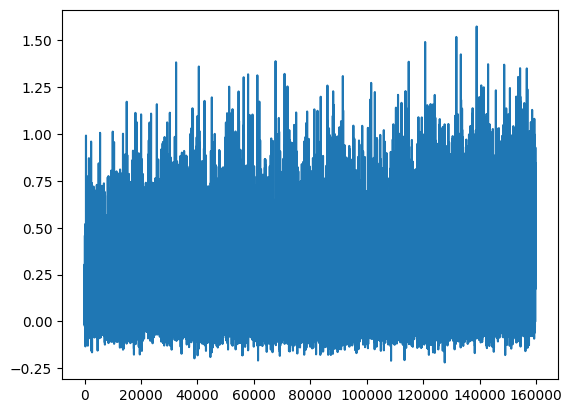

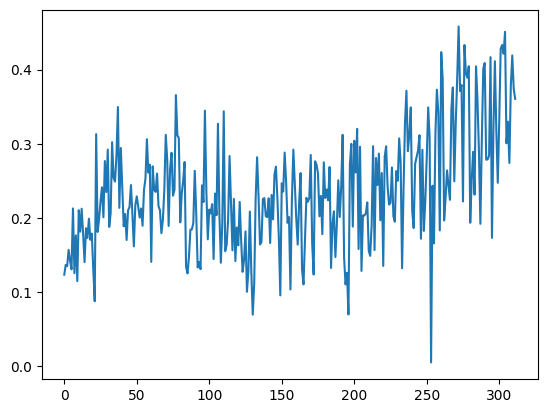

[PPO] Epoch 0: Loss=95.3816, Policy=0.0093, Value=190.8091
[PPO] Epoch 10: Loss=50.9011, Policy=0.0013, Value=101.8659
[PPO] Epoch 20: Loss=23.2845, Policy=-0.0218, Value=46.6789
[PPO] Epoch 30: Loss=12.5669, Policy=-0.0393, Value=25.2808
Approx KL Learned: 0.07116711139678955
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 79/100 — steps: 2048


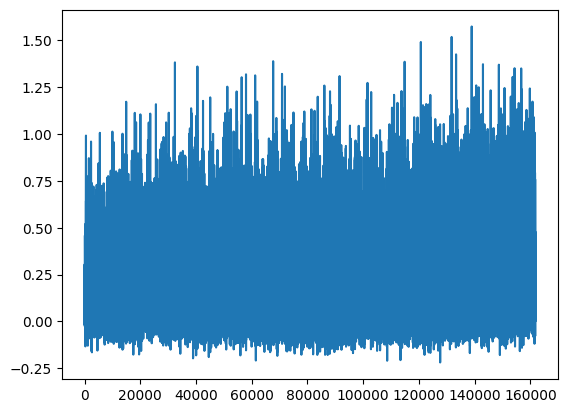

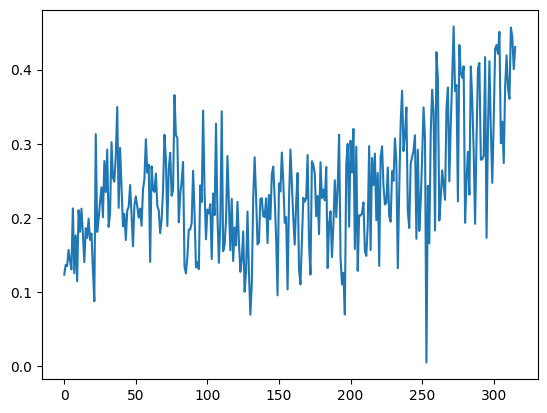

[PPO] Epoch 0: Loss=84.7446, Policy=0.0067, Value=169.5464
[PPO] Epoch 10: Loss=45.9434, Policy=-0.0082, Value=91.9718
[PPO] Epoch 20: Loss=23.5465, Policy=-0.0278, Value=47.2202
[PPO] Epoch 30: Loss=14.4607, Policy=-0.0445, Value=29.0817
Approx KL Learned: 0.05985771119594574
[✅] Actor-Critic checkpoint saved to chkpoint_79.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 80/100 — steps: 2048


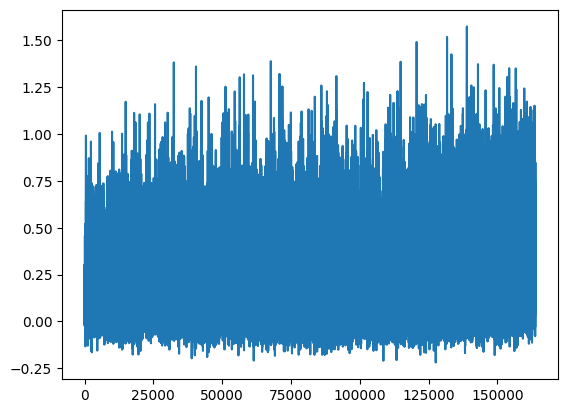

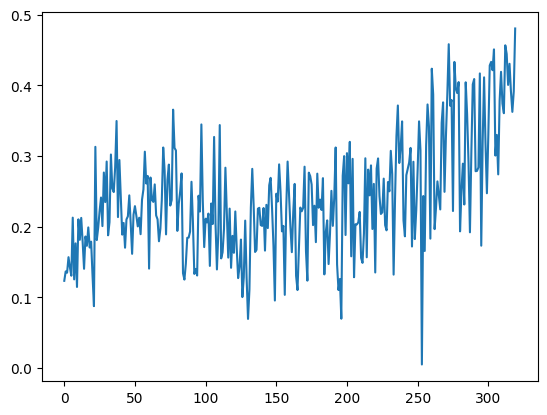

[PPO] Epoch 0: Loss=96.6323, Policy=0.0154, Value=193.3056
[PPO] Epoch 10: Loss=47.9837, Policy=-0.0194, Value=96.0785
[PPO] Epoch 20: Loss=19.4687, Policy=-0.0413, Value=39.0910
[PPO] Epoch 30: Loss=9.1295, Policy=-0.0536, Value=18.4378
Approx KL Learned: 0.10837351530790329
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 81/100 — steps: 2048


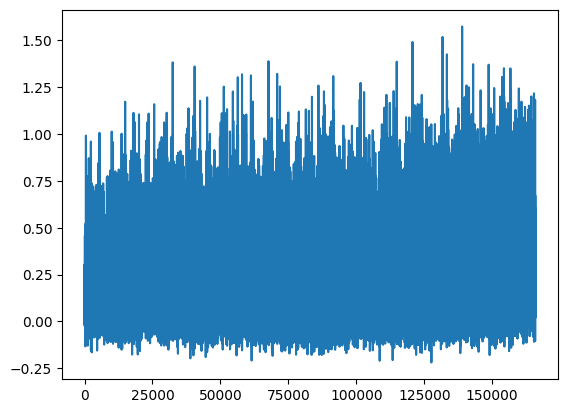

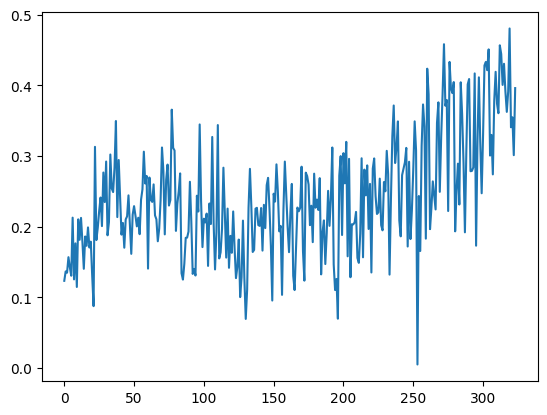

[PPO] Epoch 0: Loss=87.2365, Policy=0.0092, Value=174.5197
[PPO] Epoch 10: Loss=46.9055, Policy=-0.0039, Value=93.8859
[PPO] Epoch 20: Loss=20.6123, Policy=-0.0314, Value=41.3559
[PPO] Epoch 30: Loss=11.6748, Policy=-0.0462, Value=23.5095
Approx KL Learned: 0.07271827757358551
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 82/100 — steps: 2048


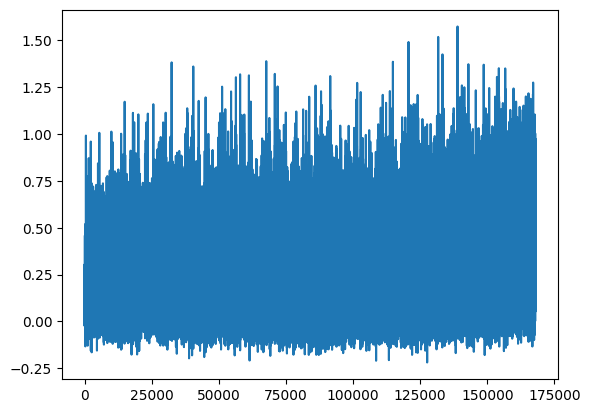

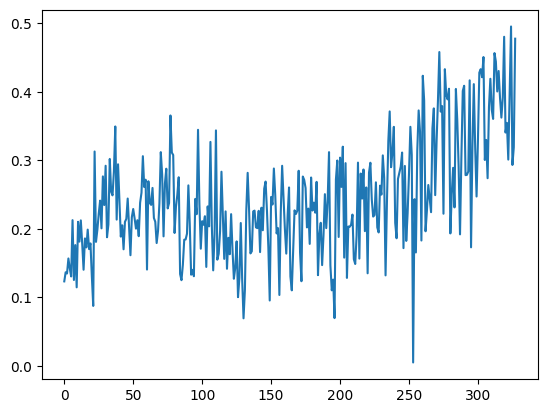

[PPO] Epoch 0: Loss=71.6508, Policy=0.0122, Value=143.3412
[PPO] Epoch 10: Loss=44.5058, Policy=0.0009, Value=89.0668
[PPO] Epoch 20: Loss=32.5886, Policy=-0.0108, Value=65.2588
[PPO] Epoch 30: Loss=19.9656, Policy=-0.0193, Value=40.0318
Approx KL Learned: 0.05658850073814392
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 83/100 — steps: 2048


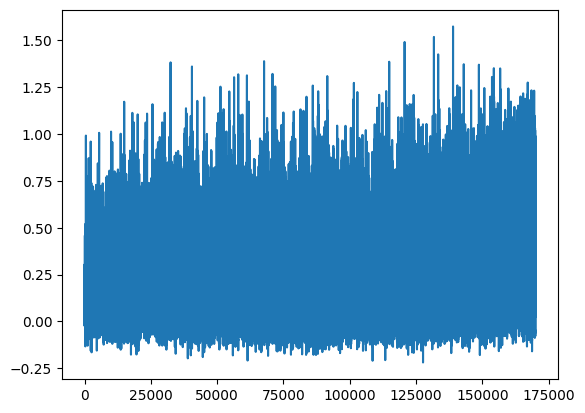

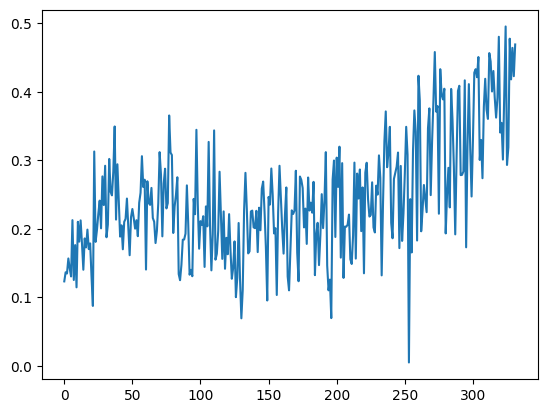

[PPO] Epoch 0: Loss=52.3485, Policy=0.0185, Value=104.7222
[PPO] Epoch 10: Loss=33.3829, Policy=-0.0003, Value=66.8289
[PPO] Epoch 20: Loss=24.8971, Policy=-0.0185, Value=49.8956
[PPO] Epoch 30: Loss=15.8837, Policy=0.0194, Value=31.7963
Approx KL Learned: 0.14183126389980316
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 84/100 — steps: 2048


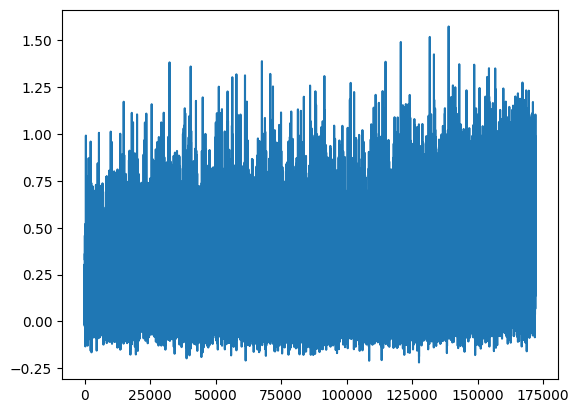

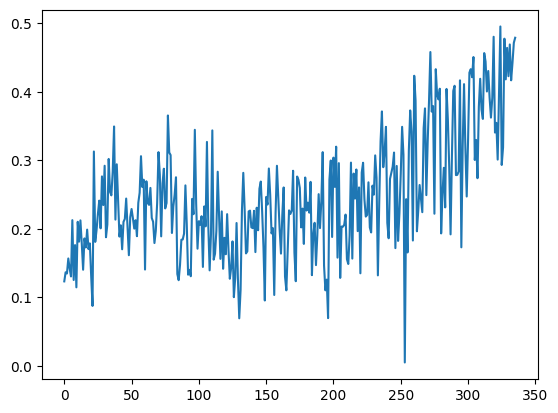

[PPO] Epoch 0: Loss=86.1382, Policy=0.0118, Value=172.3404
[PPO] Epoch 10: Loss=39.3512, Policy=0.0063, Value=78.7791
[PPO] Epoch 20: Loss=21.8502, Policy=-0.0162, Value=43.8187
[PPO] Epoch 30: Loss=13.1859, Policy=-0.0338, Value=26.5271
Approx KL Learned: 0.04916777089238167
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 85/100 — steps: 2048


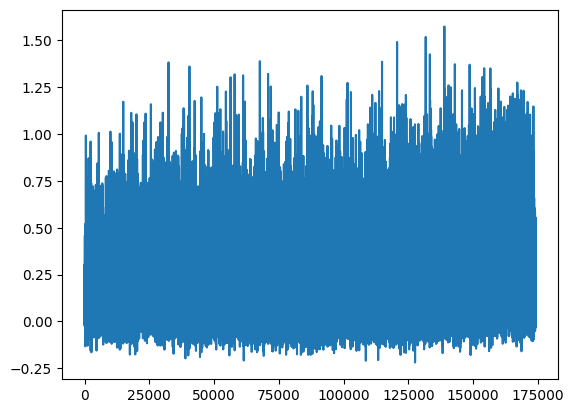

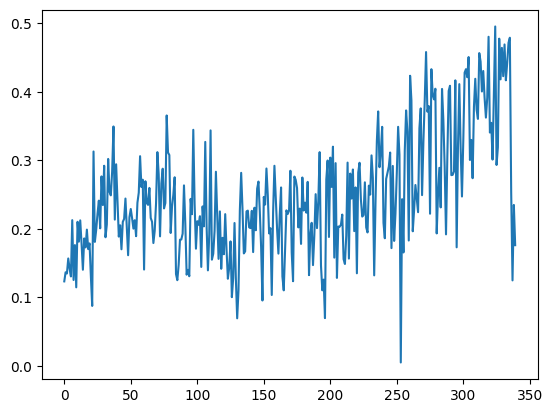

[PPO] Epoch 0: Loss=120.8994, Policy=0.0147, Value=241.8517
[PPO] Epoch 10: Loss=55.5783, Policy=0.0048, Value=111.2314
[PPO] Epoch 20: Loss=18.6182, Policy=-0.0233, Value=37.3661
[PPO] Epoch 30: Loss=9.7267, Policy=-0.0381, Value=19.6102
Approx KL Learned: 0.04706866294145584
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 86/100 — steps: 2048


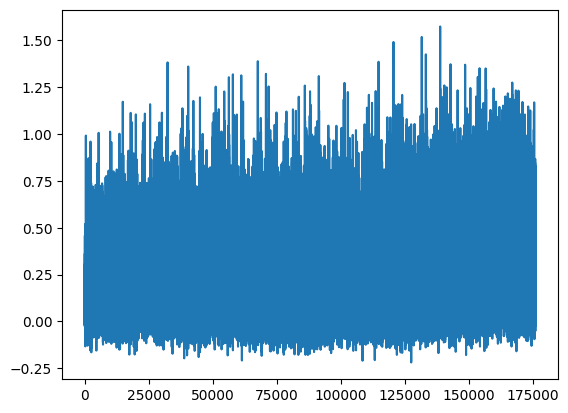

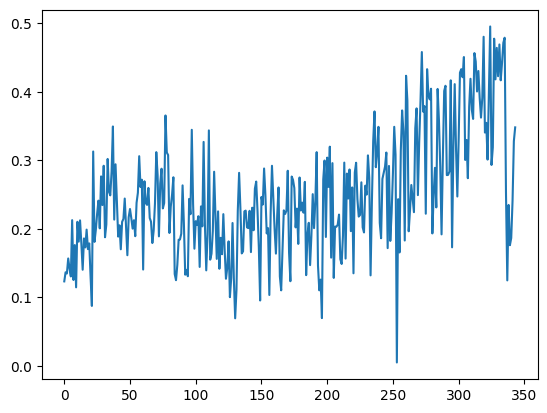

[PPO] Epoch 0: Loss=123.2794, Policy=0.0102, Value=246.6207
[PPO] Epoch 10: Loss=37.0258, Policy=-0.0187, Value=74.1751
[PPO] Epoch 20: Loss=20.6173, Policy=-0.0393, Value=41.4006
[PPO] Epoch 30: Loss=13.7730, Policy=-0.0566, Value=27.7473
Approx KL Learned: 0.06779605895280838
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 87/100 — steps: 2048


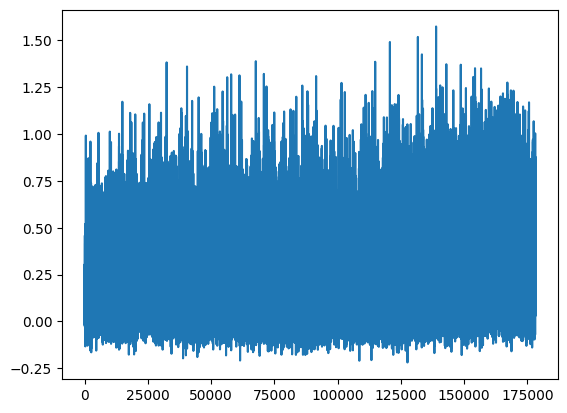

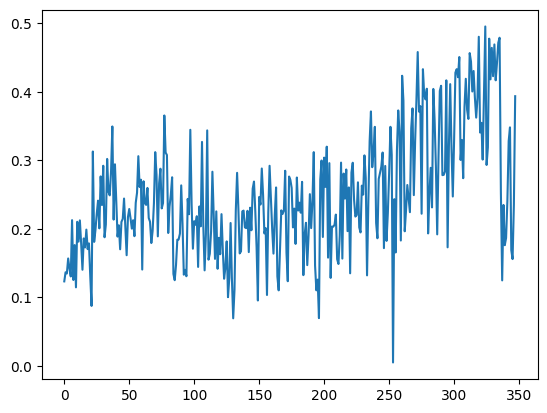

[PPO] Epoch 0: Loss=92.9329, Policy=0.0096, Value=185.9326
[PPO] Epoch 10: Loss=48.1945, Policy=-0.0092, Value=96.4955
[PPO] Epoch 20: Loss=21.8349, Policy=-0.0424, Value=43.8406
[PPO] Epoch 30: Loss=14.5349, Policy=-0.0603, Value=29.2746
Approx KL Learned: 0.056320808827877045
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 88/100 — steps: 2048


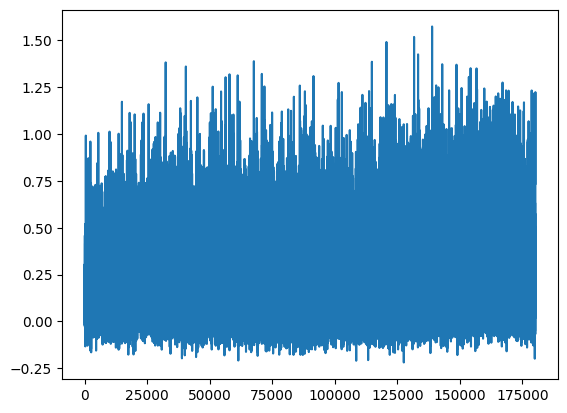

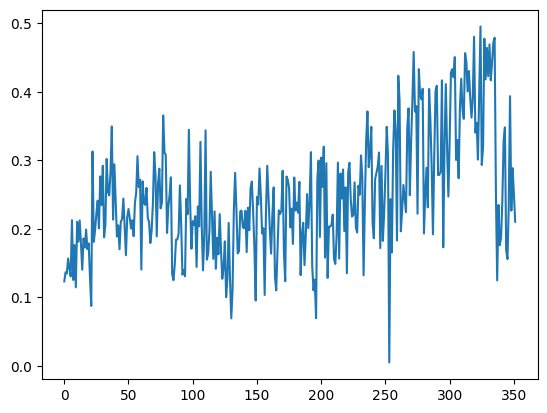

[PPO] Epoch 0: Loss=106.0892, Policy=0.0156, Value=212.2154
[PPO] Epoch 10: Loss=51.5912, Policy=-0.0030, Value=103.2544
[PPO] Epoch 20: Loss=25.2886, Policy=-0.0209, Value=50.6870
[PPO] Epoch 30: Loss=16.0655, Policy=-0.0384, Value=32.2729
Approx KL Learned: 0.06683225929737091
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 89/100 — steps: 2048


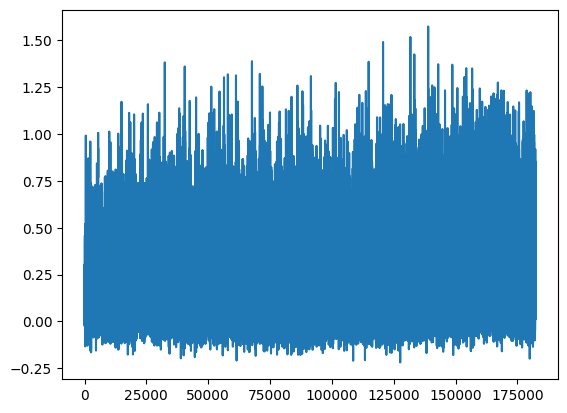

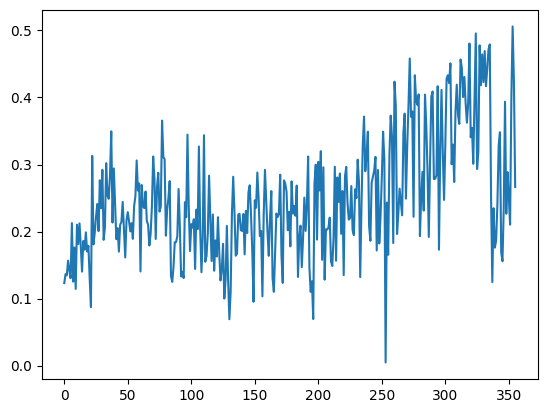

[PPO] Epoch 0: Loss=74.2820, Policy=0.0132, Value=148.6039
[PPO] Epoch 10: Loss=35.5277, Policy=0.0024, Value=71.1163
[PPO] Epoch 20: Loss=18.8263, Policy=-0.0174, Value=37.7541
[PPO] Epoch 30: Loss=13.7223, Policy=-0.0372, Value=27.5891
Approx KL Learned: 0.04682358354330063
[✅] Actor-Critic checkpoint saved to chkpoint_89.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 90/100 — steps: 2048


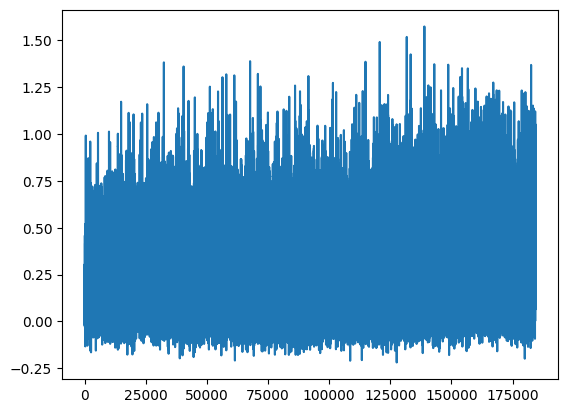

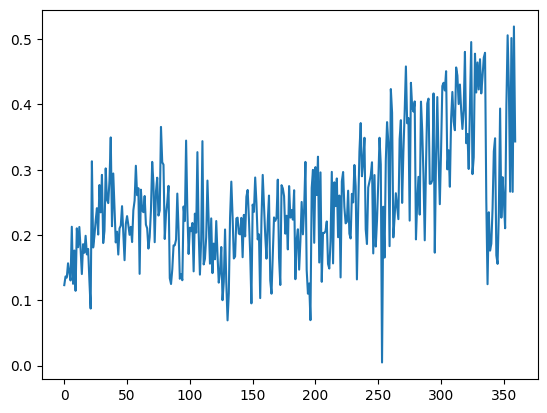

[PPO] Epoch 0: Loss=75.3562, Policy=0.0058, Value=150.7520
[PPO] Epoch 10: Loss=39.1590, Policy=-0.0028, Value=78.3756
[PPO] Epoch 20: Loss=26.2586, Policy=-0.0165, Value=52.6052
[PPO] Epoch 30: Loss=22.2735, Policy=-0.0294, Value=44.6600
Approx KL Learned: 0.03617970645427704
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 91/100 — steps: 2048


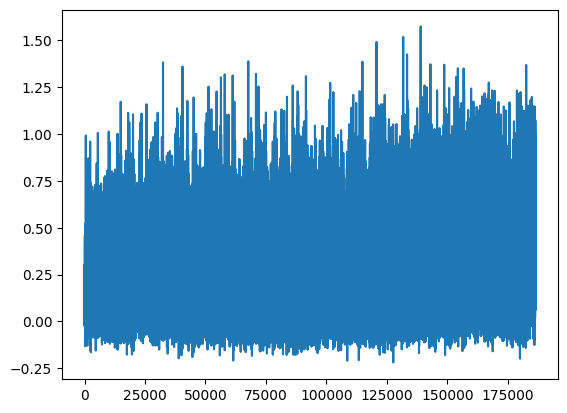

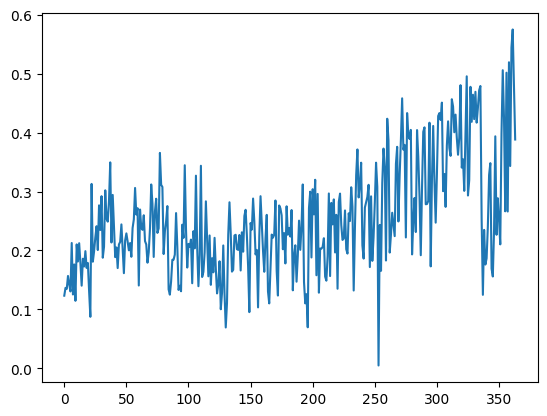

[PPO] Epoch 0: Loss=90.1471, Policy=0.0077, Value=180.3469
[PPO] Epoch 10: Loss=46.3204, Policy=-0.0039, Value=92.7171
[PPO] Epoch 20: Loss=28.9827, Policy=-0.0398, Value=58.1162
[PPO] Epoch 30: Loss=20.2491, Policy=-0.0583, Value=40.6865
Approx KL Learned: 0.1309153437614441
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 92/100 — steps: 2048


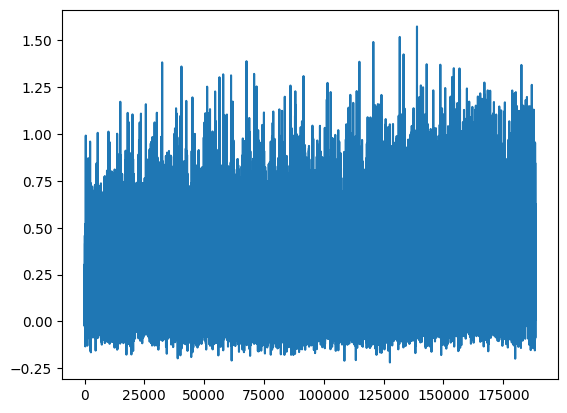

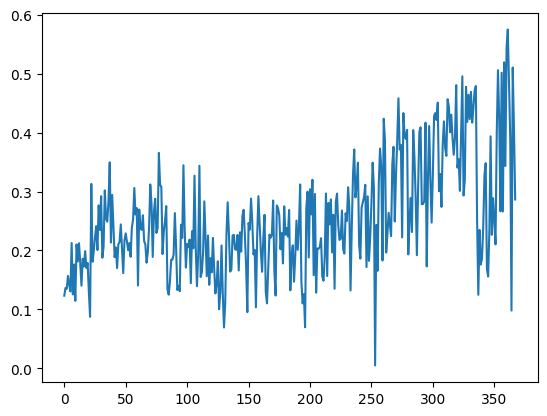

[PPO] Epoch 0: Loss=95.1729, Policy=0.0176, Value=190.3847
[PPO] Epoch 10: Loss=50.8482, Policy=-0.0077, Value=101.7857
[PPO] Epoch 20: Loss=28.9223, Policy=-0.0303, Value=57.9784
[PPO] Epoch 30: Loss=17.3430, Policy=-0.0504, Value=34.8605
Approx KL Learned: 0.06983539462089539
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 93/100 — steps: 2048


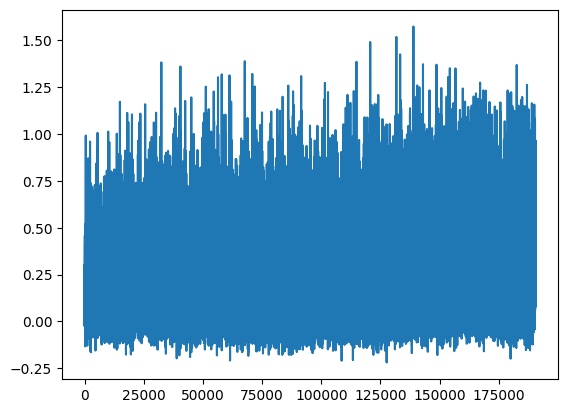

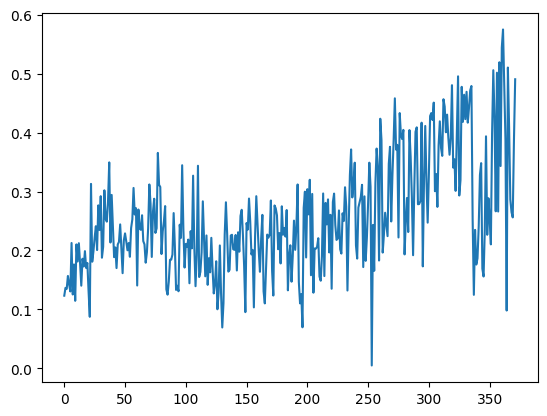

[PPO] Epoch 0: Loss=140.6570, Policy=0.0112, Value=281.3360
[PPO] Epoch 10: Loss=62.7466, Policy=0.0065, Value=125.5281
[PPO] Epoch 20: Loss=40.6879, Policy=-0.0101, Value=81.4436
[PPO] Epoch 30: Loss=24.8596, Policy=-0.0245, Value=49.8181
Approx KL Learned: 0.0944947898387909
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 94/100 — steps: 2048


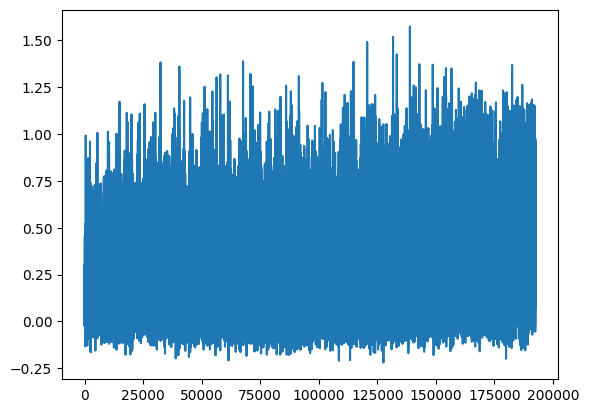

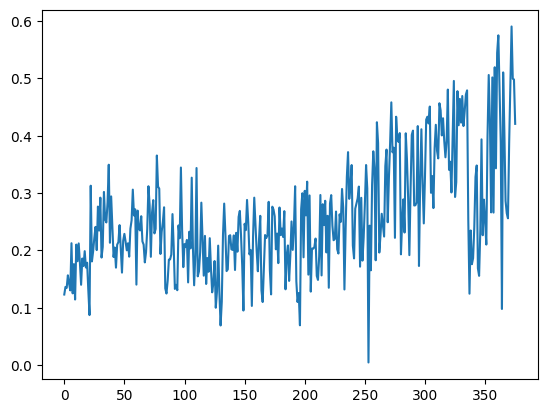

[PPO] Epoch 0: Loss=108.4248, Policy=0.0125, Value=216.8932
[PPO] Epoch 10: Loss=65.8149, Policy=0.0120, Value=131.6745
[PPO] Epoch 20: Loss=36.0565, Policy=-0.0118, Value=72.2086
[PPO] Epoch 30: Loss=24.1765, Policy=-0.0223, Value=48.4701
Approx KL Learned: 0.06244046613574028
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 95/100 — steps: 2048


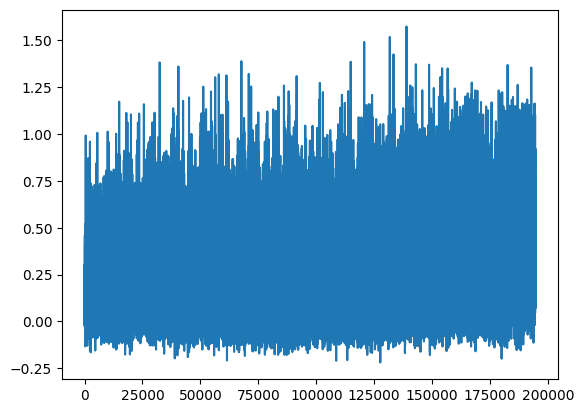

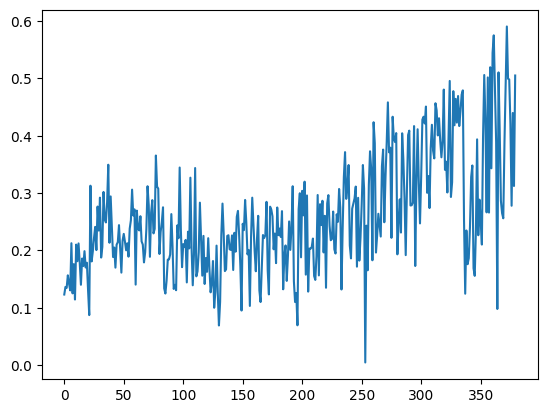

[PPO] Epoch 0: Loss=65.4121, Policy=0.0148, Value=130.8735
[PPO] Epoch 10: Loss=38.9385, Policy=-0.0088, Value=77.9692
[PPO] Epoch 20: Loss=22.4017, Policy=-0.0320, Value=44.9417
[PPO] Epoch 30: Loss=13.1301, Policy=-0.0505, Value=26.4375
Approx KL Learned: 0.09296248853206635
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 96/100 — steps: 2048


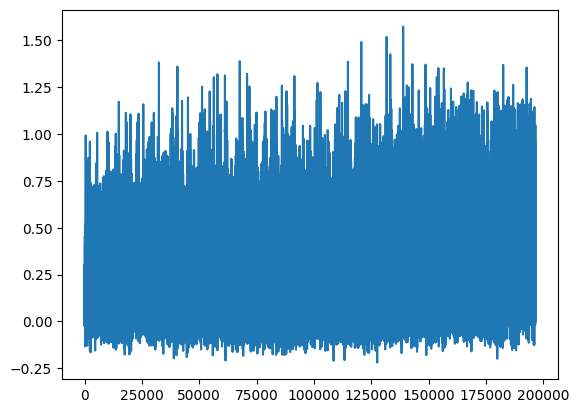

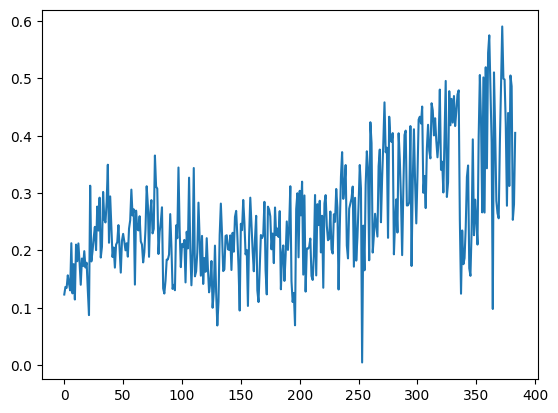

[PPO] Epoch 0: Loss=76.8236, Policy=0.0066, Value=153.7210
[PPO] Epoch 10: Loss=42.2136, Policy=0.0545, Value=84.3829
[PPO] Epoch 20: Loss=28.6844, Policy=0.0397, Value=57.3578
[PPO] Epoch 30: Loss=19.4996, Policy=0.0035, Value=39.0739
Approx KL Learned: 0.07363448292016983
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 97/100 — steps: 2048


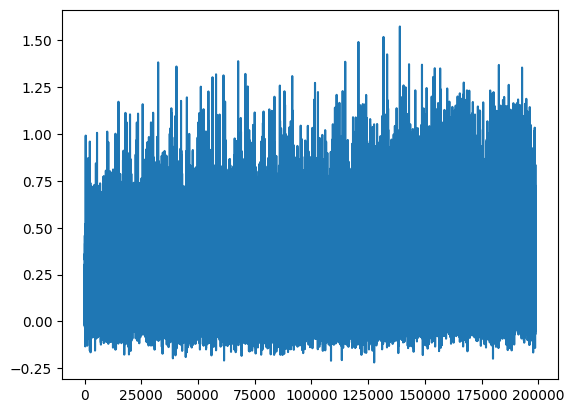

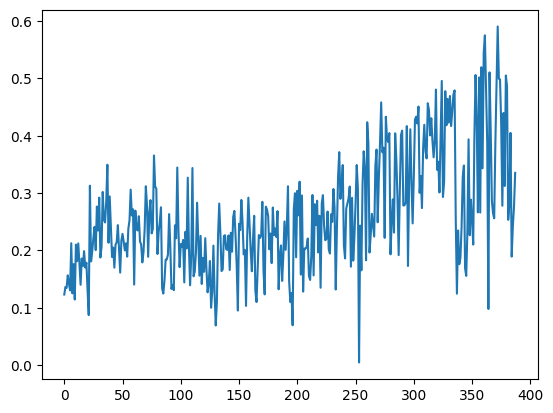

[PPO] Epoch 0: Loss=56.2466, Policy=0.0165, Value=112.5090
[PPO] Epoch 10: Loss=32.2162, Policy=0.0222, Value=64.4408
[PPO] Epoch 20: Loss=22.5339, Policy=-0.0077, Value=45.1321
[PPO] Epoch 30: Loss=12.3379, Policy=-0.0187, Value=24.7620
Approx KL Learned: 0.19437292218208313
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 98/100 — steps: 2048


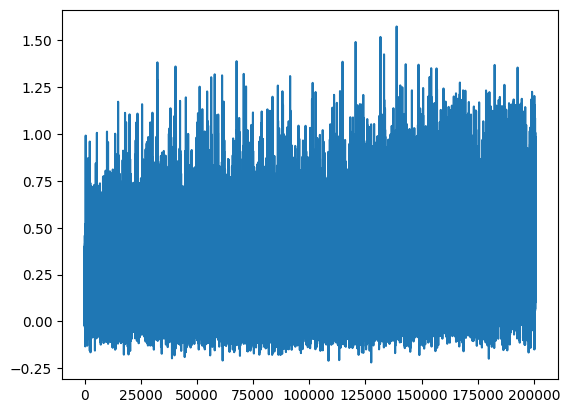

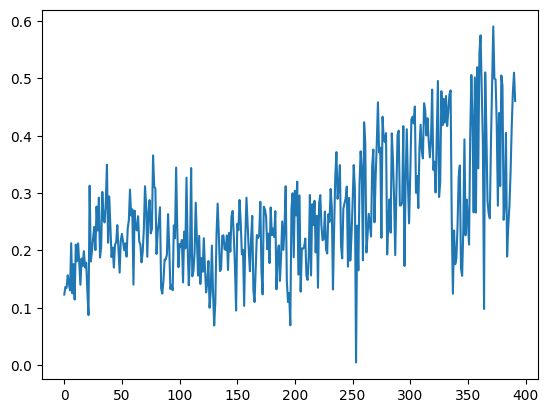

[PPO] Epoch 0: Loss=55.1044, Policy=0.0060, Value=110.2442
[PPO] Epoch 10: Loss=33.2085, Policy=-0.0095, Value=66.4799
[PPO] Epoch 20: Loss=18.1289, Policy=-0.0284, Value=36.3618
[PPO] Epoch 30: Loss=11.0054, Policy=-0.0400, Value=22.1375
Approx KL Learned: 0.0524950847029686
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 99/100 — steps: 2048


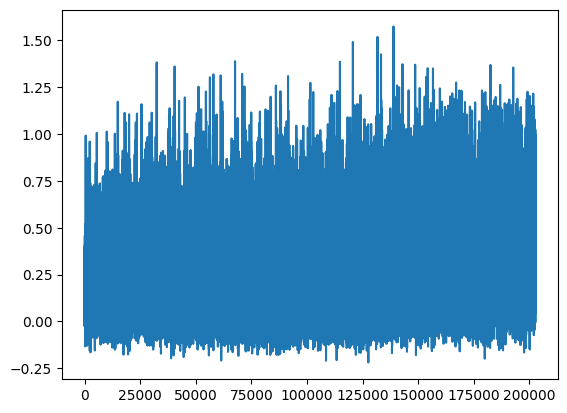

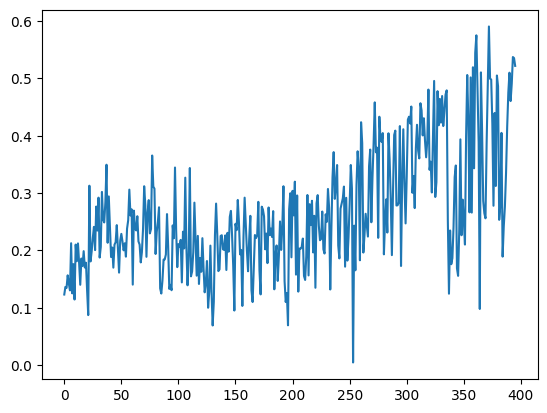

[PPO] Epoch 0: Loss=50.5086, Policy=0.0061, Value=101.0613
[PPO] Epoch 10: Loss=24.7750, Policy=-0.0118, Value=49.6337
[PPO] Epoch 20: Loss=16.1403, Policy=-0.0314, Value=32.4035
[PPO] Epoch 30: Loss=12.3882, Policy=-0.0500, Value=24.9353
Approx KL Learned: 0.07657988369464874
[✅] Actor-Critic checkpoint saved to chkpoint_99.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 100/100 — steps: 2048


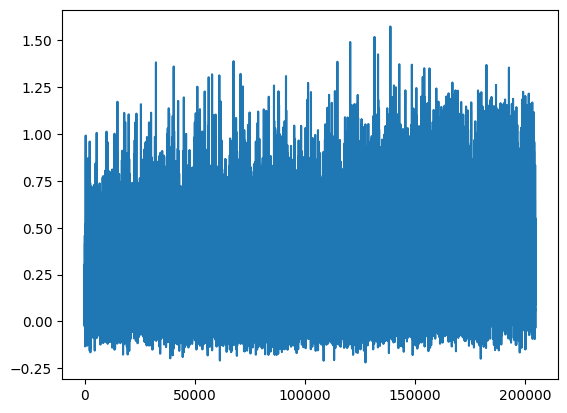

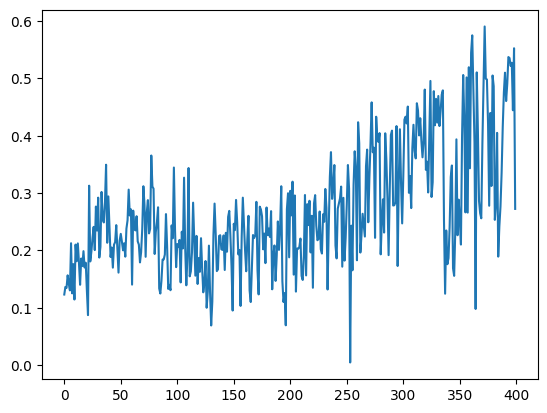

In [7]:
buf, rewards = train(controller, "clip_actor_critic_checkpoint_long_training.pt", ppo, clip_env, clip_actor_critic, 100)

[PPO] Epoch 0: Loss=88.0769, Policy=0.0110, Value=176.1808
[PPO] Epoch 10: Loss=30.1053, Policy=-0.0079, Value=60.2778
[PPO] Epoch 20: Loss=17.4728, Policy=-0.0293, Value=35.0505
[PPO] Epoch 30: Loss=10.0778, Policy=-0.0471, Value=20.2991
Approx KL Learned: 0.05416448414325714
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 1/100 — steps: 2048


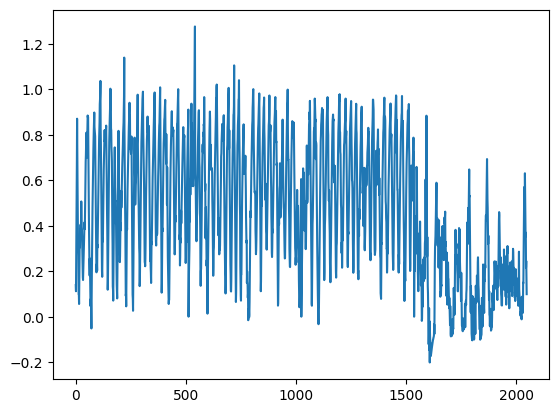

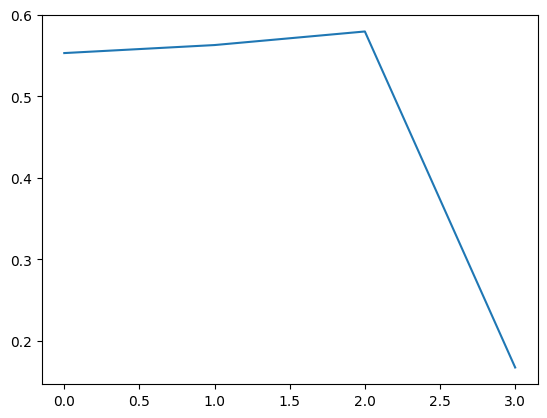

[PPO] Epoch 0: Loss=118.9301, Policy=0.0110, Value=237.9253
[PPO] Epoch 10: Loss=38.5040, Policy=0.0093, Value=77.0763
[PPO] Epoch 20: Loss=34.6468, Policy=-0.0077, Value=69.3943
[PPO] Epoch 30: Loss=30.2992, Policy=-0.0023, Value=60.6897
Approx KL Learned: 0.03507554903626442
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 2/100 — steps: 2048


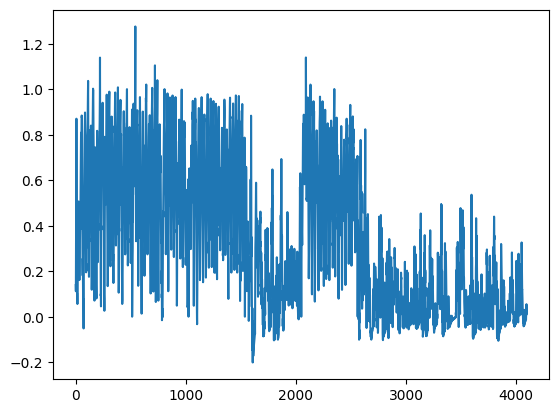

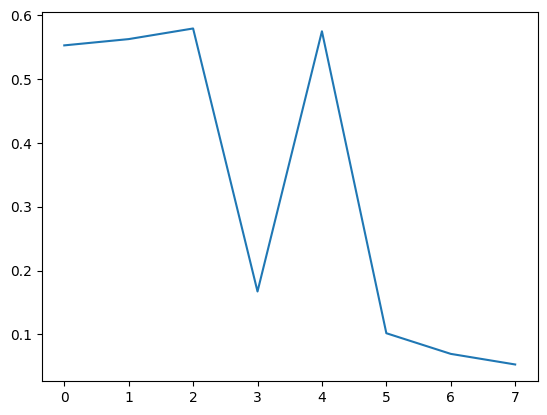

[PPO] Epoch 0: Loss=158.3675, Policy=0.0158, Value=316.7791
[PPO] Epoch 10: Loss=77.4949, Policy=0.0057, Value=155.0553
[PPO] Epoch 20: Loss=45.9489, Policy=-0.0220, Value=92.0196
[PPO] Epoch 30: Loss=35.6091, Policy=-0.0419, Value=71.3778
Approx KL Learned: 0.06047386676073074
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 3/100 — steps: 2048


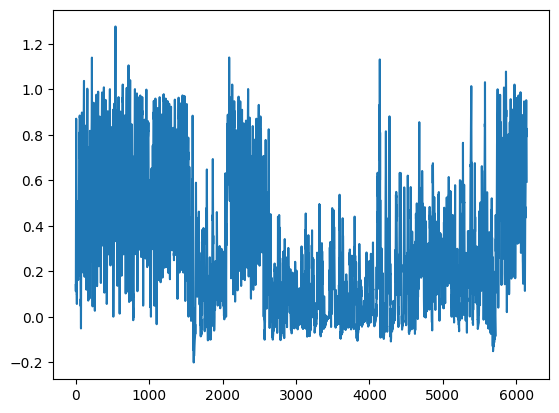

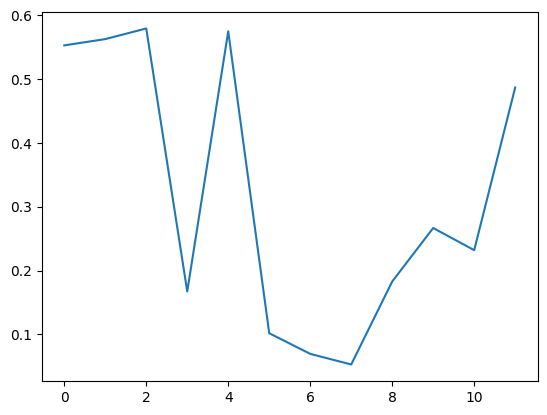

[PPO] Epoch 0: Loss=179.1168, Policy=0.0068, Value=358.2975
[PPO] Epoch 10: Loss=80.3137, Policy=0.0144, Value=160.6830
[PPO] Epoch 20: Loss=37.9387, Policy=-0.0140, Value=75.9932
[PPO] Epoch 30: Loss=21.4623, Policy=-0.0307, Value=43.0688
Approx KL Learned: 0.08193258941173553
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 4/100 — steps: 2048


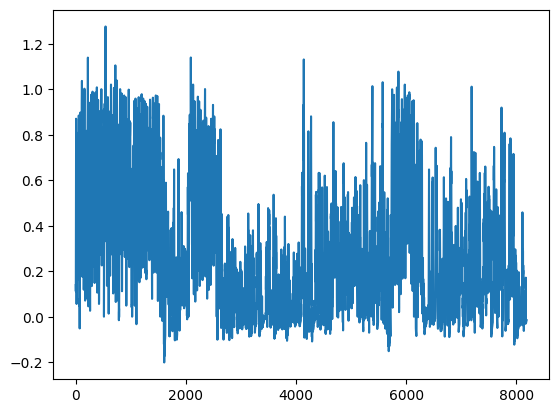

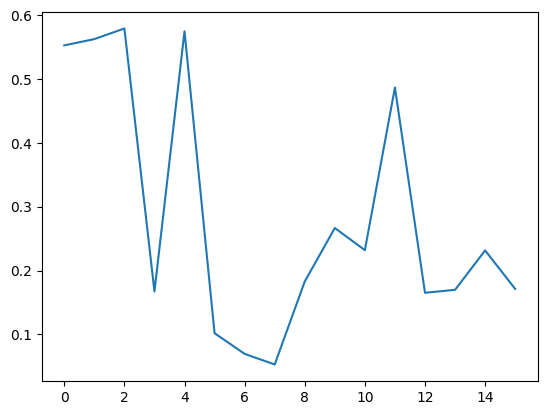

[PPO] Epoch 0: Loss=112.9537, Policy=0.0111, Value=225.9465
[PPO] Epoch 10: Loss=60.2272, Policy=-0.0044, Value=120.5255
[PPO] Epoch 20: Loss=38.4308, Policy=-0.0232, Value=76.9759
[PPO] Epoch 30: Loss=34.3651, Policy=-0.0456, Value=68.8886
Approx KL Learned: 0.09468930214643478
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 5/100 — steps: 2048


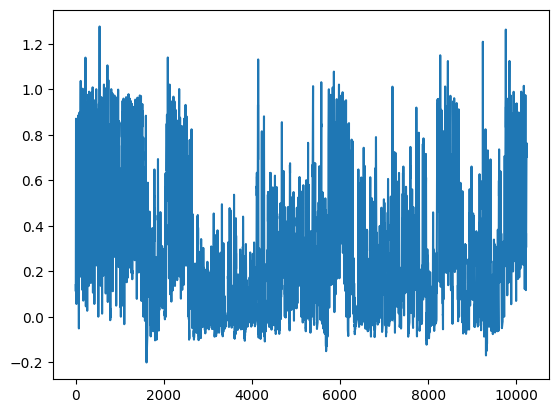

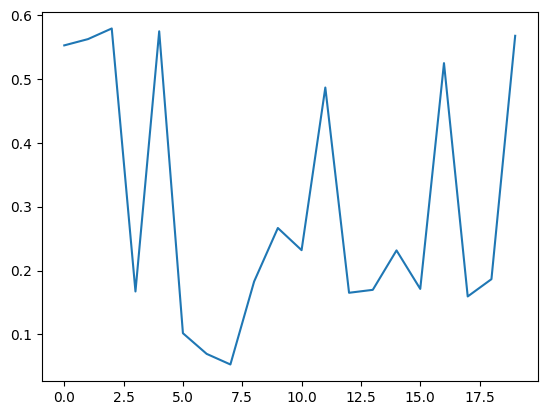

[PPO] Epoch 0: Loss=163.0760, Policy=0.0132, Value=326.1654
[PPO] Epoch 10: Loss=57.4838, Policy=0.0061, Value=114.9953
[PPO] Epoch 20: Loss=36.2213, Policy=0.0009, Value=72.4814
[PPO] Epoch 30: Loss=21.0974, Policy=-0.0129, Value=42.2629
Approx KL Learned: 0.06790877878665924
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 6/100 — steps: 2048


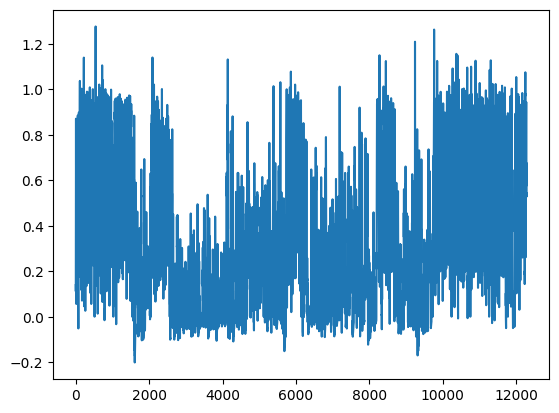

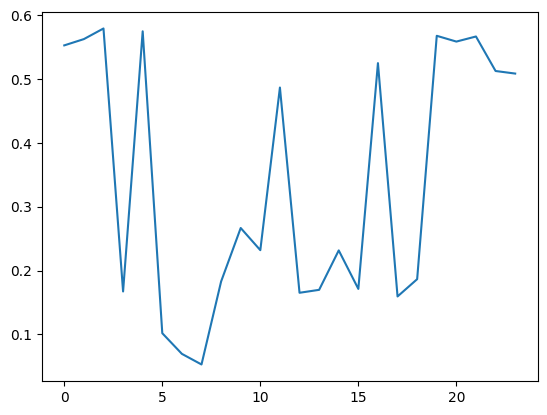

[PPO] Epoch 0: Loss=130.7062, Policy=0.0150, Value=261.4396
[PPO] Epoch 10: Loss=53.6498, Policy=0.0053, Value=107.3400
[PPO] Epoch 20: Loss=23.2827, Policy=-0.0173, Value=46.6516
[PPO] Epoch 30: Loss=18.5008, Policy=-0.0269, Value=37.1108
Approx KL Learned: 0.0548524372279644
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 7/100 — steps: 2048


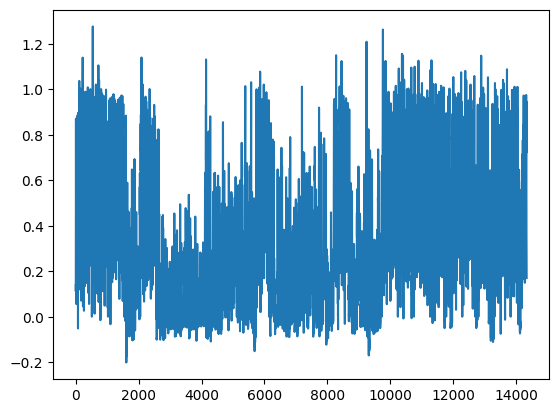

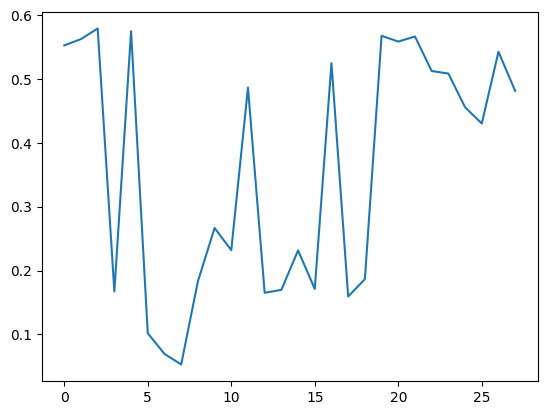

[PPO] Epoch 0: Loss=81.3106, Policy=0.0139, Value=162.6497
[PPO] Epoch 10: Loss=24.5657, Policy=-0.0041, Value=49.1938
[PPO] Epoch 20: Loss=15.5588, Policy=-0.0157, Value=31.2025
[PPO] Epoch 30: Loss=7.7016, Policy=-0.0378, Value=15.5334
Approx KL Learned: 0.02943704091012478
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 8/100 — steps: 2048


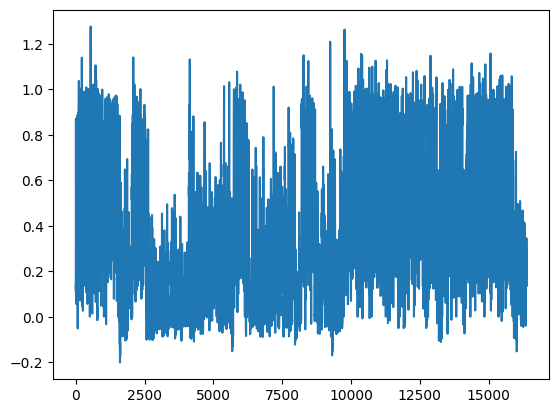

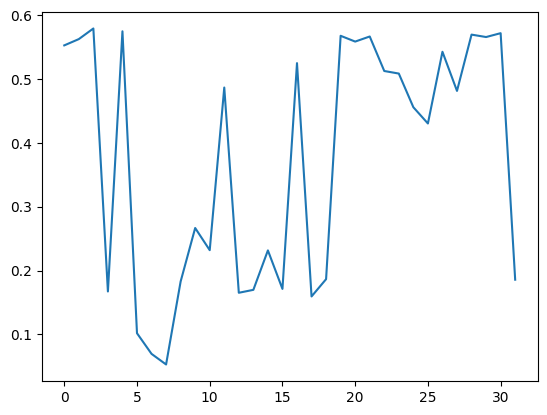

[PPO] Epoch 0: Loss=76.1420, Policy=0.0104, Value=152.3048
[PPO] Epoch 10: Loss=33.7571, Policy=-0.0002, Value=67.5489
[PPO] Epoch 20: Loss=19.5022, Policy=-0.0147, Value=39.0746
[PPO] Epoch 30: Loss=15.6363, Policy=-0.0189, Value=31.3537
Approx KL Learned: 0.0577954426407814
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 9/100 — steps: 2048


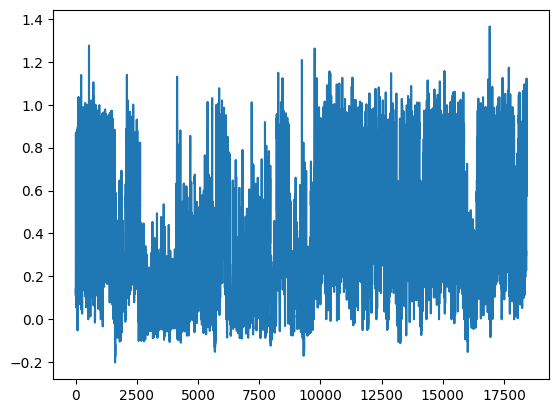

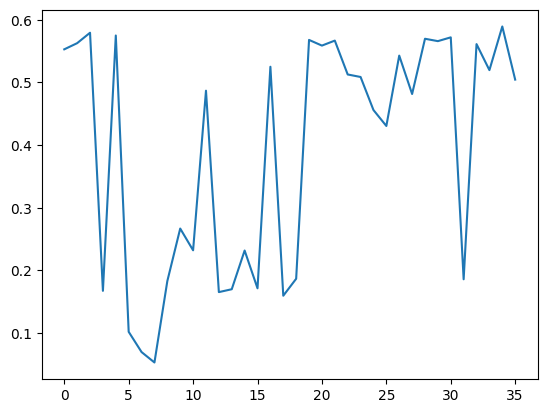

[PPO] Epoch 0: Loss=65.4605, Policy=0.0068, Value=130.9464
[PPO] Epoch 10: Loss=37.5556, Policy=-0.0014, Value=75.1552
[PPO] Epoch 20: Loss=26.3425, Policy=-0.0116, Value=52.7543
[PPO] Epoch 30: Loss=17.5477, Policy=-0.0273, Value=35.1977
Approx KL Learned: 0.07614479959011078
[✅] Actor-Critic checkpoint saved to chkpoint_9.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 10/100 — steps: 2048


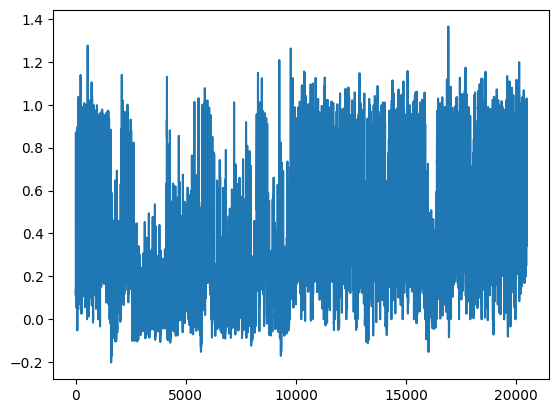

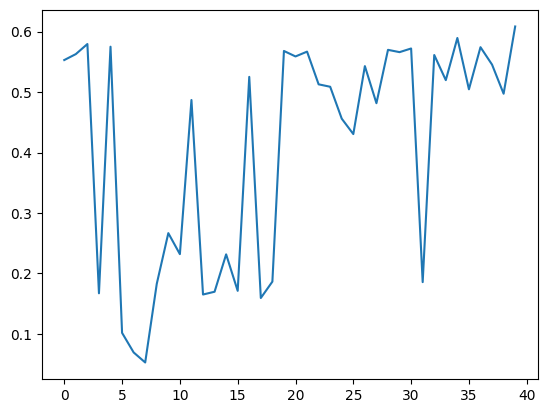

[PPO] Epoch 0: Loss=85.4142, Policy=0.0075, Value=170.8826
[PPO] Epoch 10: Loss=37.8107, Policy=-0.0108, Value=75.7091
[PPO] Epoch 20: Loss=23.4573, Policy=-0.0312, Value=47.0436
[PPO] Epoch 30: Loss=13.9388, Policy=-0.0460, Value=28.0359
Approx KL Learned: 0.04759887978434563
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 11/100 — steps: 2048


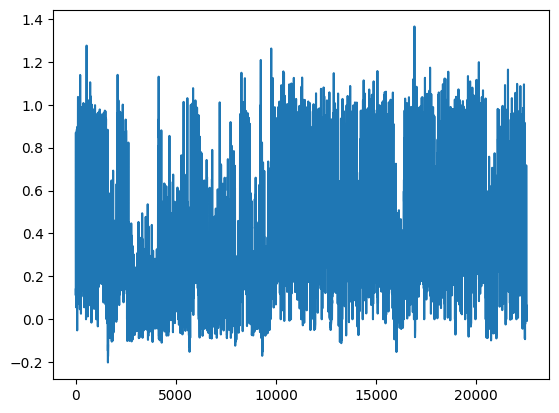

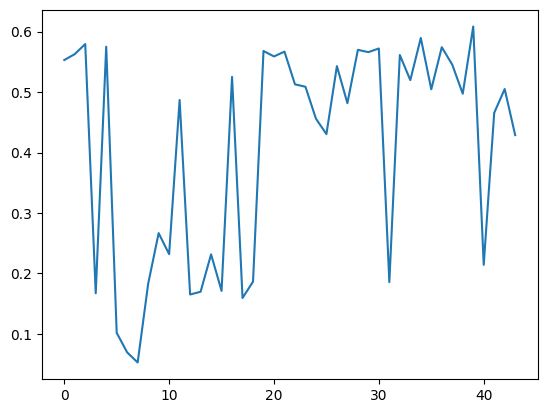

[PPO] Epoch 0: Loss=67.8909, Policy=0.0234, Value=135.7788
[PPO] Epoch 10: Loss=32.2581, Policy=0.0012, Value=64.5533
[PPO] Epoch 20: Loss=17.9830, Policy=-0.0261, Value=36.0628
[PPO] Epoch 30: Loss=13.5427, Policy=-0.0379, Value=27.2057
Approx KL Learned: 0.09436649084091187
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 12/100 — steps: 2048


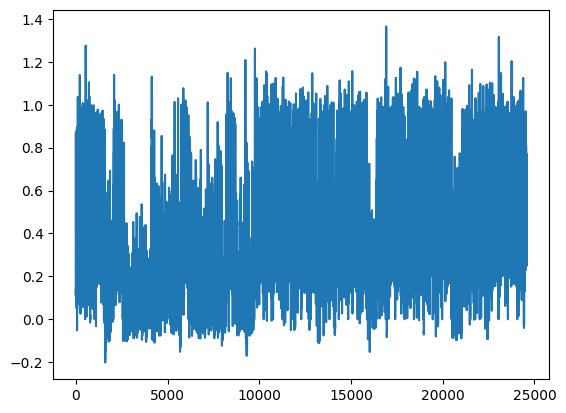

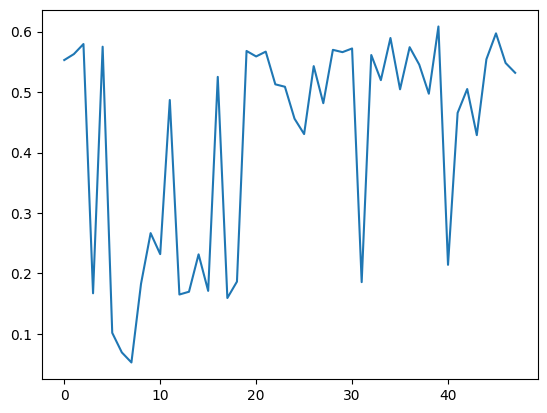

[PPO] Epoch 0: Loss=137.4070, Policy=0.0063, Value=274.9008
[PPO] Epoch 10: Loss=71.3544, Policy=-0.0003, Value=142.8084
[PPO] Epoch 20: Loss=34.5952, Policy=-0.0175, Value=69.3238
[PPO] Epoch 30: Loss=31.2920, Policy=-0.0352, Value=62.7493
Approx KL Learned: 0.027527639642357826
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 13/100 — steps: 2048


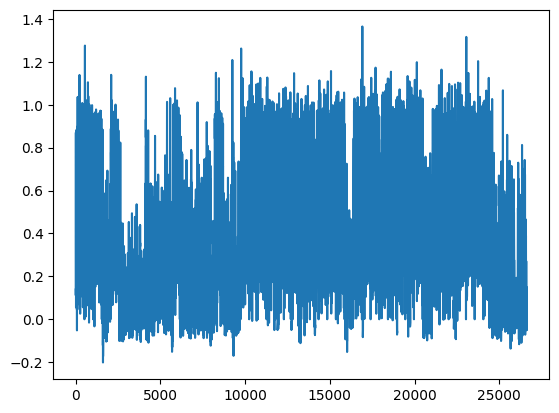

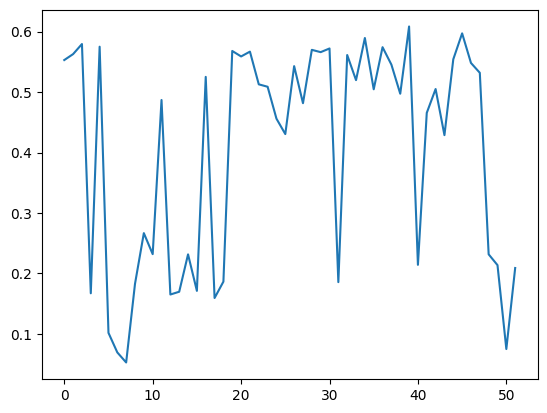

[PPO] Epoch 0: Loss=99.9047, Policy=0.0152, Value=199.8522
[PPO] Epoch 10: Loss=30.3247, Policy=-0.0065, Value=60.7339
[PPO] Epoch 20: Loss=16.0477, Policy=-0.0325, Value=32.2301
[PPO] Epoch 30: Loss=7.5979, Policy=-0.0641, Value=15.3918
Approx KL Learned: 0.07055783271789551
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 14/100 — steps: 2048


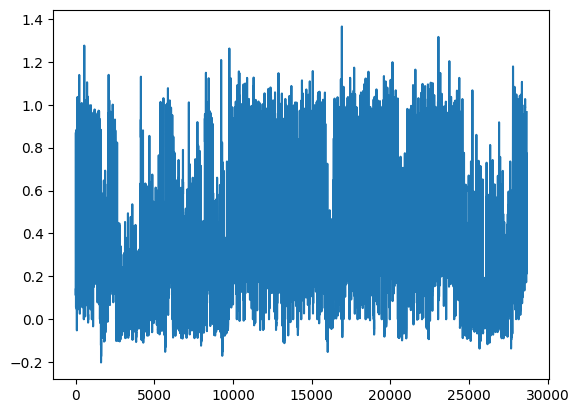

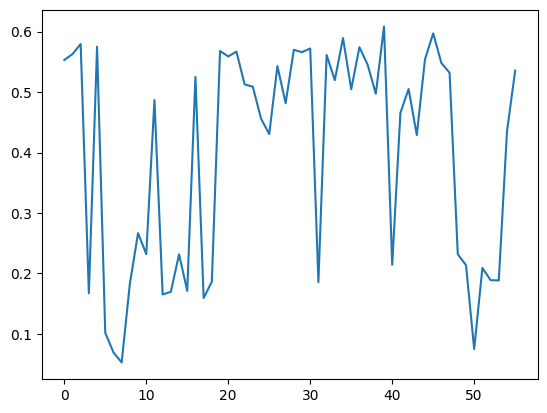

[PPO] Epoch 0: Loss=74.2911, Policy=0.0158, Value=148.5963
[PPO] Epoch 10: Loss=24.2394, Policy=0.0024, Value=48.5170
[PPO] Epoch 20: Loss=12.3052, Policy=-0.0305, Value=24.7164
[PPO] Epoch 30: Loss=5.3260, Policy=-0.0541, Value=10.8024
Approx KL Learned: 0.07560886442661285
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 15/100 — steps: 2048


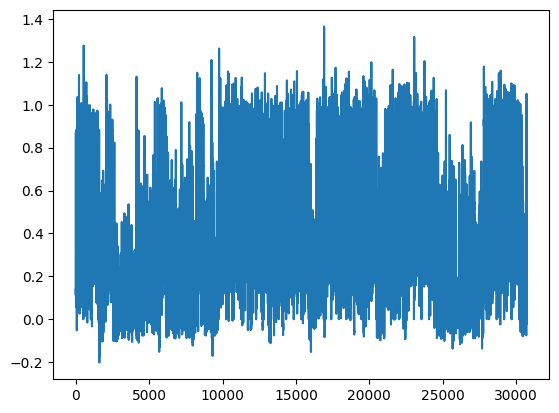

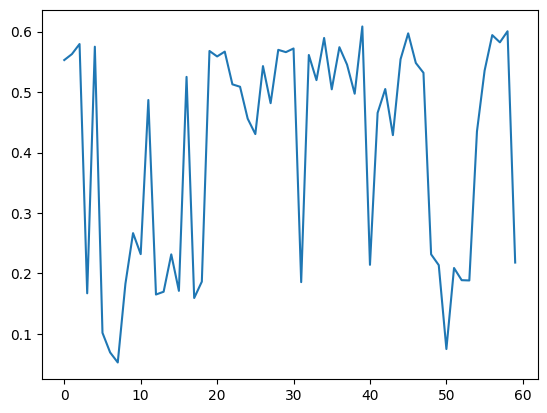

[PPO] Epoch 0: Loss=99.5007, Policy=0.0175, Value=199.0437
[PPO] Epoch 10: Loss=51.2556, Policy=0.0161, Value=102.5555
[PPO] Epoch 20: Loss=28.4018, Policy=-0.0135, Value=56.9118
[PPO] Epoch 30: Loss=18.2535, Policy=-0.0387, Value=36.6624
Approx KL Learned: 0.07141362130641937
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 16/100 — steps: 2048


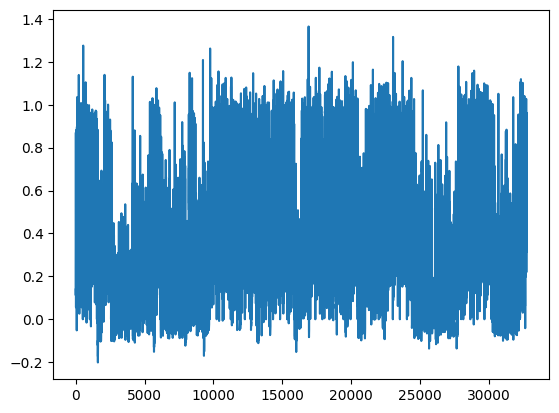

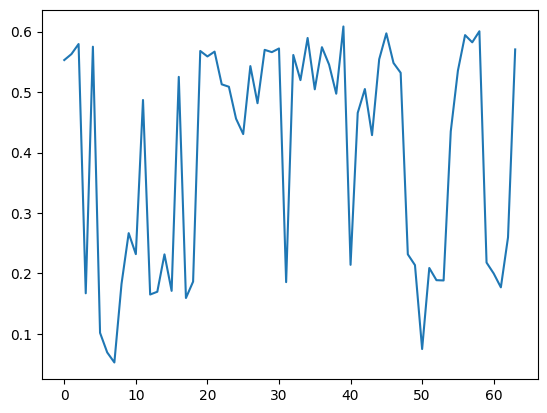

[PPO] Epoch 0: Loss=101.2782, Policy=0.0195, Value=202.5395
[PPO] Epoch 10: Loss=35.3122, Policy=0.0102, Value=70.6260
[PPO] Epoch 20: Loss=20.6400, Policy=-0.0128, Value=41.3399
[PPO] Epoch 30: Loss=10.2932, Policy=-0.0219, Value=20.6728
Approx KL Learned: 0.18926341831684113
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 17/100 — steps: 2048


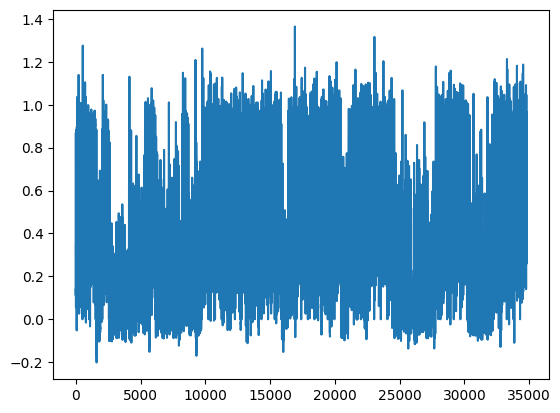

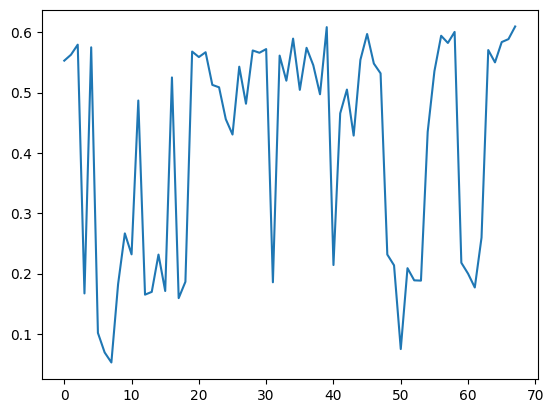

[PPO] Epoch 0: Loss=125.1981, Policy=0.0150, Value=250.4429
[PPO] Epoch 10: Loss=51.4357, Policy=0.0193, Value=102.9107
[PPO] Epoch 20: Loss=24.4931, Policy=-0.0243, Value=49.1127
[PPO] Epoch 30: Loss=12.9927, Policy=-0.0386, Value=26.1442
Approx KL Learned: 0.09935830533504486
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 18/100 — steps: 2048


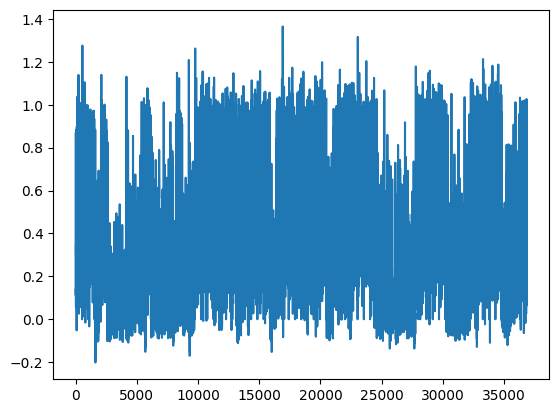

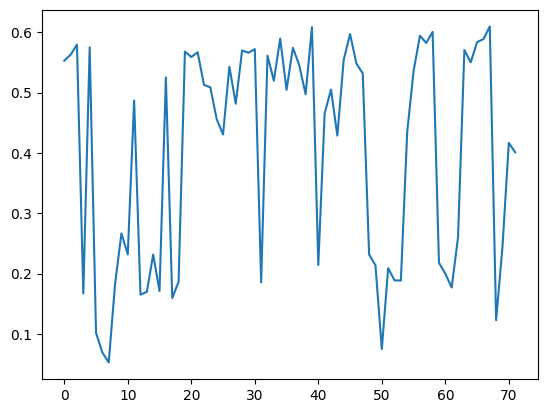

[PPO] Epoch 0: Loss=92.3569, Policy=0.0088, Value=184.7599
[PPO] Epoch 10: Loss=42.0963, Policy=-0.0051, Value=84.2636
[PPO] Epoch 20: Loss=23.7494, Policy=-0.0220, Value=47.6021
[PPO] Epoch 30: Loss=12.9891, Policy=-0.0421, Value=26.1217
Approx KL Learned: 0.038148850202560425
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 19/100 — steps: 2048


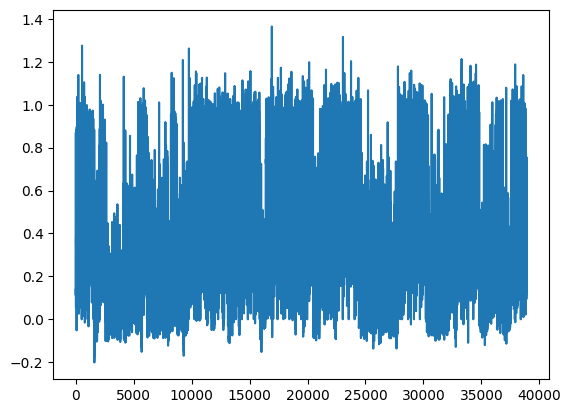

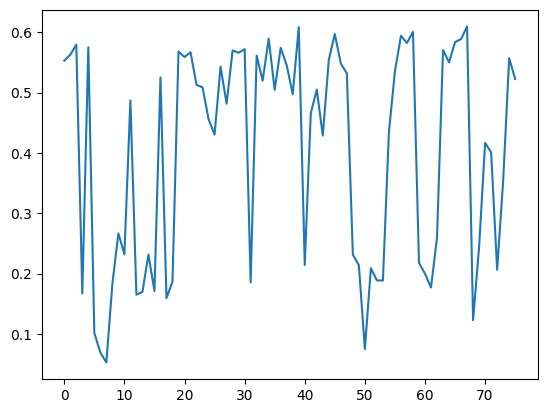

[PPO] Epoch 0: Loss=98.2755, Policy=0.0055, Value=196.5950
[PPO] Epoch 10: Loss=31.5976, Policy=-0.0056, Value=63.2594
[PPO] Epoch 20: Loss=19.7369, Policy=-0.0297, Value=39.5866
[PPO] Epoch 30: Loss=12.2691, Policy=-0.0438, Value=24.6804
Approx KL Learned: 0.05399185046553612
[✅] Actor-Critic checkpoint saved to chkpoint_19.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 20/100 — steps: 2048


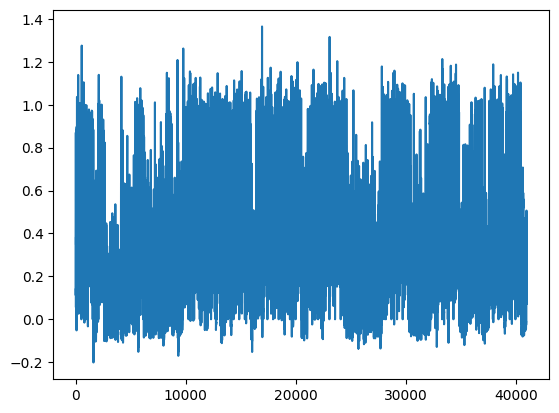

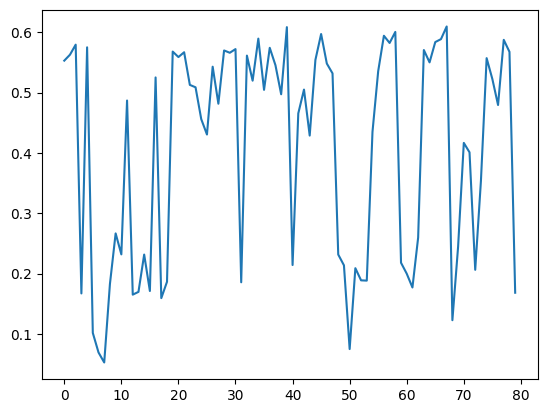

[PPO] Epoch 0: Loss=73.3421, Policy=0.0106, Value=146.6986
[PPO] Epoch 10: Loss=28.9853, Policy=-0.0035, Value=58.0151
[PPO] Epoch 20: Loss=16.0031, Policy=-0.0198, Value=32.0874
[PPO] Epoch 30: Loss=10.5490, Policy=-0.0287, Value=21.2062
Approx KL Learned: 0.08354903757572174
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 21/100 — steps: 2048


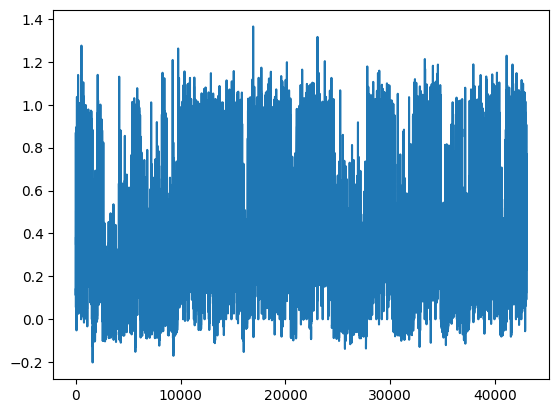

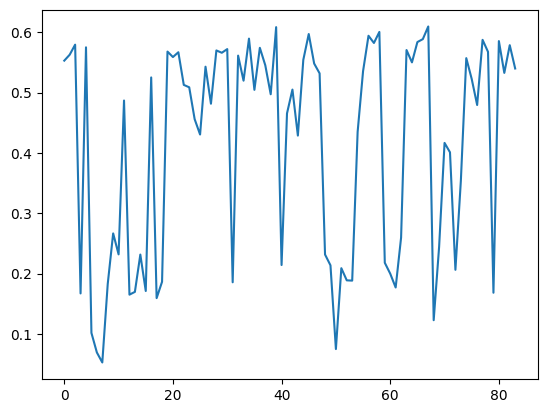

[PPO] Epoch 0: Loss=124.6062, Policy=0.0134, Value=249.2467
[PPO] Epoch 10: Loss=47.6075, Policy=-0.0054, Value=95.2822
[PPO] Epoch 20: Loss=28.0017, Policy=-0.0213, Value=56.1095
[PPO] Epoch 30: Loss=17.5199, Policy=-0.0309, Value=35.1656
Approx KL Learned: 0.15578165650367737
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 22/100 — steps: 2048


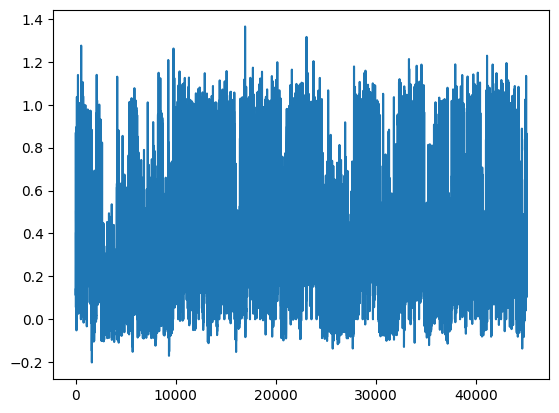

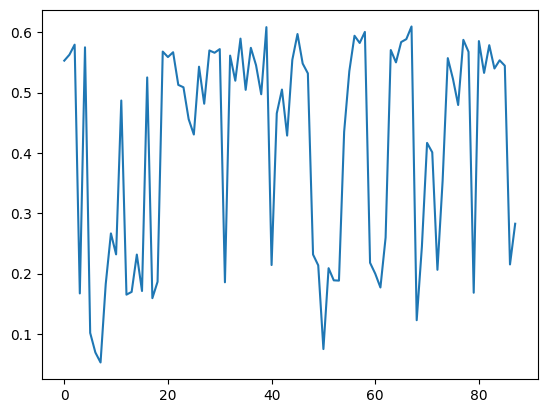

[PPO] Epoch 0: Loss=55.8482, Policy=0.0189, Value=111.6990
[PPO] Epoch 10: Loss=22.5364, Policy=0.0022, Value=45.1131
[PPO] Epoch 20: Loss=11.9368, Policy=-0.0282, Value=23.9766
[PPO] Epoch 30: Loss=12.7988, Policy=-0.0341, Value=25.7102
Approx KL Learned: 0.10570017248392105
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 23/100 — steps: 2048


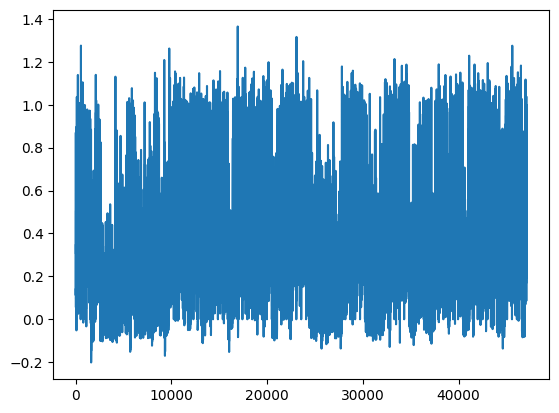

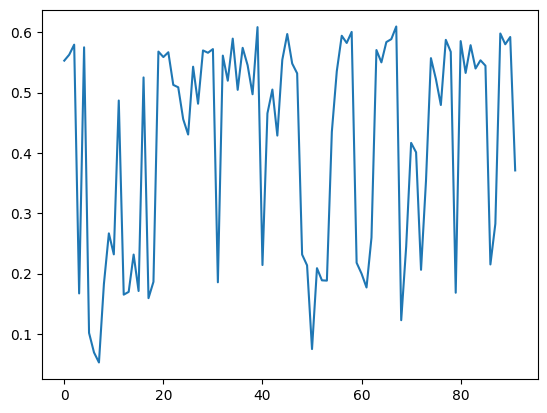

[PPO] Epoch 0: Loss=33.1066, Policy=0.0120, Value=66.2283
[PPO] Epoch 10: Loss=18.4110, Policy=0.0018, Value=36.8537
[PPO] Epoch 20: Loss=11.7801, Policy=-0.0195, Value=23.6396
[PPO] Epoch 30: Loss=7.4449, Policy=-0.0349, Value=15.0013
Approx KL Learned: 0.07244516909122467
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 24/100 — steps: 2048


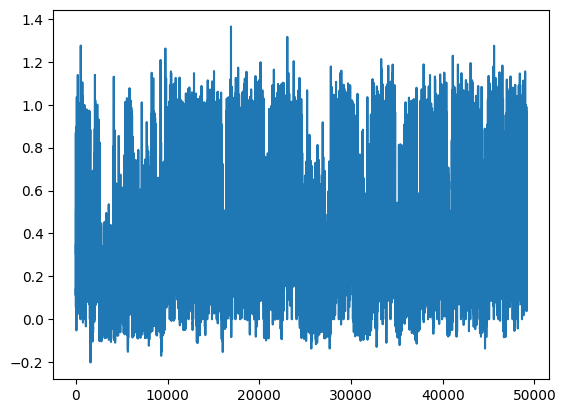

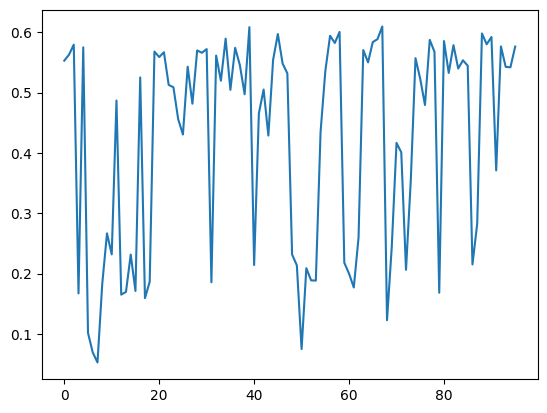

KeyboardInterrupt: 

In [12]:
buf, rewards = train(controller, "clip_actor_critic_checkpoint_long_training.pt", ppo, clip_env, clip_actor_critic, 100)

In [8]:
from rl import load_actor_critic

load_actor_critic(clip_actor_critic, "chkpoint_99.pt")

[🔁] Actor-Critic checkpoint loaded from chkpoint_99.pt


In [10]:
from cons import ACTIONS
from collections import deque
import matplotlib.pyplot as plt
import numpy as np
from typing import Callable
import imageio


def inference(get_distribution: Callable[[torch.Tensor, ActorCritic], torch.distributions.Categorical], init_position: dict[str, float], env: Env, actor_critic: ActorCritic, plot=True):
    n = 256
    n_row = 32
    positions = []

    plt.figure(figsize=(n // n_row * 2, n_row * 2))
    event = teleport(controller, init_position)
    episode_seq = deque(maxlen=EPISODE_STEPS)
    actions_seq = deque(maxlen=EPISODE_STEPS)
    raw_obs = []
    for t in range(1, n + 1):
        positions.append([event.metadata["agent"]["position"]["x"], event.metadata["agent"]["position"]["z"]])
        with torch.no_grad():
            obs_t = ppo.obs_from_event(event)  # (C,H,W)
            obs_t_encoded = actor_critic.actor_critic_encoder(obs_t.unsqueeze(0).unsqueeze(0)).squeeze(0).squeeze(0)
            obs_seq = torch.stack(list(episode_seq) + [obs_t_encoded], dim=0).to(device=DEVICE)

        if len(actions_seq) == 0:
            actions_seq.append(torch.randint(0, NUM_ACTIONS, (1, 1)).item())
        
        actions_tensor = torch.tensor(actions_seq, dtype=torch.long, device=DEVICE).unsqueeze(0)
        dist = get_distribution(obs_seq, actions_tensor, actor_critic)
        action_idx = dist.sample()
        logp = dist.log_prob(action_idx)
        
        action_idx, logp = action_idx.item(), logp.item()
        event, reward = env.step_env(controller, action_idx)

        # store one step
        episode_seq.append(obs_t_encoded)
        actions_seq.append(action_idx)
        raw_obs.append(obs_t)
        
        if plot:
            # Plot frame and action
            plt.subplot(n_row, n // n_row, t)
            plt.title("action: " + ACTIONS[action_idx] + ", r: " + f"{reward:.2f}" + "\n, prob = " + f"{torch.exp(dist.log_prob(torch.tensor([0, 1, 2], device=DEVICE))).cpu().numpy()}", fontsize=5)
            plt.axis(False)
            plt.imshow(event.frame)
    if plot:
        plt.tight_layout()
        plt.show()
        
        # ---- Plot 2D trajectory of the agent ----
        positions = np.array(positions)
        plt.figure(figsize=(4, 4))
        plt.plot(positions[:, 0], positions[:, 1], "-o", markersize=3)
        plt.xlabel("x")
        plt.ylabel("z")
        plt.title("Agent trajectory over n steps")
        plt.grid(True)
        plt.show()

    return raw_obs

def inference_video_mp4(
    get_distribution,
    init_position: dict[str, float],
    env: Env,
    actor_critic: ActorCritic,
    video_path="rollout.mp4",
    fps=10,
    n_steps=256
):
    episode_seq = deque(maxlen=EPISODE_STEPS)
    actions_seq = deque(maxlen=EPISODE_STEPS)

    writer = imageio.get_writer(video_path, fps=fps)

    # start episode
    event = teleport(controller, init_position)
    positions = []

    for t in range(1, n_steps + 1):

        # ---- Add current frame to video ----
        writer.append_data(event.frame)   # convert RGB→BGR if needed

        # track positions
        positions.append([
            event.metadata["agent"]["position"]["x"],
            event.metadata["agent"]["position"]["z"],
        ])

        with torch.no_grad():
            obs_t = ppo.obs_from_event(event)  
            obs_enc = actor_critic.actor_critic_encoder(
                obs_t.unsqueeze(0).unsqueeze(0)
            ).squeeze(0).squeeze(0)

            obs_seq = torch.stack(
                list(episode_seq) + [obs_enc], dim=0
            ).to(DEVICE)

        # ---- Action ----
        if len(actions_seq) == 0:
            actions_seq.append(torch.randint(0, NUM_ACTIONS, ()).item())

        actions_tensor = torch.tensor(
            actions_seq, dtype=torch.long, device=DEVICE
        ).unsqueeze(0)

        dist = get_distribution(obs_seq, actions_tensor, actor_critic)
        action_idx = dist.sample().item()

        # ---- Step env ----
        event, reward = env.step_env(controller, action_idx)

        # ---- Store ----
        episode_seq.append(obs_enc)
        actions_seq.append(action_idx)

    writer.close()
    print(f"[🎞️] Saved video to {video_path}")

    return positions


def get_distributions(obs_seq, actions_tensor, clip_actor_critic):
    logits, value = ppo.act_and_value(obs_seq, actions_tensor, clip_actor_critic)
    dist = torch.distributions.Categorical(logits=logits)
    return dist

event = teleport(controller)
init_pos = event.metadata["agent"]["position"]
init_pos = {'x': 3.25, 'y': 0.9009997844696045, 'z': 5.0}
inference_video_mp4(get_distributions, init_pos, clip_env, clip_actor_critic)

[🎞️] Saved video to rollout.mp4


[[3.25, 5.0],
 [3.25, 5.25],
 [3.25, 5.25],
 [3.375, 5.466506481170654],
 [3.375, 5.466506481170654],
 [3.375, 5.466506481170654],
 [3.375, 5.466506481170654],
 [3.1584935188293457, 5.591506481170654],
 [2.9419870376586914, 5.716506481170654],
 [2.9419870376586914, 5.716506481170654],
 [2.9419870376586914, 5.716506481170654],
 [2.9419870376586914, 5.716506481170654],
 [2.9419870376586914, 5.716506481170654],
 [2.9419870376586914, 5.716506481170654],
 [2.9419870376586914, 5.716506481170654],
 [2.9419870376586914, 5.466506481170654],
 [2.9419870376586914, 5.216506481170654],
 [2.9419870376586914, 4.966506481170654],
 [2.9419870376586914, 4.966506481170654],
 [2.9419870376586914, 4.966506481170654],
 [3.1584932804107666, 4.841506481170654],
 [3.374999523162842, 4.716506481170654],
 [3.591505765914917, 4.591506481170654],
 [3.808012008666992, 4.466506481170654],
 [3.808012008666992, 4.466506481170654],
 [3.808012008666992, 4.466506481170654],
 [3.808012008666992, 4.466506481170654],
 [3.80

In [34]:
!pip install imageio imageio-ffmpeg

In [22]:
import clip

model, preprocess = clip.load("ViT-B/32", device=DEVICE)

In [23]:
import torch
import torch.nn.functional as F
import random

def preprocess_clip(x):
    # Resize to CLIP resolution
    x = F.interpolate(x, size=(224, 224), mode="bilinear", align_corners=False)
    # Normalize (CLIP standard mean/std)
    mean = torch.tensor([0.48145466, 0.4578275, 0.40821073], device=x.device).view(1, 3, 1, 1)
    std  = torch.tensor([0.26862954, 0.26130258, 0.27577711], device=x.device).view(1, 3, 1, 1)
    return (x - mean) / std

def get_average(input_img):
    # ---- 1. Sample 50 random images ----
    n = min(50, len(input_img))
    indices = random.sample(range(len(input_img)), n)
    imgs = torch.stack([input_img[i] for i in indices]).to(DEVICE)  # (50, 3, H, W)

    # ---- 2. Preprocess for CLIP ----
    imgs_clip = preprocess_clip(imgs).half()  # normalized, resized

    # ---- 3. Encode with CLIP visual encoder ----
    with torch.no_grad():
        embeds = model.visual(imgs_clip)       # (50, D)
        embeds = embeds / embeds.norm(dim=-1, keepdim=True)  # normalize to unit sphere

    # ---- 4. Compute cosine similarity ----
    sim_matrix = embeds @ embeds.T             # (50, 50)
    # Optional: remove self-similarity (diagonal = 1)
    sim_matrix.fill_diagonal_(0)

    # ---- 5. Summary statistics ----
    mean_sim = sim_matrix.mean().item()

    return mean_sim

for i in range(5):

    event = teleport(controller)
    init_pos = event.metadata["agent"]["position"]
    
    def get_distributions(obs_seq, actions_tensor, clip_actor_critic):
        logits, value = ppo.act_and_value(obs_seq, actions_tensor, clip_actor_critic)
        dist = torch.distributions.Categorical(logits=logits)
        return dist

    policy = inference(get_distributions, init_pos, clip_env, clip_actor_critic, False)

    def get_distributions(obs_seq, actions_tensor, clip_actor_critic):
        dist = torch.distributions.Categorical(probs=torch.tensor([0.5, 0.25, 0.25], device=DEVICE))
        return dist

    rand_policy = inference(get_distributions, init_pos, clip_env, clip_actor_critic, False)

    mean_policies = []
    mean_rands = []
    for i in range(10):
        mean_policy = get_average(policy)
        mean_rand = get_average(rand_policy)
        mean_policies.append(mean_policy)
        mean_rands.append(mean_rand)
    
    print("Policy: " + str(np.mean(np.array(mean_policies))))
    print("Rand: " + str(np.mean(np.array(mean_rands))))



Policy: 0.877001953125
Rand: 0.86337890625
Policy: 0.87021484375
Rand: 0.8068359375
Policy: 0.83388671875
Rand: 0.845361328125
Policy: 0.8791015625
Rand: 0.876318359375
Policy: 0.80693359375
Rand: 0.79033203125


<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>